The directories of Qian's experiment are listed as follows:

1/ wind + thermal perturbation run:
/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_qian_wthp

2/ wind + thermal +meltwater perturbation run:
/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_qian_wthmp

In [1]:
%matplotlib inline

# Standard modules
import cosima_cookbook as cc
from dask.distributed import Client
import numpy as np
import xarray as xr
import netCDF4 as nc

# For plotting
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import matplotlib.patches as patches
import cmocean as cm

#From file of "Age at the Bottom of the Ocean"
from collections import OrderedDict
import cftime
import glob

#From file of "Cross-slope section"
# For gradient calculation (We will need the topographic gradient to calculate the along-slope velocity component)
import xgcm
# Load metpy module to obtain cross section (Select the conda/analusis3-unstable kernel if you have problems loading this module)
from metpy.interpolate import cross_section

#From file of "barotropic streamfunction"
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# Avoid the Runtime errors in true_divide encountered when trying to divide by zero
import warnings
warnings.filterwarnings('ignore', category = RuntimeWarning) 

import logging
logging.captureWarnings(True)
logging.getLogger('py.warnings').setLevel(logging.ERROR)

In [2]:
client = Client(n_workers=8)
client

Client Scheduler: tcp://127.0.0.1:44985 Dashboard: /proxy/8787/status,Cluster Workers: 8 Cores: 16 Memory: 144.00 GiB


In [3]:
# Load database
session = cc.database.create_session()

# Start a Cosima cookbook database session

In [4]:
# From file of "Exploring the COSIMA Cookbook"
from cosima_cookbook import explore

dbx = explore.DatabaseExplorer(session=session)
dbx

DatabaseExplorer(children=(HTML(value='<style>.header p{ line-height: 1.4; margin-bottom: 10px }</style>\n    …

## Experiment:	01deg_jra55v13_ryf9091

Description:	0.1 degree ACCESS-OM2 global model configuration under the RYF9091 Repeat Year Forcing strategy outlined by Stewart et al. (2020), https://doi.org/10.1016/j.ocemod.2019.101557. The configuration is based on that described in Kiss et al. (2020), https://doi.org/10.5194/gmd-13-401-2020, but with many improvements. Initial conditions are WOA13v2 potential temperature and practical salinity. Run with JRA55-do v1.3 RYF9091 forcing. Spin up starts from a nominal year of 1 Jan 1900 and runs to 31 Dec 2100.

Notes:	Additional daily outputs saved from 1 Jan 1950 to 31 Dec 1969 and 1 Jan 2086 to 31 Dec 2100

Contact:	Andy Hogg <andy.hogg@anu.edu.au>

No. files:	12671

Created:	2020-06-11

In [5]:
# Import variables from experiments, convert temperature to degree Celsius
temp_ryf = cc.querying.getvar(expt='01deg_jra55v13_ryf9091', variable='temp', 
                          session=session, frequency='1 monthly',
                          start_time='2100-01-31 00:00:00', 
                          end_time='2132-03-31 00:00:00') - 273.15
salt_ryf = cc.querying.getvar(expt='01deg_jra55v13_ryf9091', variable='salt', 
                          session=session, frequency='1 monthly',
                          start_time='2100-01-31 00:00:00', 
                          end_time='2132-03-31 00:00:00')

# Latitude range (pan-Antarctic)
lat_min = -90
lat_max = -60
# Select latitude range (solving the groupby time:year errors by adding time slice):
temp_ryf = temp_ryf.sel(yt_ocean = slice(lat_min, lat_max)).sel(time=slice('2100-01-01 00:00:00','2131-12-31 00:00:00'))
salt_ryf = salt_ryf.sel(yt_ocean = slice(lat_min, lat_max)).sel(time=slice('2100-01-01 00:00:00','2131-12-31 00:00:00'))

# load in tcell zstar depth edges for weighted averages calculation
st_edges_ocean_ryf = cc.querying.getvar(expt='01deg_jra55v13_ryf9091', variable='st_edges_ocean', 
                          session=session, frequency='1 monthly',
                          start_time='2100-01-31 00:00:00', 
                          end_time='2132-03-31 00:00:00')

# Make a `land_mask`. This is just a dataarray with `1`'s where you have ocean and `0`'s where you have land. 
# This mask is used to delineate Antarctic continental regions.
ht_ryf = cc.querying.getvar(expt='01deg_jra55v13_ryf9091', variable='ht', session=session, frequency='static', n=1)
ht_ryf = ht_ryf.sel(yt_ocean = slice(lat_min, lat_max)) # Select latitude range
land_mask_ryf = ~ht_ryf.isnull()
shelf_mask_ryf = (land_mask_ryf.where(ht_ryf < 1000))

# load in area for weighted average over areas
area_t_ryf = cc.querying.getvar(expt='01deg_jra55v13_ryf9091', variable='area_t',  session=session, frequency='static', n=1)
area_t_ryf = area_t_ryf.sel(yt_ocean = slice(lat_min, lat_max))
area_t_ryf = area_t_ryf.fillna(0) #`weights` cannot contain missing values. Missing values can be replaced by `weights.fillna(0).

## Experiment:	01deg_jra55v13_ryf9091_qian_wthp

Description:	Wind, thermal and humidity perturbation experiment based on CMIP6 future scenario (SSP5-8.5), plus meltwater perturbation

Notes:	If you require any further information, feel free to contact Qian.

Contact:	Qian Li <qian.li5@unsw.edu.au>

No. files:	410

Created:	2021-04-20

In [6]:
# Import variables from experiments, convert temperature to degree Celsius
temp_wthp = cc.querying.getvar(expt='01deg_jra55v13_ryf9091_qian_wthp', variable='temp', 
                          session=session, frequency='1 monthly',
                          start_time='2100-01-31 00:00:00', 
                          end_time='2132-03-31 00:00:00') - 273.15
salt_wthp = cc.querying.getvar(expt='01deg_jra55v13_ryf9091_qian_wthp', variable='salt', 
                          session=session, frequency='1 monthly',
                          start_time='2100-01-31 00:00:00', 
                          end_time='2132-03-31 00:00:00')

# Latitude range (pan-Antarctic)
lat_min = -90
lat_max = -60
# Select latitude range (solving the groupby time:year errors by adding time slice):
temp_wthp = temp_wthp.sel(yt_ocean = slice(lat_min, lat_max)).sel(time=slice('2100-01-01 00:00:00','2131-12-31 00:00:00'))
salt_wthp = salt_wthp.sel(yt_ocean = slice(lat_min, lat_max)).sel(time=slice('2100-01-01 00:00:00','2131-12-31 00:00:00'))

# load in tcell zstar depth edges for weighted averages calculation
st_edges_ocean_wthp = cc.querying.getvar(expt='01deg_jra55v13_ryf9091_qian_wthp', variable='st_edges_ocean', 
                          session=session, frequency='1 monthly',
                          start_time='2100-01-31 00:00:00', 
                          end_time='2132-03-31 00:00:00')

# Make a `land_mask`. This is just a dataarray with `1`'s where you have ocean and `0`'s where you have land. 
# This mask is used to delineate Antarctic continental regions.
ht_wthp = cc.querying.getvar(expt='01deg_jra55v13_ryf9091_qian_wthp', variable='ht', session=session, frequency='static', n=1)
ht_wthp = ht_wthp.sel(yt_ocean = slice(lat_min, lat_max))
land_mask_wthp = ~ht_wthp.isnull()
shelf_mask_wthp = (land_mask_wthp.where(ht_wthp < 1000))

# load in area for weighted average over areas
area_t_wthp = cc.querying.getvar(expt='01deg_jra55v13_ryf9091_qian_wthp', variable='area_t',  session=session, frequency='static', n=1)
area_t_wthp = area_t_wthp.sel(yt_ocean = slice(lat_min, lat_max))
area_t_wthp = area_t_wthp.fillna(0) #`weights` cannot contain missing values. Missing values can be replaced by `weights.fillna(0).

## Experiment:	01deg_jra55v13_ryf9091_qian_wthmp

Description:	Wind, thermal and humidity perturbation experiment based on CMIP6 future scenario (SSP5-8.5)

Notes:	If you require any further information, feel free to contact Qian.

Contact:	Qian Li <qian.li5@unsw.edu.au>

No. files:	390

Created:	2021-04-20

In [7]:
# Import variables from experiments, convert temperature to degree Celsius
temp_wthmp = cc.querying.getvar(expt='01deg_jra55v13_ryf9091_qian_wthmp', variable='temp', 
                          session=session, frequency='1 monthly',
                          start_time='2110-01-31 00:00:00', 
                          end_time='2132-03-31 00:00:00') - 273.15
salt_wthmp = cc.querying.getvar(expt='01deg_jra55v13_ryf9091_qian_wthmp', variable='salt', 
                          session=session, frequency='1 monthly',
                          start_time='2110-01-31 00:00:00', 
                          end_time='2132-03-31 00:00:00')

# Latitude range (pan-Antarctic)
lat_min = -90
lat_max = -60
# Select latitude range (solving the groupby time:year errors by adding time slice):
temp_wthmp = temp_wthmp.sel(yt_ocean = slice(lat_min, lat_max)).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
salt_wthmp = salt_wthmp.sel(yt_ocean = slice(lat_min, lat_max)).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))

# load in tcell zstar depth edges for weighted averages calculation
st_edges_ocean_wthmp = cc.querying.getvar(expt='01deg_jra55v13_ryf9091_qian_wthmp', variable='st_edges_ocean', 
                          session=session, frequency='1 monthly',
                          start_time='2110-01-31 00:00:00', 
                          end_time='2132-03-31 00:00:00')

# Make a `land_mask`. This is just a dataarray with `1`'s where you have ocean and `0`'s where you have land. 
# This mask is used to delineate Antarctic continental regions.
ht_wthmp = cc.querying.getvar(expt='01deg_jra55v13_ryf9091_qian_wthmp', variable='ht', session=session, frequency='static', n=1)
ht_wthmp = ht_wthmp.sel(yt_ocean = slice(lat_min, lat_max))
land_mask_wthmp = ~ht_wthmp.isnull()
shelf_mask_wthmp = (land_mask_wthmp.where(ht_wthmp < 1000))

# load in area for weighted average over areas
area_t_wthmp = cc.querying.getvar(expt='01deg_jra55v13_ryf9091_qian_wthmp', variable='area_t',  session=session, frequency='static', n=1)
area_t_wthmp = area_t_wthmp.sel(yt_ocean = slice(lat_min, lat_max))
area_t_wthmp = area_t_wthmp.fillna(0) #`weights` cannot contain missing values. Missing values can be replaced by `weights.fillna(0).

## Functions for selecting slices

In [8]:
# Functions for selecting slice of different depths
# Select slice of ocean at surface and 250m depth:
def slice_depth(var_expt,st_depth,shelf_mask_expt):
    var_depth_expt = var_expt.sel(st_ocean=st_depth, method='nearest')
    var_depth_shelf_expt = var_depth_expt*shelf_mask_expt
    return var_depth_shelf_expt

# Select slice at sea floor:
def slice_bottom(var_expt,shelf_mask_expt):
    var_depth_array_expt = var_expt * 0 + var_expt.st_ocean # Array that has the depth levels
    var_max_depth_expt   = var_depth_array_expt.max(dim='st_ocean', skipna=True) # Get max depth of data (skipping nans)
    # Select the temp using max_depth
    # Bottom is where the depth level is larger/equal the max depth
    var_bottom_expt = var_expt.where(var_depth_array_expt.st_ocean >= var_max_depth_expt)
    var_bottom_expt = var_bottom_expt.sum(dim='st_ocean')
    var_bottom_shelf_expt = var_bottom_expt*shelf_mask_expt
    return var_bottom_shelf_expt

# Weighted average with all depths
def average_st(var_expt,shelf_mask_expt,st_edges_ocean_expt):
    thickness_values_expt = np.diff(st_edges_ocean_expt)
    thickness_expt = xr.DataArray(data=thickness_values_expt,dims=["st_ocean"],coords=dict(st_ocean=var_expt.st_ocean.values,),)
    #for coords, st_ocean=var.st_ocean.values.
    weights_st_expt = thickness_expt
    var_st_expt = var_expt.weighted(weights_st_expt).mean('st_ocean')
    var_st_shelf_expt = var_st_expt*shelf_mask_expt
    return var_st_shelf_expt

In [9]:
# Select slice of ocean at surface and 250m depth:
temp_surface_shelf_ryf = slice_depth(temp_ryf,0,shelf_mask_ryf)
salt_surface_shelf_ryf = slice_depth(salt_ryf,0,shelf_mask_ryf)
temp_250m_shelf_ryf = slice_depth(temp_ryf,250,shelf_mask_ryf)
salt_250m_shelf_ryf = slice_depth(salt_ryf,250,shelf_mask_ryf)
temp_surface_shelf_wthp = slice_depth(temp_wthp,0,shelf_mask_wthp)
salt_surface_shelf_wthp = slice_depth(salt_wthp,0,shelf_mask_wthp)
temp_250m_shelf_wthp = slice_depth(temp_wthp,250,shelf_mask_wthp)
salt_250m_shelf_wthp = slice_depth(salt_wthp,250,shelf_mask_wthp)
temp_surface_shelf_wthmp = slice_depth(temp_wthmp,0,shelf_mask_wthmp)
salt_surface_shelf_wthmp = slice_depth(salt_wthmp,0,shelf_mask_wthmp)
temp_250m_shelf_wthmp = slice_depth(temp_wthmp,250,shelf_mask_wthmp)
salt_250m_shelf_wthmp = slice_depth(salt_wthmp,250,shelf_mask_wthmp)
# Select slice at sea floor:
temp_bottom_shelf_ryf = slice_bottom(temp_ryf,shelf_mask_ryf)
salt_bottom_shelf_ryf = slice_bottom(salt_ryf,shelf_mask_ryf)
temp_bottom_shelf_wthp = slice_bottom(temp_wthp,shelf_mask_wthp)
salt_bottom_shelf_wthp = slice_bottom(salt_wthp,shelf_mask_wthp)
temp_bottom_shelf_wthmp = slice_bottom(temp_wthmp,shelf_mask_wthmp)
salt_bottom_shelf_wthmp = slice_bottom(salt_wthmp,shelf_mask_wthmp)
# Weighted average with all depths
temp_st_shelf_ryf = average_st(temp_ryf,shelf_mask_ryf,st_edges_ocean_ryf)
salt_st_shelf_ryf = average_st(salt_ryf,shelf_mask_ryf,st_edges_ocean_ryf)
temp_st_shelf_wthp = average_st(temp_wthp,shelf_mask_wthp,st_edges_ocean_wthp)
salt_st_shelf_wthp = average_st(salt_wthp,shelf_mask_wthp,st_edges_ocean_wthp)
temp_st_shelf_wthmp = average_st(temp_wthmp,shelf_mask_wthmp,st_edges_ocean_wthmp)
salt_st_shelf_wthmp = average_st(salt_wthmp,shelf_mask_wthmp,st_edges_ocean_wthmp)

In [10]:
# Experimental anomaly
temp_st_shelf_warmanom = (temp_st_shelf_wthp - temp_st_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
temp_st_shelf_meltanom = (temp_st_shelf_wthmp - temp_st_shelf_wthp).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
temp_st_shelf_warmmeltanom = (temp_st_shelf_wthmp - temp_st_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))

temp_surface_shelf_warmanom = (temp_surface_shelf_wthp - temp_surface_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
temp_surface_shelf_meltanom = (temp_surface_shelf_wthmp - temp_surface_shelf_wthp).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
temp_surface_shelf_warmmeltanom = (temp_surface_shelf_wthmp - temp_surface_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))

temp_250m_shelf_warmanom = (temp_250m_shelf_wthp - temp_250m_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
temp_250m_shelf_meltanom = (temp_250m_shelf_wthmp - temp_250m_shelf_wthp).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
temp_250m_shelf_warmmeltanom = (temp_250m_shelf_wthmp - temp_250m_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))

temp_bottom_shelf_warmanom = (temp_bottom_shelf_wthp - temp_bottom_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
temp_bottom_shelf_meltanom = (temp_bottom_shelf_wthmp - temp_bottom_shelf_wthp).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
temp_bottom_shelf_warmmeltanom = (temp_bottom_shelf_wthmp - temp_bottom_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))

salt_st_shelf_warmanom = (salt_st_shelf_wthp - salt_st_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
salt_st_shelf_meltanom = (salt_st_shelf_wthmp - salt_st_shelf_wthp).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
salt_st_shelf_warmmeltanom = (salt_st_shelf_wthmp - salt_st_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))

salt_surface_shelf_warmanom = (salt_surface_shelf_wthp - salt_surface_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
salt_surface_shelf_meltanom = (salt_surface_shelf_wthmp - salt_surface_shelf_wthp).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
salt_surface_shelf_warmmeltanom = (salt_surface_shelf_wthmp - salt_surface_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))

salt_250m_shelf_warmanom = (salt_250m_shelf_wthp - salt_250m_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
salt_250m_shelf_meltanom = (salt_250m_shelf_wthmp - salt_250m_shelf_wthp).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
salt_250m_shelf_warmmeltanom = (salt_250m_shelf_wthmp - salt_250m_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))

salt_bottom_shelf_warmanom = (salt_bottom_shelf_wthp - salt_bottom_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
salt_bottom_shelf_meltanom = (salt_bottom_shelf_wthmp - salt_bottom_shelf_wthp).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
salt_bottom_shelf_warmmeltanom = (salt_bottom_shelf_wthmp - salt_bottom_shelf_ryf).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))

# Region Selection

Weddell Sea polynyas, Ross Sea polynya, Mertz Glacier polynya and Cape Darnley polynya are selected as four different shelf regions (surface, 250m and averaging over all depths) for comparison as a practice.

Text(0.5, 1.0, 'Antarctic shelf region from -90N to -60N [C]')

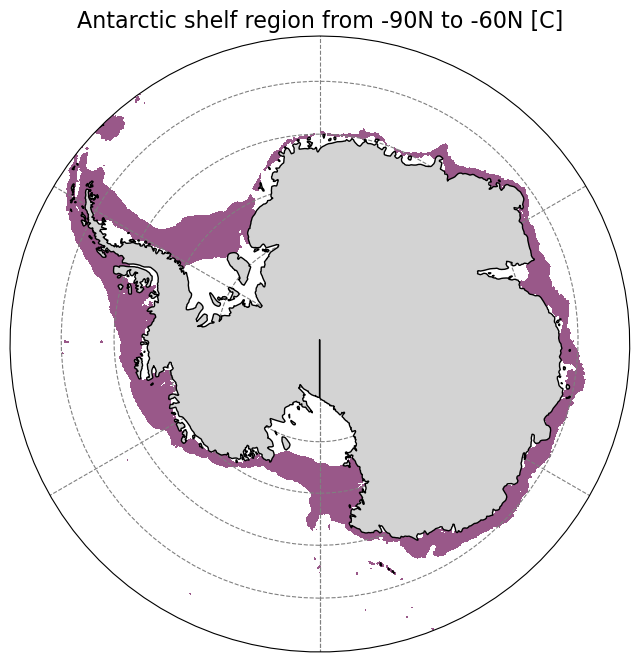

In [11]:
fig = plt.figure(figsize = (12, 8))
ax = fig.add_subplot(111, projection = ccrs.SouthPolarStereo())
ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())

# Map the plot boundaries to a circle
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
# Add land features and gridlines
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='black',
                                            facecolor='lightgray'), zorder = 2)
ax.gridlines(color='grey', linestyle='--')
# Plot the shelf region
cf = ax.contourf(shelf_mask_wthp['xt_ocean'], shelf_mask_wthp['yt_ocean'], shelf_mask_wthp, cmap = cm.cm.thermal, 
                 extend = 'both', transform = ccrs.PlateCarree())
plt.title('Antarctic shelf region from -90N to -60N [C]', fontsize=16)

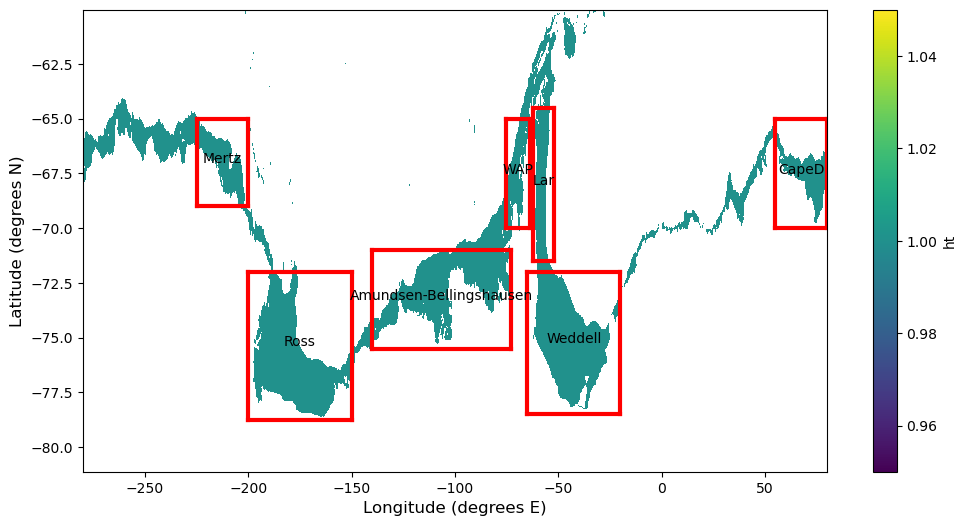

In [12]:
fig=plt.figure(2,(12,6))
ax = plt.subplot()
shelf_mask_wthp.plot() 
#or shelf_mask_ryf.plot()
#or shelf_mask_wthmp.plot()
plt.xlabel('Longitude (degrees E)', fontsize=12)
plt.ylabel('Latitude (degrees N)', fontsize=12)

def drawing_boxes(bottomleft_lon,bottomleft_lat,topright_lon,topright_lat,region_name):
    ax.plot([bottomleft_lon,topright_lon], [bottomleft_lat,bottomleft_lat], 'r', linewidth = 3)
    ax.plot([bottomleft_lon,topright_lon], [topright_lat,topright_lat], 'r', linewidth = 3)
    ax.plot([bottomleft_lon,bottomleft_lon], [bottomleft_lat,topright_lat], 'r', linewidth = 3)
    ax.plot([topright_lon,topright_lon], [bottomleft_lat,topright_lat], 'r', linewidth = 3)
    plt.text((bottomleft_lon+topright_lon)/2, (bottomleft_lat+topright_lat)/2, region_name, horizontalalignment='center')

drawing_boxes(-225,-69,-200,-65,'Mertz') #Mertz Glacier shelf region
drawing_boxes(-200,-78.75,-150,-72,'Ross') #Ross Sea coastal shelf region
drawing_boxes(-140,-75.5,-73,-71,'Amundsen-Bellingshausen') #Amundsen-Bellingshausen Seas shelf region
drawing_boxes(-75.5,-70,-63.5,-65,'WAP') #West Antarctic Peninsula shelf region
drawing_boxes(-62,-71.5,-52,-64.5,'Lar') #Larsen shelf region
drawing_boxes(-65,-78.5,-20,-72,'Weddell') #Weddell Sea coastal shelf region
drawing_boxes(55,-70,80,-65,'CapeD') #Cape Darnley shelf region

### Functions for regional monthly mean

In [13]:
def monthly_mean(var,area_t_expt,bottomleft_lon,bottomleft_lat,topright_lon,topright_lat):
    var_regional = var.sel(xt_ocean=slice(bottomleft_lon,topright_lon),yt_ocean=slice(bottomleft_lat,topright_lat)).weighted(area_t_expt)
    #Create time series for different regions by averaging over lon-lat (359 months)
    var_regional_mean = var_regional.mean(("xt_ocean", "yt_ocean"))
    return var_regional_mean

In [14]:
#For each region
temp_st_shelf_ryf_Mertz_monthly_mean = monthly_mean(temp_st_shelf_ryf,area_t_ryf,-225,-69,-200,-65)
temp_surface_shelf_ryf_Mertz_monthly_mean = monthly_mean(temp_surface_shelf_ryf,area_t_ryf,-225,-69,-200,-65)
temp_250m_shelf_ryf_Mertz_monthly_mean = monthly_mean(temp_250m_shelf_ryf,area_t_ryf,-225,-69,-200,-65)
temp_bottom_shelf_ryf_Mertz_monthly_mean = monthly_mean(temp_bottom_shelf_ryf,area_t_ryf,-225,-69,-200,-65)
temp_st_shelf_wthp_Mertz_monthly_mean = monthly_mean(temp_st_shelf_wthp,area_t_wthp,-225,-69,-200,-65)
temp_surface_shelf_wthp_Mertz_monthly_mean = monthly_mean(temp_surface_shelf_wthp,area_t_wthp,-225,-69,-200,-65)
temp_250m_shelf_wthp_Mertz_monthly_mean = monthly_mean(temp_250m_shelf_wthp,area_t_wthp,-225,-69,-200,-65)
temp_bottom_shelf_wthp_Mertz_monthly_mean = monthly_mean(temp_bottom_shelf_wthp,area_t_wthp,-225,-69,-200,-65)
temp_st_shelf_wthmp_Mertz_monthly_mean = monthly_mean(temp_st_shelf_wthmp,area_t_wthmp,-225,-69,-200,-65)
temp_surface_shelf_wthmp_Mertz_monthly_mean = monthly_mean(temp_surface_shelf_wthmp,area_t_wthmp,-225,-69,-200,-65)
temp_250m_shelf_wthmp_Mertz_monthly_mean = monthly_mean(temp_250m_shelf_wthmp,area_t_wthmp,-225,-69,-200,-65)
temp_bottom_shelf_wthmp_Mertz_monthly_mean = monthly_mean(temp_bottom_shelf_wthmp,area_t_wthmp,-225,-69,-200,-65)
salt_st_shelf_ryf_Mertz_monthly_mean = monthly_mean(salt_st_shelf_ryf,area_t_ryf,-225,-69,-200,-65)
salt_surface_shelf_ryf_Mertz_monthly_mean = monthly_mean(salt_surface_shelf_ryf,area_t_ryf,-225,-69,-200,-65)
salt_250m_shelf_ryf_Mertz_monthly_mean = monthly_mean(salt_250m_shelf_ryf,area_t_ryf,-225,-69,-200,-65)
salt_bottom_shelf_ryf_Mertz_monthly_mean = monthly_mean(salt_bottom_shelf_ryf,area_t_ryf,-225,-69,-200,-65)
salt_st_shelf_wthp_Mertz_monthly_mean = monthly_mean(salt_st_shelf_wthp,area_t_wthp,-225,-69,-200,-65)
salt_surface_shelf_wthp_Mertz_monthly_mean = monthly_mean(salt_surface_shelf_wthp,area_t_wthp,-225,-69,-200,-65)
salt_250m_shelf_wthp_Mertz_monthly_mean = monthly_mean(salt_250m_shelf_wthp,area_t_wthp,-225,-69,-200,-65)
salt_bottom_shelf_wthp_Mertz_monthly_mean = monthly_mean(salt_bottom_shelf_wthp,area_t_wthp,-225,-69,-200,-65)
salt_st_shelf_wthmp_Mertz_monthly_mean = monthly_mean(salt_st_shelf_wthmp,area_t_wthmp,-225,-69,-200,-65)
salt_surface_shelf_wthmp_Mertz_monthly_mean = monthly_mean(salt_surface_shelf_wthmp,area_t_wthmp,-225,-69,-200,-65)
salt_250m_shelf_wthmp_Mertz_monthly_mean = monthly_mean(salt_250m_shelf_wthmp,area_t_wthmp,-225,-69,-200,-65)
salt_bottom_shelf_wthmp_Mertz_monthly_mean = monthly_mean(salt_bottom_shelf_wthmp,area_t_wthmp,-225,-69,-200,-65)

temp_st_shelf_ryf_Ross_monthly_mean = monthly_mean(temp_st_shelf_ryf,area_t_ryf,-200,-78.75,-150,-72)
temp_surface_shelf_ryf_Ross_monthly_mean = monthly_mean(temp_surface_shelf_ryf,area_t_ryf,-200,-78.75,-150,-72)
temp_250m_shelf_ryf_Ross_monthly_mean = monthly_mean(temp_250m_shelf_ryf,area_t_ryf,-200,-78.75,-150,-72)
temp_bottom_shelf_ryf_Ross_monthly_mean = monthly_mean(temp_bottom_shelf_ryf,area_t_ryf,-200,-78.75,-150,-72)
temp_st_shelf_wthp_Ross_monthly_mean = monthly_mean(temp_st_shelf_wthp,area_t_wthp,-200,-78.75,-150,-72)
temp_surface_shelf_wthp_Ross_monthly_mean = monthly_mean(temp_surface_shelf_wthp,area_t_wthp,-200,-78.75,-150,-72)
temp_250m_shelf_wthp_Ross_monthly_mean = monthly_mean(temp_250m_shelf_wthp,area_t_wthp,-200,-78.75,-150,-72)
temp_bottom_shelf_wthp_Ross_monthly_mean = monthly_mean(temp_bottom_shelf_wthp,area_t_wthp,-200,-78.75,-150,-72)
temp_st_shelf_wthmp_Ross_monthly_mean = monthly_mean(temp_st_shelf_wthmp,area_t_wthmp,-200,-78.75,-150,-72)
temp_surface_shelf_wthmp_Ross_monthly_mean = monthly_mean(temp_surface_shelf_wthmp,area_t_wthmp,-200,-78.75,-150,-72)
temp_250m_shelf_wthmp_Ross_monthly_mean = monthly_mean(temp_250m_shelf_wthmp,area_t_wthmp,-200,-78.75,-150,-72)
temp_bottom_shelf_wthmp_Ross_monthly_mean = monthly_mean(temp_bottom_shelf_wthmp,area_t_wthmp,-200,-78.75,-150,-72)
salt_st_shelf_ryf_Ross_monthly_mean = monthly_mean(salt_st_shelf_ryf,area_t_ryf,-200,-78.75,-150,-72)
salt_surface_shelf_ryf_Ross_monthly_mean = monthly_mean(salt_surface_shelf_ryf,area_t_ryf,-200,-78.75,-150,-72)
salt_250m_shelf_ryf_Ross_monthly_mean = monthly_mean(salt_250m_shelf_ryf,area_t_ryf,-200,-78.75,-150,-72)
salt_bottom_shelf_ryf_Ross_monthly_mean = monthly_mean(salt_bottom_shelf_ryf,area_t_ryf,-200,-78.75,-150,-72)
salt_st_shelf_wthp_Ross_monthly_mean = monthly_mean(salt_st_shelf_wthp,area_t_wthp,-200,-78.75,-150,-72)
salt_surface_shelf_wthp_Ross_monthly_mean = monthly_mean(salt_surface_shelf_wthp,area_t_wthp,-200,-78.75,-150,-72)
salt_250m_shelf_wthp_Ross_monthly_mean = monthly_mean(salt_250m_shelf_wthp,area_t_wthp,-200,-78.75,-150,-72)
salt_bottom_shelf_wthp_Ross_monthly_mean = monthly_mean(salt_bottom_shelf_wthp,area_t_wthp,-200,-78.75,-150,-72)
salt_st_shelf_wthmp_Ross_monthly_mean = monthly_mean(salt_st_shelf_wthmp,area_t_wthmp,-200,-78.75,-150,-72)
salt_surface_shelf_wthmp_Ross_monthly_mean = monthly_mean(salt_surface_shelf_wthmp,area_t_wthmp,-200,-78.75,-150,-72)
salt_250m_shelf_wthmp_Ross_monthly_mean = monthly_mean(salt_250m_shelf_wthmp,area_t_wthmp,-200,-78.75,-150,-72)
salt_bottom_shelf_wthmp_Ross_monthly_mean = monthly_mean(salt_bottom_shelf_wthmp,area_t_wthmp,-200,-78.75,-150,-72)

temp_st_shelf_ryf_AB_monthly_mean = monthly_mean(temp_st_shelf_ryf,area_t_ryf,-140,-75.5,-73,-71)
temp_surface_shelf_ryf_AB_monthly_mean = monthly_mean(temp_surface_shelf_ryf,area_t_ryf,-140,-75.5,-73,-71)
temp_250m_shelf_ryf_AB_monthly_mean = monthly_mean(temp_250m_shelf_ryf,area_t_ryf,-140,-75.5,-73,-71)
temp_bottom_shelf_ryf_AB_monthly_mean = monthly_mean(temp_bottom_shelf_ryf,area_t_ryf,-140,-75.5,-73,-71)
temp_st_shelf_wthp_AB_monthly_mean = monthly_mean(temp_st_shelf_wthp,area_t_wthp,-140,-75.5,-73,-71)
temp_surface_shelf_wthp_AB_monthly_mean = monthly_mean(temp_surface_shelf_wthp,area_t_wthp,-140,-75.5,-73,-71)
temp_250m_shelf_wthp_AB_monthly_mean = monthly_mean(temp_250m_shelf_wthp,area_t_wthp,-140,-75.5,-73,-71)
temp_bottom_shelf_wthp_AB_monthly_mean = monthly_mean(temp_bottom_shelf_wthp,area_t_wthp,-140,-75.5,-73,-71)
temp_st_shelf_wthmp_AB_monthly_mean = monthly_mean(temp_st_shelf_wthmp,area_t_wthmp,-140,-75.5,-73,-71)
temp_surface_shelf_wthmp_AB_monthly_mean = monthly_mean(temp_surface_shelf_wthmp,area_t_wthmp,-140,-75.5,-73,-71)
temp_250m_shelf_wthmp_AB_monthly_mean = monthly_mean(temp_250m_shelf_wthmp,area_t_wthmp,-140,-75.5,-73,-71)
temp_bottom_shelf_wthmp_AB_monthly_mean = monthly_mean(temp_bottom_shelf_wthmp,area_t_wthmp,-140,-75.5,-73,-71)
salt_st_shelf_ryf_AB_monthly_mean = monthly_mean(salt_st_shelf_ryf,area_t_ryf,-140,-75.5,-73,-71)
salt_surface_shelf_ryf_AB_monthly_mean = monthly_mean(salt_surface_shelf_ryf,area_t_ryf,-140,-75.5,-73,-71)
salt_250m_shelf_ryf_AB_monthly_mean = monthly_mean(salt_250m_shelf_ryf,area_t_ryf,-140,-75.5,-73,-71)
salt_bottom_shelf_ryf_AB_monthly_mean = monthly_mean(salt_bottom_shelf_ryf,area_t_ryf,-140,-75.5,-73,-71)
salt_st_shelf_wthp_AB_monthly_mean = monthly_mean(salt_st_shelf_wthp,area_t_wthp,-140,-75.5,-73,-71)
salt_surface_shelf_wthp_AB_monthly_mean = monthly_mean(salt_surface_shelf_wthp,area_t_wthp,-140,-75.5,-73,-71)
salt_250m_shelf_wthp_AB_monthly_mean = monthly_mean(salt_250m_shelf_wthp,area_t_wthp,-140,-75.5,-73,-71)
salt_bottom_shelf_wthp_AB_monthly_mean = monthly_mean(salt_bottom_shelf_wthp,area_t_wthp,-140,-75.5,-73,-71)
salt_st_shelf_wthmp_AB_monthly_mean = monthly_mean(salt_st_shelf_wthmp,area_t_wthmp,-140,-75.5,-73,-71)
salt_surface_shelf_wthmp_AB_monthly_mean = monthly_mean(salt_surface_shelf_wthmp,area_t_wthmp,-140,-75.5,-73,-71)
salt_250m_shelf_wthmp_AB_monthly_mean = monthly_mean(salt_250m_shelf_wthmp,area_t_wthmp,-140,-75.5,-73,-71)
salt_bottom_shelf_wthmp_AB_monthly_mean = monthly_mean(salt_bottom_shelf_wthmp,area_t_wthmp,-140,-75.5,-73,-71)

temp_st_shelf_ryf_WAP_monthly_mean = monthly_mean(temp_st_shelf_ryf,area_t_ryf,-75.5,-70,-63.5,-65)
temp_surface_shelf_ryf_WAP_monthly_mean = monthly_mean(temp_surface_shelf_ryf,area_t_ryf,-75.5,-70,-63.5,-65)
temp_250m_shelf_ryf_WAP_monthly_mean = monthly_mean(temp_250m_shelf_ryf,area_t_ryf,-75.5,-70,-63.5,-65)
temp_bottom_shelf_ryf_WAP_monthly_mean = monthly_mean(temp_bottom_shelf_ryf,area_t_ryf,-75.5,-70,-63.5,-65)
temp_st_shelf_wthp_WAP_monthly_mean = monthly_mean(temp_st_shelf_wthp,area_t_wthp,-75.5,-70,-63.5,-65)
temp_surface_shelf_wthp_WAP_monthly_mean = monthly_mean(temp_surface_shelf_wthp,area_t_wthp,-75.5,-70,-63.5,-65)
temp_250m_shelf_wthp_WAP_monthly_mean = monthly_mean(temp_250m_shelf_wthp,area_t_wthp,-75.5,-70,-63.5,-65)
temp_bottom_shelf_wthp_WAP_monthly_mean = monthly_mean(temp_bottom_shelf_wthp,area_t_wthp,-75.5,-70,-63.5,-65)
temp_st_shelf_wthmp_WAP_monthly_mean = monthly_mean(temp_st_shelf_wthmp,area_t_wthmp,-75.5,-70,-63.5,-65)
temp_surface_shelf_wthmp_WAP_monthly_mean = monthly_mean(temp_surface_shelf_wthmp,area_t_wthmp,-75.5,-70,-63.5,-65)
temp_250m_shelf_wthmp_WAP_monthly_mean = monthly_mean(temp_250m_shelf_wthmp,area_t_wthmp,-75.5,-70,-63.5,-65)
temp_bottom_shelf_wthmp_WAP_monthly_mean = monthly_mean(temp_bottom_shelf_wthmp,area_t_wthmp,-75.5,-70,-63.5,-65)
salt_st_shelf_ryf_WAP_monthly_mean = monthly_mean(salt_st_shelf_ryf,area_t_ryf,-75.5,-70,-63.5,-65)
salt_surface_shelf_ryf_WAP_monthly_mean = monthly_mean(salt_surface_shelf_ryf,area_t_ryf,-75.5,-70,-63.5,-65)
salt_250m_shelf_ryf_WAP_monthly_mean = monthly_mean(salt_250m_shelf_ryf,area_t_ryf,-75.5,-70,-63.5,-65)
salt_bottom_shelf_ryf_WAP_monthly_mean = monthly_mean(salt_bottom_shelf_ryf,area_t_ryf,-75.5,-70,-63.5,-65)
salt_st_shelf_wthp_WAP_monthly_mean = monthly_mean(salt_st_shelf_wthp,area_t_wthp,-75.5,-70,-63.5,-65)
salt_surface_shelf_wthp_WAP_monthly_mean = monthly_mean(salt_surface_shelf_wthp,area_t_wthp,-75.5,-70,-63.5,-65)
salt_250m_shelf_wthp_WAP_monthly_mean = monthly_mean(salt_250m_shelf_wthp,area_t_wthp,-75.5,-70,-63.5,-65)
salt_bottom_shelf_wthp_WAP_monthly_mean = monthly_mean(salt_bottom_shelf_wthp,area_t_wthp,-75.5,-70,-63.5,-65)
salt_st_shelf_wthmp_WAP_monthly_mean = monthly_mean(salt_st_shelf_wthmp,area_t_wthmp,-75.5,-70,-63.5,-65)
salt_surface_shelf_wthmp_WAP_monthly_mean = monthly_mean(salt_surface_shelf_wthmp,area_t_wthmp,-75.5,-70,-63.5,-65)
salt_250m_shelf_wthmp_WAP_monthly_mean = monthly_mean(salt_250m_shelf_wthmp,area_t_wthmp,-75.5,-70,-63.5,-65)
salt_bottom_shelf_wthmp_WAP_monthly_mean = monthly_mean(salt_bottom_shelf_wthmp,area_t_wthmp,-75.5,-70,-63.5,-65)

temp_st_shelf_ryf_Larsen_monthly_mean = monthly_mean(temp_st_shelf_ryf,area_t_ryf,-62,-71.5,-52,-64.5)
temp_surface_shelf_ryf_Larsen_monthly_mean = monthly_mean(temp_surface_shelf_ryf,area_t_ryf,-62,-71.5,-52,-64.5)
temp_250m_shelf_ryf_Larsen_monthly_mean = monthly_mean(temp_250m_shelf_ryf,area_t_ryf,-62,-71.5,-52,-64.5)
temp_bottom_shelf_ryf_Larsen_monthly_mean = monthly_mean(temp_bottom_shelf_ryf,area_t_ryf,-62,-71.5,-52,-64.5)
temp_st_shelf_wthp_Larsen_monthly_mean = monthly_mean(temp_st_shelf_wthp,area_t_wthp,-62,-71.5,-52,-64.5)
temp_surface_shelf_wthp_Larsen_monthly_mean = monthly_mean(temp_surface_shelf_wthp,area_t_wthp,-62,-71.5,-52,-64.5)
temp_250m_shelf_wthp_Larsen_monthly_mean = monthly_mean(temp_250m_shelf_wthp,area_t_wthp,-62,-71.5,-52,-64.5)
temp_bottom_shelf_wthp_Larsen_monthly_mean = monthly_mean(temp_bottom_shelf_wthp,area_t_wthp,-62,-71.5,-52,-64.5)
temp_st_shelf_wthmp_Larsen_monthly_mean = monthly_mean(temp_st_shelf_wthmp,area_t_wthmp,-62,-71.5,-52,-64.5)
temp_surface_shelf_wthmp_Larsen_monthly_mean = monthly_mean(temp_surface_shelf_wthmp,area_t_wthmp,-62,-71.5,-52,-64.5)
temp_250m_shelf_wthmp_Larsen_monthly_mean = monthly_mean(temp_250m_shelf_wthmp,area_t_wthmp,-62,-71.5,-52,-64.5)
temp_bottom_shelf_wthmp_Larsen_monthly_mean = monthly_mean(temp_bottom_shelf_wthmp,area_t_wthmp,-62,-71.5,-52,-64.5)
salt_st_shelf_ryf_Larsen_monthly_mean = monthly_mean(salt_st_shelf_ryf,area_t_ryf,-62,-71.5,-52,-64.5)
salt_surface_shelf_ryf_Larsen_monthly_mean = monthly_mean(salt_surface_shelf_ryf,area_t_ryf,-62,-71.5,-52,-64.5)
salt_250m_shelf_ryf_Larsen_monthly_mean = monthly_mean(salt_250m_shelf_ryf,area_t_ryf,-62,-71.5,-52,-64.5)
salt_bottom_shelf_ryf_Larsen_monthly_mean = monthly_mean(salt_bottom_shelf_ryf,area_t_ryf,-62,-71.5,-52,-64.5)
salt_st_shelf_wthp_Larsen_monthly_mean = monthly_mean(salt_st_shelf_wthp,area_t_wthp,-62,-71.5,-52,-64.5)
salt_surface_shelf_wthp_Larsen_monthly_mean = monthly_mean(salt_surface_shelf_wthp,area_t_wthp,-62,-71.5,-52,-64.5)
salt_250m_shelf_wthp_Larsen_monthly_mean = monthly_mean(salt_250m_shelf_wthp,area_t_wthp,-62,-71.5,-52,-64.5)
salt_bottom_shelf_wthp_Larsen_monthly_mean = monthly_mean(salt_bottom_shelf_wthp,area_t_wthp,-62,-71.5,-52,-64.5)
salt_st_shelf_wthmp_Larsen_monthly_mean = monthly_mean(salt_st_shelf_wthmp,area_t_wthmp,-62,-71.5,-52,-64.5)
salt_surface_shelf_wthmp_Larsen_monthly_mean = monthly_mean(salt_surface_shelf_wthmp,area_t_wthmp,-62,-71.5,-52,-64.5)
salt_250m_shelf_wthmp_Larsen_monthly_mean = monthly_mean(salt_250m_shelf_wthmp,area_t_wthmp,-62,-71.5,-52,-64.5)
salt_bottom_shelf_wthmp_Larsen_monthly_mean = monthly_mean(salt_bottom_shelf_wthmp,area_t_wthmp,-62,-71.5,-52,-64.5)

temp_st_shelf_ryf_Weddell_monthly_mean = monthly_mean(temp_st_shelf_ryf,area_t_ryf,-65,-78.5,-20,-72)
temp_surface_shelf_ryf_Weddell_monthly_mean = monthly_mean(temp_surface_shelf_ryf,area_t_ryf,-65,-78.5,-20,-72)
temp_250m_shelf_ryf_Weddell_monthly_mean = monthly_mean(temp_250m_shelf_ryf,area_t_ryf,-65,-78.5,-20,-72)
temp_bottom_shelf_ryf_Weddell_monthly_mean = monthly_mean(temp_bottom_shelf_ryf,area_t_ryf,-65,-78.5,-20,-72)
temp_st_shelf_wthp_Weddell_monthly_mean = monthly_mean(temp_st_shelf_wthp,area_t_wthp,-65,-78.5,-20,-72)
temp_surface_shelf_wthp_Weddell_monthly_mean = monthly_mean(temp_surface_shelf_wthp,area_t_wthp,-65,-78.5,-20,-72)
temp_250m_shelf_wthp_Weddell_monthly_mean = monthly_mean(temp_250m_shelf_wthp,area_t_wthp,-65,-78.5,-20,-72)
temp_bottom_shelf_wthp_Weddell_monthly_mean = monthly_mean(temp_bottom_shelf_wthp,area_t_wthp,-65,-78.5,-20,-72)
temp_st_shelf_wthmp_Weddell_monthly_mean = monthly_mean(temp_st_shelf_wthmp,area_t_wthmp,-65,-78.5,-20,-72)
temp_surface_shelf_wthmp_Weddell_monthly_mean = monthly_mean(temp_surface_shelf_wthmp,area_t_wthmp,-65,-78.5,-20,-72)
temp_250m_shelf_wthmp_Weddell_monthly_mean = monthly_mean(temp_250m_shelf_wthmp,area_t_wthmp,-65,-78.5,-20,-72)
temp_bottom_shelf_wthmp_Weddell_monthly_mean = monthly_mean(temp_bottom_shelf_wthmp,area_t_wthmp,-65,-78.5,-20,-72)
salt_st_shelf_ryf_Weddell_monthly_mean = monthly_mean(salt_st_shelf_ryf,area_t_ryf,-65,-78.5,-20,-72)
salt_surface_shelf_ryf_Weddell_monthly_mean = monthly_mean(salt_surface_shelf_ryf,area_t_ryf,-65,-78.5,-20,-72)
salt_250m_shelf_ryf_Weddell_monthly_mean = monthly_mean(salt_250m_shelf_ryf,area_t_ryf,-65,-78.5,-20,-72)
salt_bottom_shelf_ryf_Weddell_monthly_mean = monthly_mean(salt_bottom_shelf_ryf,area_t_ryf,-65,-78.5,-20,-72)
salt_st_shelf_wthp_Weddell_monthly_mean = monthly_mean(salt_st_shelf_wthp,area_t_wthp,-65,-78.5,-20,-72)
salt_surface_shelf_wthp_Weddell_monthly_mean = monthly_mean(salt_surface_shelf_wthp,area_t_wthp,-65,-78.5,-20,-72)
salt_250m_shelf_wthp_Weddell_monthly_mean = monthly_mean(salt_250m_shelf_wthp,area_t_wthp,-65,-78.5,-20,-72)
salt_bottom_shelf_wthp_Weddell_monthly_mean = monthly_mean(salt_bottom_shelf_wthp,area_t_wthp,-65,-78.5,-20,-72)
salt_st_shelf_wthmp_Weddell_monthly_mean = monthly_mean(salt_st_shelf_wthmp,area_t_wthmp,-65,-78.5,-20,-72)
salt_surface_shelf_wthmp_Weddell_monthly_mean = monthly_mean(salt_surface_shelf_wthmp,area_t_wthmp,-65,-78.5,-20,-72)
salt_250m_shelf_wthmp_Weddell_monthly_mean = monthly_mean(salt_250m_shelf_wthmp,area_t_wthmp,-65,-78.5,-20,-72)
salt_bottom_shelf_wthmp_Weddell_monthly_mean = monthly_mean(salt_bottom_shelf_wthmp,area_t_wthmp,-65,-78.5,-20,-72)

temp_st_shelf_ryf_CapeD_monthly_mean = monthly_mean(temp_st_shelf_ryf,area_t_ryf,55,-70,80,-65)
temp_surface_shelf_ryf_CapeD_monthly_mean = monthly_mean(temp_surface_shelf_ryf,area_t_ryf,55,-70,80,-65)
temp_250m_shelf_ryf_CapeD_monthly_mean = monthly_mean(temp_250m_shelf_ryf,area_t_ryf,55,-70,80,-65)
temp_bottom_shelf_ryf_CapeD_monthly_mean = monthly_mean(temp_bottom_shelf_ryf,area_t_ryf,55,-70,80,-65)
temp_st_shelf_wthp_CapeD_monthly_mean = monthly_mean(temp_st_shelf_wthp,area_t_wthp,55,-70,80,-65)
temp_surface_shelf_wthp_CapeD_monthly_mean = monthly_mean(temp_surface_shelf_wthp,area_t_wthp,55,-70,80,-65)
temp_250m_shelf_wthp_CapeD_monthly_mean = monthly_mean(temp_250m_shelf_wthp,area_t_wthp,55,-70,80,-65)
temp_bottom_shelf_wthp_CapeD_monthly_mean = monthly_mean(temp_bottom_shelf_wthp,area_t_wthp,55,-70,80,-65)
temp_st_shelf_wthmp_CapeD_monthly_mean = monthly_mean(temp_st_shelf_wthmp,area_t_wthmp,55,-70,80,-65)
temp_surface_shelf_wthmp_CapeD_monthly_mean = monthly_mean(temp_surface_shelf_wthmp,area_t_wthmp,55,-70,80,-65)
temp_250m_shelf_wthmp_CapeD_monthly_mean = monthly_mean(temp_250m_shelf_wthmp,area_t_wthmp,55,-70,80,-65)
temp_bottom_shelf_wthmp_CapeD_monthly_mean = monthly_mean(temp_bottom_shelf_wthmp,area_t_wthmp,55,-70,80,-65)
salt_st_shelf_ryf_CapeD_monthly_mean = monthly_mean(salt_st_shelf_ryf,area_t_ryf,55,-70,80,-65)
salt_surface_shelf_ryf_CapeD_monthly_mean = monthly_mean(salt_surface_shelf_ryf,area_t_ryf,55,-70,80,-65)
salt_250m_shelf_ryf_CapeD_monthly_mean = monthly_mean(salt_250m_shelf_ryf,area_t_ryf,55,-70,80,-65)
salt_bottom_shelf_ryf_CapeD_monthly_mean = monthly_mean(salt_bottom_shelf_ryf,area_t_ryf,55,-70,80,-65)
salt_st_shelf_wthp_CapeD_monthly_mean = monthly_mean(salt_st_shelf_wthp,area_t_wthp,55,-70,80,-65)
salt_surface_shelf_wthp_CapeD_monthly_mean = monthly_mean(salt_surface_shelf_wthp,area_t_wthp,55,-70,80,-65)
salt_250m_shelf_wthp_CapeD_monthly_mean = monthly_mean(salt_250m_shelf_wthp,area_t_wthp,55,-70,80,-65)
salt_bottom_shelf_wthp_CapeD_monthly_mean = monthly_mean(salt_bottom_shelf_wthp,area_t_wthp,55,-70,80,-65)
salt_st_shelf_wthmp_CapeD_monthly_mean = monthly_mean(salt_st_shelf_wthmp,area_t_wthmp,55,-70,80,-65)
salt_surface_shelf_wthmp_CapeD_monthly_mean = monthly_mean(salt_surface_shelf_wthmp,area_t_wthmp,55,-70,80,-65)
salt_250m_shelf_wthmp_CapeD_monthly_mean = monthly_mean(salt_250m_shelf_wthmp,area_t_wthmp,55,-70,80,-65)
salt_bottom_shelf_wthmp_CapeD_monthly_mean = monthly_mean(salt_bottom_shelf_wthmp,area_t_wthmp,55,-70,80,-65)

### Functions for regional monthly anomaly

In [15]:
def monthly_anom(var_monthly,var_monthly_ryf):
    #Now create a monthly climatology for the experimental period
    var_monthly_ryf_clim = var_monthly_ryf.groupby('time.month').mean(dim='time')
    #Plot all 12 climatological months as an example
    #var_monthly_ryf_clim.plot(col='month',col_wrap=3)    
    #Calculate monthly anomalies from the climatology calculated above
    var_monthly_anom = (var_monthly.groupby('time.month') - var_monthly_ryf_clim)
    return var_monthly_anom 

In [16]:
#For each region
temp_st_shelf_ryf_Mertz_monthly_anom = monthly_anom(temp_st_shelf_ryf_Mertz_monthly_mean,temp_st_shelf_ryf_Mertz_monthly_mean)
temp_surface_shelf_ryf_Mertz_monthly_anom = monthly_anom(temp_surface_shelf_ryf_Mertz_monthly_mean,temp_surface_shelf_ryf_Mertz_monthly_mean)
temp_250m_shelf_ryf_Mertz_monthly_anom = monthly_anom(temp_250m_shelf_ryf_Mertz_monthly_mean,temp_250m_shelf_ryf_Mertz_monthly_mean)
temp_bottom_shelf_ryf_Mertz_monthly_anom = monthly_anom(temp_bottom_shelf_ryf_Mertz_monthly_mean,temp_bottom_shelf_ryf_Mertz_monthly_mean)
temp_st_shelf_wthp_Mertz_monthly_anom = monthly_anom(temp_st_shelf_wthp_Mertz_monthly_mean,temp_st_shelf_ryf_Mertz_monthly_mean)
temp_surface_shelf_wthp_Mertz_monthly_anom = monthly_anom(temp_surface_shelf_wthp_Mertz_monthly_mean,temp_surface_shelf_ryf_Mertz_monthly_mean)
temp_250m_shelf_wthp_Mertz_monthly_anom = monthly_anom(temp_250m_shelf_wthp_Mertz_monthly_mean,temp_250m_shelf_ryf_Mertz_monthly_mean)
temp_bottom_shelf_wthp_Mertz_monthly_anom = monthly_anom(temp_bottom_shelf_wthp_Mertz_monthly_mean,temp_bottom_shelf_ryf_Mertz_monthly_mean)
temp_st_shelf_wthmp_Mertz_monthly_anom = monthly_anom(temp_st_shelf_wthmp_Mertz_monthly_mean,temp_st_shelf_ryf_Mertz_monthly_mean)
temp_surface_shelf_wthmp_Mertz_monthly_anom = monthly_anom(temp_surface_shelf_wthmp_Mertz_monthly_mean,temp_surface_shelf_ryf_Mertz_monthly_mean)
temp_250m_shelf_wthmp_Mertz_monthly_anom = monthly_anom(temp_250m_shelf_wthmp_Mertz_monthly_mean,temp_250m_shelf_ryf_Mertz_monthly_mean)
temp_bottom_shelf_wthmp_Mertz_monthly_anom = monthly_anom(temp_bottom_shelf_wthmp_Mertz_monthly_mean,temp_bottom_shelf_ryf_Mertz_monthly_mean)
salt_st_shelf_ryf_Mertz_monthly_anom = monthly_anom(salt_st_shelf_ryf_Mertz_monthly_mean,salt_st_shelf_ryf_Mertz_monthly_mean)
salt_surface_shelf_ryf_Mertz_monthly_anom = monthly_anom(salt_surface_shelf_ryf_Mertz_monthly_mean,salt_surface_shelf_ryf_Mertz_monthly_mean)
salt_250m_shelf_ryf_Mertz_monthly_anom = monthly_anom(salt_250m_shelf_ryf_Mertz_monthly_mean,salt_250m_shelf_ryf_Mertz_monthly_mean)
salt_bottom_shelf_ryf_Mertz_monthly_anom = monthly_anom(salt_bottom_shelf_ryf_Mertz_monthly_mean,salt_bottom_shelf_ryf_Mertz_monthly_mean)
salt_st_shelf_wthp_Mertz_monthly_anom = monthly_anom(salt_st_shelf_wthp_Mertz_monthly_mean,salt_st_shelf_ryf_Mertz_monthly_mean)
salt_surface_shelf_wthp_Mertz_monthly_anom = monthly_anom(salt_surface_shelf_wthp_Mertz_monthly_mean,salt_surface_shelf_ryf_Mertz_monthly_mean)
salt_250m_shelf_wthp_Mertz_monthly_anom = monthly_anom(salt_250m_shelf_wthp_Mertz_monthly_mean,salt_250m_shelf_ryf_Mertz_monthly_mean)
salt_bottom_shelf_wthp_Mertz_monthly_anom = monthly_anom(salt_bottom_shelf_wthp_Mertz_monthly_mean,salt_bottom_shelf_ryf_Mertz_monthly_mean)
salt_st_shelf_wthmp_Mertz_monthly_anom = monthly_anom(salt_st_shelf_wthmp_Mertz_monthly_mean,salt_st_shelf_ryf_Mertz_monthly_mean)
salt_surface_shelf_wthmp_Mertz_monthly_anom = monthly_anom(salt_surface_shelf_wthmp_Mertz_monthly_mean,salt_surface_shelf_ryf_Mertz_monthly_mean)
salt_250m_shelf_wthmp_Mertz_monthly_anom = monthly_anom(salt_250m_shelf_wthmp_Mertz_monthly_mean,salt_250m_shelf_ryf_Mertz_monthly_mean)
salt_bottom_shelf_wthmp_Mertz_monthly_anom = monthly_anom(salt_bottom_shelf_wthmp_Mertz_monthly_mean,salt_bottom_shelf_ryf_Mertz_monthly_mean)

temp_st_shelf_ryf_Ross_monthly_anom = monthly_anom(temp_st_shelf_ryf_Ross_monthly_mean,temp_st_shelf_ryf_Ross_monthly_mean)
temp_surface_shelf_ryf_Ross_monthly_anom = monthly_anom(temp_surface_shelf_ryf_Ross_monthly_mean,temp_surface_shelf_ryf_Ross_monthly_mean)
temp_250m_shelf_ryf_Ross_monthly_anom = monthly_anom(temp_250m_shelf_ryf_Ross_monthly_mean,temp_250m_shelf_ryf_Ross_monthly_mean)
temp_bottom_shelf_ryf_Ross_monthly_anom = monthly_anom(temp_bottom_shelf_ryf_Ross_monthly_mean,temp_bottom_shelf_ryf_Ross_monthly_mean)
temp_st_shelf_wthp_Ross_monthly_anom = monthly_anom(temp_st_shelf_wthp_Ross_monthly_mean,temp_st_shelf_ryf_Ross_monthly_mean)
temp_surface_shelf_wthp_Ross_monthly_anom = monthly_anom(temp_surface_shelf_wthp_Ross_monthly_mean,temp_surface_shelf_ryf_Ross_monthly_mean)
temp_250m_shelf_wthp_Ross_monthly_anom = monthly_anom(temp_250m_shelf_wthp_Ross_monthly_mean,temp_250m_shelf_ryf_Ross_monthly_mean)
temp_bottom_shelf_wthp_Ross_monthly_anom = monthly_anom(temp_bottom_shelf_wthp_Ross_monthly_mean,temp_bottom_shelf_ryf_Ross_monthly_mean)
temp_st_shelf_wthmp_Ross_monthly_anom = monthly_anom(temp_st_shelf_wthmp_Ross_monthly_mean,temp_st_shelf_ryf_Ross_monthly_mean)
temp_surface_shelf_wthmp_Ross_monthly_anom = monthly_anom(temp_surface_shelf_wthmp_Ross_monthly_mean,temp_surface_shelf_ryf_Ross_monthly_mean)
temp_250m_shelf_wthmp_Ross_monthly_anom = monthly_anom(temp_250m_shelf_wthmp_Ross_monthly_mean,temp_250m_shelf_ryf_Ross_monthly_mean)
temp_bottom_shelf_wthmp_Ross_monthly_anom = monthly_anom(temp_bottom_shelf_wthmp_Ross_monthly_mean,temp_bottom_shelf_ryf_Ross_monthly_mean)
salt_st_shelf_ryf_Ross_monthly_anom = monthly_anom(salt_st_shelf_ryf_Ross_monthly_mean,salt_st_shelf_ryf_Ross_monthly_mean)
salt_surface_shelf_ryf_Ross_monthly_anom = monthly_anom(salt_surface_shelf_ryf_Ross_monthly_mean,salt_surface_shelf_ryf_Ross_monthly_mean)
salt_250m_shelf_ryf_Ross_monthly_anom = monthly_anom(salt_250m_shelf_ryf_Ross_monthly_mean,salt_250m_shelf_ryf_Ross_monthly_mean)
salt_bottom_shelf_ryf_Ross_monthly_anom = monthly_anom(salt_bottom_shelf_ryf_Ross_monthly_mean,salt_bottom_shelf_ryf_Ross_monthly_mean)
salt_st_shelf_wthp_Ross_monthly_anom = monthly_anom(salt_st_shelf_wthp_Ross_monthly_mean,salt_st_shelf_ryf_Ross_monthly_mean)
salt_surface_shelf_wthp_Ross_monthly_anom = monthly_anom(salt_surface_shelf_wthp_Ross_monthly_mean,salt_surface_shelf_ryf_Ross_monthly_mean)
salt_250m_shelf_wthp_Ross_monthly_anom = monthly_anom(salt_250m_shelf_wthp_Ross_monthly_mean,salt_250m_shelf_ryf_Ross_monthly_mean)
salt_bottom_shelf_wthp_Ross_monthly_anom = monthly_anom(salt_bottom_shelf_wthp_Ross_monthly_mean,salt_bottom_shelf_ryf_Ross_monthly_mean)
salt_st_shelf_wthmp_Ross_monthly_anom = monthly_anom(salt_st_shelf_wthmp_Ross_monthly_mean,salt_st_shelf_ryf_Ross_monthly_mean)
salt_surface_shelf_wthmp_Ross_monthly_anom = monthly_anom(salt_surface_shelf_wthmp_Ross_monthly_mean,salt_surface_shelf_ryf_Ross_monthly_mean)
salt_250m_shelf_wthmp_Ross_monthly_anom = monthly_anom(salt_250m_shelf_wthmp_Ross_monthly_mean,salt_250m_shelf_ryf_Ross_monthly_mean)
salt_bottom_shelf_wthmp_Ross_monthly_anom = monthly_anom(salt_bottom_shelf_wthmp_Ross_monthly_mean,salt_bottom_shelf_ryf_Ross_monthly_mean)

temp_st_shelf_ryf_AB_monthly_anom = monthly_anom(temp_st_shelf_ryf_AB_monthly_mean,temp_st_shelf_ryf_AB_monthly_mean)
temp_surface_shelf_ryf_AB_monthly_anom = monthly_anom(temp_surface_shelf_ryf_AB_monthly_mean,temp_surface_shelf_ryf_AB_monthly_mean)
temp_250m_shelf_ryf_AB_monthly_anom = monthly_anom(temp_250m_shelf_ryf_AB_monthly_mean,temp_250m_shelf_ryf_AB_monthly_mean)
temp_bottom_shelf_ryf_AB_monthly_anom = monthly_anom(temp_bottom_shelf_ryf_AB_monthly_mean,temp_bottom_shelf_ryf_AB_monthly_mean)
temp_st_shelf_wthp_AB_monthly_anom = monthly_anom(temp_st_shelf_wthp_AB_monthly_mean,temp_st_shelf_ryf_AB_monthly_mean)
temp_surface_shelf_wthp_AB_monthly_anom = monthly_anom(temp_surface_shelf_wthp_AB_monthly_mean,temp_surface_shelf_ryf_AB_monthly_mean)
temp_250m_shelf_wthp_AB_monthly_anom = monthly_anom(temp_250m_shelf_wthp_AB_monthly_mean,temp_250m_shelf_ryf_AB_monthly_mean)
temp_bottom_shelf_wthp_AB_monthly_anom = monthly_anom(temp_bottom_shelf_wthp_AB_monthly_mean,temp_bottom_shelf_ryf_AB_monthly_mean)
temp_st_shelf_wthmp_AB_monthly_anom = monthly_anom(temp_st_shelf_wthmp_AB_monthly_mean,temp_st_shelf_ryf_AB_monthly_mean)
temp_surface_shelf_wthmp_AB_monthly_anom = monthly_anom(temp_surface_shelf_wthmp_AB_monthly_mean,temp_surface_shelf_ryf_AB_monthly_mean)
temp_250m_shelf_wthmp_AB_monthly_anom = monthly_anom(temp_250m_shelf_wthmp_AB_monthly_mean,temp_250m_shelf_ryf_AB_monthly_mean)
temp_bottom_shelf_wthmp_AB_monthly_anom = monthly_anom(temp_bottom_shelf_wthmp_AB_monthly_mean,temp_bottom_shelf_ryf_AB_monthly_mean)
salt_st_shelf_ryf_AB_monthly_anom = monthly_anom(salt_st_shelf_ryf_AB_monthly_mean,salt_st_shelf_ryf_AB_monthly_mean)
salt_surface_shelf_ryf_AB_monthly_anom = monthly_anom(salt_surface_shelf_ryf_AB_monthly_mean,salt_surface_shelf_ryf_AB_monthly_mean)
salt_250m_shelf_ryf_AB_monthly_anom = monthly_anom(salt_250m_shelf_ryf_AB_monthly_mean,salt_250m_shelf_ryf_AB_monthly_mean)
salt_bottom_shelf_ryf_AB_monthly_anom = monthly_anom(salt_bottom_shelf_ryf_AB_monthly_mean,salt_bottom_shelf_ryf_AB_monthly_mean)
salt_st_shelf_wthp_AB_monthly_anom = monthly_anom(salt_st_shelf_wthp_AB_monthly_mean,salt_st_shelf_ryf_AB_monthly_mean)
salt_surface_shelf_wthp_AB_monthly_anom = monthly_anom(salt_surface_shelf_wthp_AB_monthly_mean,salt_surface_shelf_ryf_AB_monthly_mean)
salt_250m_shelf_wthp_AB_monthly_anom = monthly_anom(salt_250m_shelf_wthp_AB_monthly_mean,salt_250m_shelf_ryf_AB_monthly_mean)
salt_bottom_shelf_wthp_AB_monthly_anom = monthly_anom(salt_bottom_shelf_wthp_AB_monthly_mean,salt_bottom_shelf_ryf_AB_monthly_mean)
salt_st_shelf_wthmp_AB_monthly_anom = monthly_anom(salt_st_shelf_wthmp_AB_monthly_mean,salt_st_shelf_ryf_AB_monthly_mean)
salt_surface_shelf_wthmp_AB_monthly_anom = monthly_anom(salt_surface_shelf_wthmp_AB_monthly_mean,salt_surface_shelf_ryf_AB_monthly_mean)
salt_250m_shelf_wthmp_AB_monthly_anom = monthly_anom(salt_250m_shelf_wthmp_AB_monthly_mean,salt_250m_shelf_ryf_AB_monthly_mean)
salt_bottom_shelf_wthmp_AB_monthly_anom = monthly_anom(salt_bottom_shelf_wthmp_AB_monthly_mean,salt_bottom_shelf_ryf_AB_monthly_mean)

temp_st_shelf_ryf_WAP_monthly_anom = monthly_anom(temp_st_shelf_ryf_WAP_monthly_mean,temp_st_shelf_ryf_WAP_monthly_mean)
temp_surface_shelf_ryf_WAP_monthly_anom = monthly_anom(temp_surface_shelf_ryf_WAP_monthly_mean,temp_surface_shelf_ryf_WAP_monthly_mean)
temp_250m_shelf_ryf_WAP_monthly_anom = monthly_anom(temp_250m_shelf_ryf_WAP_monthly_mean,temp_250m_shelf_ryf_WAP_monthly_mean)
temp_bottom_shelf_ryf_WAP_monthly_anom = monthly_anom(temp_bottom_shelf_ryf_WAP_monthly_mean,temp_bottom_shelf_ryf_WAP_monthly_mean)
temp_st_shelf_wthp_WAP_monthly_anom = monthly_anom(temp_st_shelf_wthp_WAP_monthly_mean,temp_st_shelf_ryf_WAP_monthly_mean)
temp_surface_shelf_wthp_WAP_monthly_anom = monthly_anom(temp_surface_shelf_wthp_WAP_monthly_mean,temp_surface_shelf_ryf_WAP_monthly_mean)
temp_250m_shelf_wthp_WAP_monthly_anom = monthly_anom(temp_250m_shelf_wthp_WAP_monthly_mean,temp_250m_shelf_ryf_WAP_monthly_mean)
temp_bottom_shelf_wthp_WAP_monthly_anom = monthly_anom(temp_bottom_shelf_wthp_WAP_monthly_mean,temp_bottom_shelf_ryf_WAP_monthly_mean)
temp_st_shelf_wthmp_WAP_monthly_anom = monthly_anom(temp_st_shelf_wthmp_WAP_monthly_mean,temp_st_shelf_ryf_WAP_monthly_mean)
temp_surface_shelf_wthmp_WAP_monthly_anom = monthly_anom(temp_surface_shelf_wthmp_WAP_monthly_mean,temp_surface_shelf_ryf_WAP_monthly_mean)
temp_250m_shelf_wthmp_WAP_monthly_anom = monthly_anom(temp_250m_shelf_wthmp_WAP_monthly_mean,temp_250m_shelf_ryf_WAP_monthly_mean)
temp_bottom_shelf_wthmp_WAP_monthly_anom = monthly_anom(temp_bottom_shelf_wthmp_WAP_monthly_mean,temp_bottom_shelf_ryf_WAP_monthly_mean)
salt_st_shelf_ryf_WAP_monthly_anom = monthly_anom(salt_st_shelf_ryf_WAP_monthly_mean,salt_st_shelf_ryf_WAP_monthly_mean)
salt_surface_shelf_ryf_WAP_monthly_anom = monthly_anom(salt_surface_shelf_ryf_WAP_monthly_mean,salt_surface_shelf_ryf_WAP_monthly_mean)
salt_250m_shelf_ryf_WAP_monthly_anom = monthly_anom(salt_250m_shelf_ryf_WAP_monthly_mean,salt_250m_shelf_ryf_WAP_monthly_mean)
salt_bottom_shelf_ryf_WAP_monthly_anom = monthly_anom(salt_bottom_shelf_ryf_WAP_monthly_mean,salt_bottom_shelf_ryf_WAP_monthly_mean)
salt_st_shelf_wthp_WAP_monthly_anom = monthly_anom(salt_st_shelf_wthp_WAP_monthly_mean,salt_st_shelf_ryf_WAP_monthly_mean)
salt_surface_shelf_wthp_WAP_monthly_anom = monthly_anom(salt_surface_shelf_wthp_WAP_monthly_mean,salt_surface_shelf_ryf_WAP_monthly_mean)
salt_250m_shelf_wthp_WAP_monthly_anom = monthly_anom(salt_250m_shelf_wthp_WAP_monthly_mean,salt_250m_shelf_ryf_WAP_monthly_mean)
salt_bottom_shelf_wthp_WAP_monthly_anom = monthly_anom(salt_bottom_shelf_wthp_WAP_monthly_mean,salt_bottom_shelf_ryf_WAP_monthly_mean)
salt_st_shelf_wthmp_WAP_monthly_anom = monthly_anom(salt_st_shelf_wthmp_WAP_monthly_mean,salt_st_shelf_ryf_WAP_monthly_mean)
salt_surface_shelf_wthmp_WAP_monthly_anom = monthly_anom(salt_surface_shelf_wthmp_WAP_monthly_mean,salt_surface_shelf_ryf_WAP_monthly_mean)
salt_250m_shelf_wthmp_WAP_monthly_anom = monthly_anom(salt_250m_shelf_wthmp_WAP_monthly_mean,salt_250m_shelf_ryf_WAP_monthly_mean)
salt_bottom_shelf_wthmp_WAP_monthly_anom = monthly_anom(salt_bottom_shelf_wthmp_WAP_monthly_mean,salt_bottom_shelf_ryf_WAP_monthly_mean)

temp_st_shelf_ryf_Larsen_monthly_anom = monthly_anom(temp_st_shelf_ryf_Larsen_monthly_mean,temp_st_shelf_ryf_Larsen_monthly_mean)
temp_surface_shelf_ryf_Larsen_monthly_anom = monthly_anom(temp_surface_shelf_ryf_Larsen_monthly_mean,temp_surface_shelf_ryf_Larsen_monthly_mean)
temp_250m_shelf_ryf_Larsen_monthly_anom = monthly_anom(temp_250m_shelf_ryf_Larsen_monthly_mean,temp_250m_shelf_ryf_Larsen_monthly_mean)
temp_bottom_shelf_ryf_Larsen_monthly_anom = monthly_anom(temp_bottom_shelf_ryf_Larsen_monthly_mean,temp_bottom_shelf_ryf_Larsen_monthly_mean)
temp_st_shelf_wthp_Larsen_monthly_anom = monthly_anom(temp_st_shelf_wthp_Larsen_monthly_mean,temp_st_shelf_ryf_Larsen_monthly_mean)
temp_surface_shelf_wthp_Larsen_monthly_anom = monthly_anom(temp_surface_shelf_wthp_Larsen_monthly_mean,temp_surface_shelf_ryf_Larsen_monthly_mean)
temp_250m_shelf_wthp_Larsen_monthly_anom = monthly_anom(temp_250m_shelf_wthp_Larsen_monthly_mean,temp_250m_shelf_ryf_Larsen_monthly_mean)
temp_bottom_shelf_wthp_Larsen_monthly_anom = monthly_anom(temp_bottom_shelf_wthp_Larsen_monthly_mean,temp_bottom_shelf_ryf_Larsen_monthly_mean)
temp_st_shelf_wthmp_Larsen_monthly_anom = monthly_anom(temp_st_shelf_wthmp_Larsen_monthly_mean,temp_st_shelf_ryf_Larsen_monthly_mean)
temp_surface_shelf_wthmp_Larsen_monthly_anom = monthly_anom(temp_surface_shelf_wthmp_Larsen_monthly_mean,temp_surface_shelf_ryf_Larsen_monthly_mean)
temp_250m_shelf_wthmp_Larsen_monthly_anom = monthly_anom(temp_250m_shelf_wthmp_Larsen_monthly_mean,temp_250m_shelf_ryf_Larsen_monthly_mean)
temp_bottom_shelf_wthmp_Larsen_monthly_anom = monthly_anom(temp_bottom_shelf_wthmp_Larsen_monthly_mean,temp_bottom_shelf_ryf_Larsen_monthly_mean)
salt_st_shelf_ryf_Larsen_monthly_anom = monthly_anom(salt_st_shelf_ryf_Larsen_monthly_mean,salt_st_shelf_ryf_Larsen_monthly_mean)
salt_surface_shelf_ryf_Larsen_monthly_anom = monthly_anom(salt_surface_shelf_ryf_Larsen_monthly_mean,salt_surface_shelf_ryf_Larsen_monthly_mean)
salt_250m_shelf_ryf_Larsen_monthly_anom = monthly_anom(salt_250m_shelf_ryf_Larsen_monthly_mean,salt_250m_shelf_ryf_Larsen_monthly_mean)
salt_bottom_shelf_ryf_Larsen_monthly_anom = monthly_anom(salt_bottom_shelf_ryf_Larsen_monthly_mean,salt_bottom_shelf_ryf_Larsen_monthly_mean)
salt_st_shelf_wthp_Larsen_monthly_anom = monthly_anom(salt_st_shelf_wthp_Larsen_monthly_mean,salt_st_shelf_ryf_Larsen_monthly_mean)
salt_surface_shelf_wthp_Larsen_monthly_anom = monthly_anom(salt_surface_shelf_wthp_Larsen_monthly_mean,salt_surface_shelf_ryf_Larsen_monthly_mean)
salt_250m_shelf_wthp_Larsen_monthly_anom = monthly_anom(salt_250m_shelf_wthp_Larsen_monthly_mean,salt_250m_shelf_ryf_Larsen_monthly_mean)
salt_bottom_shelf_wthp_Larsen_monthly_anom = monthly_anom(salt_bottom_shelf_wthp_Larsen_monthly_mean,salt_bottom_shelf_ryf_Larsen_monthly_mean)
salt_st_shelf_wthmp_Larsen_monthly_anom = monthly_anom(salt_st_shelf_wthmp_Larsen_monthly_mean,salt_st_shelf_ryf_Larsen_monthly_mean)
salt_surface_shelf_wthmp_Larsen_monthly_anom = monthly_anom(salt_surface_shelf_wthmp_Larsen_monthly_mean,salt_surface_shelf_ryf_Larsen_monthly_mean)
salt_250m_shelf_wthmp_Larsen_monthly_anom = monthly_anom(salt_250m_shelf_wthmp_Larsen_monthly_mean,salt_250m_shelf_ryf_Larsen_monthly_mean)
salt_bottom_shelf_wthmp_Larsen_monthly_anom = monthly_anom(salt_bottom_shelf_wthmp_Larsen_monthly_mean,salt_bottom_shelf_ryf_Larsen_monthly_mean)

temp_st_shelf_ryf_Weddell_monthly_anom = monthly_anom(temp_st_shelf_ryf_Weddell_monthly_mean,temp_st_shelf_ryf_Weddell_monthly_mean)
temp_surface_shelf_ryf_Weddell_monthly_anom = monthly_anom(temp_surface_shelf_ryf_Weddell_monthly_mean,temp_surface_shelf_ryf_Weddell_monthly_mean)
temp_250m_shelf_ryf_Weddell_monthly_anom = monthly_anom(temp_250m_shelf_ryf_Weddell_monthly_mean,temp_250m_shelf_ryf_Weddell_monthly_mean)
temp_bottom_shelf_ryf_Weddell_monthly_anom = monthly_anom(temp_bottom_shelf_ryf_Weddell_monthly_mean,temp_bottom_shelf_ryf_Weddell_monthly_mean)
temp_st_shelf_wthp_Weddell_monthly_anom = monthly_anom(temp_st_shelf_wthp_Weddell_monthly_mean,temp_st_shelf_ryf_Weddell_monthly_mean)
temp_surface_shelf_wthp_Weddell_monthly_anom = monthly_anom(temp_surface_shelf_wthp_Weddell_monthly_mean,temp_surface_shelf_ryf_Weddell_monthly_mean)
temp_250m_shelf_wthp_Weddell_monthly_anom = monthly_anom(temp_250m_shelf_wthp_Weddell_monthly_mean,temp_250m_shelf_ryf_Weddell_monthly_mean)
temp_bottom_shelf_wthp_Weddell_monthly_anom = monthly_anom(temp_bottom_shelf_wthp_Weddell_monthly_mean,temp_bottom_shelf_ryf_Weddell_monthly_mean)
temp_st_shelf_wthmp_Weddell_monthly_anom = monthly_anom(temp_st_shelf_wthmp_Weddell_monthly_mean,temp_st_shelf_ryf_Weddell_monthly_mean)
temp_surface_shelf_wthmp_Weddell_monthly_anom = monthly_anom(temp_surface_shelf_wthmp_Weddell_monthly_mean,temp_surface_shelf_ryf_Weddell_monthly_mean)
temp_250m_shelf_wthmp_Weddell_monthly_anom = monthly_anom(temp_250m_shelf_wthmp_Weddell_monthly_mean,temp_250m_shelf_ryf_Weddell_monthly_mean)
temp_bottom_shelf_wthmp_Weddell_monthly_anom = monthly_anom(temp_bottom_shelf_wthmp_Weddell_monthly_mean,temp_bottom_shelf_ryf_Weddell_monthly_mean)
salt_st_shelf_ryf_Weddell_monthly_anom = monthly_anom(salt_st_shelf_ryf_Weddell_monthly_mean,salt_st_shelf_ryf_Weddell_monthly_mean)
salt_surface_shelf_ryf_Weddell_monthly_anom = monthly_anom(salt_surface_shelf_ryf_Weddell_monthly_mean,salt_surface_shelf_ryf_Weddell_monthly_mean)
salt_250m_shelf_ryf_Weddell_monthly_anom = monthly_anom(salt_250m_shelf_ryf_Weddell_monthly_mean,salt_250m_shelf_ryf_Weddell_monthly_mean)
salt_bottom_shelf_ryf_Weddell_monthly_anom = monthly_anom(salt_bottom_shelf_ryf_Weddell_monthly_mean,salt_bottom_shelf_ryf_Weddell_monthly_mean)
salt_st_shelf_wthp_Weddell_monthly_anom = monthly_anom(salt_st_shelf_wthp_Weddell_monthly_mean,salt_st_shelf_ryf_Weddell_monthly_mean)
salt_surface_shelf_wthp_Weddell_monthly_anom = monthly_anom(salt_surface_shelf_wthp_Weddell_monthly_mean,salt_surface_shelf_ryf_Weddell_monthly_mean)
salt_250m_shelf_wthp_Weddell_monthly_anom = monthly_anom(salt_250m_shelf_wthp_Weddell_monthly_mean,salt_250m_shelf_ryf_Weddell_monthly_mean)
salt_bottom_shelf_wthp_Weddell_monthly_anom = monthly_anom(salt_bottom_shelf_wthp_Weddell_monthly_mean,salt_bottom_shelf_ryf_Weddell_monthly_mean)
salt_st_shelf_wthmp_Weddell_monthly_anom = monthly_anom(salt_st_shelf_wthmp_Weddell_monthly_mean,salt_st_shelf_ryf_Weddell_monthly_mean)
salt_surface_shelf_wthmp_Weddell_monthly_anom = monthly_anom(salt_surface_shelf_wthmp_Weddell_monthly_mean,salt_surface_shelf_ryf_Weddell_monthly_mean)
salt_250m_shelf_wthmp_Weddell_monthly_anom = monthly_anom(salt_250m_shelf_wthmp_Weddell_monthly_mean,salt_250m_shelf_ryf_Weddell_monthly_mean)
salt_bottom_shelf_wthmp_Weddell_monthly_anom = monthly_anom(salt_bottom_shelf_wthmp_Weddell_monthly_mean,salt_bottom_shelf_ryf_Weddell_monthly_mean)

temp_st_shelf_ryf_CapeD_monthly_anom = monthly_anom(temp_st_shelf_ryf_CapeD_monthly_mean,temp_st_shelf_ryf_CapeD_monthly_mean)
temp_surface_shelf_ryf_CapeD_monthly_anom = monthly_anom(temp_surface_shelf_ryf_CapeD_monthly_mean,temp_surface_shelf_ryf_CapeD_monthly_mean)
temp_250m_shelf_ryf_CapeD_monthly_anom = monthly_anom(temp_250m_shelf_ryf_CapeD_monthly_mean,temp_250m_shelf_ryf_CapeD_monthly_mean)
temp_bottom_shelf_ryf_CapeD_monthly_anom = monthly_anom(temp_bottom_shelf_ryf_CapeD_monthly_mean,temp_bottom_shelf_ryf_CapeD_monthly_mean)
temp_st_shelf_wthp_CapeD_monthly_anom = monthly_anom(temp_st_shelf_wthp_CapeD_monthly_mean,temp_st_shelf_ryf_CapeD_monthly_mean)
temp_surface_shelf_wthp_CapeD_monthly_anom = monthly_anom(temp_surface_shelf_wthp_CapeD_monthly_mean,temp_surface_shelf_ryf_CapeD_monthly_mean)
temp_250m_shelf_wthp_CapeD_monthly_anom = monthly_anom(temp_250m_shelf_wthp_CapeD_monthly_mean,temp_250m_shelf_ryf_CapeD_monthly_mean)
temp_bottom_shelf_wthp_CapeD_monthly_anom = monthly_anom(temp_bottom_shelf_wthp_CapeD_monthly_mean,temp_bottom_shelf_ryf_CapeD_monthly_mean)
temp_st_shelf_wthmp_CapeD_monthly_anom = monthly_anom(temp_st_shelf_wthmp_CapeD_monthly_mean,temp_st_shelf_ryf_CapeD_monthly_mean)
temp_surface_shelf_wthmp_CapeD_monthly_anom = monthly_anom(temp_surface_shelf_wthmp_CapeD_monthly_mean,temp_surface_shelf_ryf_CapeD_monthly_mean)
temp_250m_shelf_wthmp_CapeD_monthly_anom = monthly_anom(temp_250m_shelf_wthmp_CapeD_monthly_mean,temp_250m_shelf_ryf_CapeD_monthly_mean)
temp_bottom_shelf_wthmp_CapeD_monthly_anom = monthly_anom(temp_bottom_shelf_wthmp_CapeD_monthly_mean,temp_bottom_shelf_ryf_CapeD_monthly_mean)
salt_st_shelf_ryf_CapeD_monthly_anom = monthly_anom(salt_st_shelf_ryf_CapeD_monthly_mean,salt_st_shelf_ryf_CapeD_monthly_mean)
salt_surface_shelf_ryf_CapeD_monthly_anom = monthly_anom(salt_surface_shelf_ryf_CapeD_monthly_mean,salt_surface_shelf_ryf_CapeD_monthly_mean)
salt_250m_shelf_ryf_CapeD_monthly_anom = monthly_anom(salt_250m_shelf_ryf_CapeD_monthly_mean,salt_250m_shelf_ryf_CapeD_monthly_mean)
salt_bottom_shelf_ryf_CapeD_monthly_anom = monthly_anom(salt_bottom_shelf_ryf_CapeD_monthly_mean,salt_bottom_shelf_ryf_CapeD_monthly_mean)
salt_st_shelf_wthp_CapeD_monthly_anom = monthly_anom(salt_st_shelf_wthp_CapeD_monthly_mean,salt_st_shelf_ryf_CapeD_monthly_mean)
salt_surface_shelf_wthp_CapeD_monthly_anom = monthly_anom(salt_surface_shelf_wthp_CapeD_monthly_mean,salt_surface_shelf_ryf_CapeD_monthly_mean)
salt_250m_shelf_wthp_CapeD_monthly_anom = monthly_anom(salt_250m_shelf_wthp_CapeD_monthly_mean,salt_250m_shelf_ryf_CapeD_monthly_mean)
salt_bottom_shelf_wthp_CapeD_monthly_anom = monthly_anom(salt_bottom_shelf_wthp_CapeD_monthly_mean,salt_bottom_shelf_ryf_CapeD_monthly_mean)
salt_st_shelf_wthmp_CapeD_monthly_anom = monthly_anom(salt_st_shelf_wthmp_CapeD_monthly_mean,salt_st_shelf_ryf_CapeD_monthly_mean)
salt_surface_shelf_wthmp_CapeD_monthly_anom = monthly_anom(salt_surface_shelf_wthmp_CapeD_monthly_mean,salt_surface_shelf_ryf_CapeD_monthly_mean)
salt_250m_shelf_wthmp_CapeD_monthly_anom = monthly_anom(salt_250m_shelf_wthmp_CapeD_monthly_mean,salt_250m_shelf_ryf_CapeD_monthly_mean)
salt_bottom_shelf_wthmp_CapeD_monthly_anom = monthly_anom(salt_bottom_shelf_wthmp_CapeD_monthly_mean,salt_bottom_shelf_ryf_CapeD_monthly_mean)

### Functions for regional annual mean and anomaly

In [17]:
def annual(var):
    #Create annual anomaly time series for different regions (30 yrs)
    var_annual = var.groupby('time.year').mean(dim='time')
    return var_annual

In [18]:
#For each region
temp_st_shelf_ryf_Mertz_annual_mean = annual(temp_st_shelf_ryf_Mertz_monthly_mean)
temp_st_shelf_ryf_Mertz_annual_anom = annual(temp_st_shelf_ryf_Mertz_monthly_anom)
temp_surface_shelf_ryf_Mertz_annual_mean = annual(temp_surface_shelf_ryf_Mertz_monthly_mean)
temp_surface_shelf_ryf_Mertz_annual_anom = annual(temp_surface_shelf_ryf_Mertz_monthly_anom)
temp_250m_shelf_ryf_Mertz_annual_mean = annual(temp_250m_shelf_ryf_Mertz_monthly_mean)
temp_250m_shelf_ryf_Mertz_annual_anom = annual(temp_250m_shelf_ryf_Mertz_monthly_anom)
temp_bottom_shelf_ryf_Mertz_annual_mean = annual(temp_bottom_shelf_ryf_Mertz_monthly_mean)
temp_bottom_shelf_ryf_Mertz_annual_anom = annual(temp_bottom_shelf_ryf_Mertz_monthly_anom)
temp_st_shelf_wthp_Mertz_annual_mean = annual(temp_st_shelf_wthp_Mertz_monthly_mean)
temp_st_shelf_wthp_Mertz_annual_anom = annual(temp_st_shelf_wthp_Mertz_monthly_anom)
temp_surface_shelf_wthp_Mertz_annual_mean = annual(temp_surface_shelf_wthp_Mertz_monthly_mean)
temp_surface_shelf_wthp_Mertz_annual_anom = annual(temp_surface_shelf_wthp_Mertz_monthly_anom)
temp_250m_shelf_wthp_Mertz_annual_mean = annual(temp_250m_shelf_wthp_Mertz_monthly_mean)
temp_250m_shelf_wthp_Mertz_annual_anom = annual(temp_250m_shelf_wthp_Mertz_monthly_anom)
temp_bottom_shelf_wthp_Mertz_annual_mean = annual(temp_bottom_shelf_wthp_Mertz_monthly_mean)
temp_bottom_shelf_wthp_Mertz_annual_anom = annual(temp_bottom_shelf_wthp_Mertz_monthly_anom)
temp_st_shelf_wthmp_Mertz_annual_mean = annual(temp_st_shelf_wthmp_Mertz_monthly_mean)
temp_st_shelf_wthmp_Mertz_annual_anom = annual(temp_st_shelf_wthmp_Mertz_monthly_anom)
temp_surface_shelf_wthmp_Mertz_annual_mean = annual(temp_surface_shelf_wthmp_Mertz_monthly_mean)
temp_surface_shelf_wthmp_Mertz_annual_anom = annual(temp_surface_shelf_wthmp_Mertz_monthly_anom)
temp_250m_shelf_wthmp_Mertz_annual_mean = annual(temp_250m_shelf_wthmp_Mertz_monthly_mean)
temp_250m_shelf_wthmp_Mertz_annual_anom = annual(temp_250m_shelf_wthmp_Mertz_monthly_anom)
temp_bottom_shelf_wthmp_Mertz_annual_mean = annual(temp_bottom_shelf_wthmp_Mertz_monthly_mean)
temp_bottom_shelf_wthmp_Mertz_annual_anom = annual(temp_bottom_shelf_wthmp_Mertz_monthly_anom)
salt_st_shelf_ryf_Mertz_annual_mean = annual(salt_st_shelf_ryf_Mertz_monthly_mean)
salt_st_shelf_ryf_Mertz_annual_anom = annual(salt_st_shelf_ryf_Mertz_monthly_anom)
salt_surface_shelf_ryf_Mertz_annual_mean = annual(salt_surface_shelf_ryf_Mertz_monthly_mean)
salt_surface_shelf_ryf_Mertz_annual_anom = annual(salt_surface_shelf_ryf_Mertz_monthly_anom)
salt_250m_shelf_ryf_Mertz_annual_mean = annual(salt_250m_shelf_ryf_Mertz_monthly_mean)
salt_250m_shelf_ryf_Mertz_annual_anom = annual(salt_250m_shelf_ryf_Mertz_monthly_anom)
salt_bottom_shelf_ryf_Mertz_annual_mean = annual(salt_bottom_shelf_ryf_Mertz_monthly_mean)
salt_bottom_shelf_ryf_Mertz_annual_anom = annual(salt_bottom_shelf_ryf_Mertz_monthly_anom)
salt_st_shelf_wthp_Mertz_annual_mean = annual(salt_st_shelf_wthp_Mertz_monthly_mean)
salt_st_shelf_wthp_Mertz_annual_anom = annual(salt_st_shelf_wthp_Mertz_monthly_anom)
salt_surface_shelf_wthp_Mertz_annual_mean = annual(salt_surface_shelf_wthp_Mertz_monthly_mean)
salt_surface_shelf_wthp_Mertz_annual_anom = annual(salt_surface_shelf_wthp_Mertz_monthly_anom)
salt_250m_shelf_wthp_Mertz_annual_mean = annual(salt_250m_shelf_wthp_Mertz_monthly_mean)
salt_250m_shelf_wthp_Mertz_annual_anom = annual(salt_250m_shelf_wthp_Mertz_monthly_anom)
salt_bottom_shelf_wthp_Mertz_annual_mean = annual(salt_bottom_shelf_wthp_Mertz_monthly_mean)
salt_bottom_shelf_wthp_Mertz_annual_anom = annual(salt_bottom_shelf_wthp_Mertz_monthly_anom)
salt_st_shelf_wthmp_Mertz_annual_mean = annual(salt_st_shelf_wthmp_Mertz_monthly_mean)
salt_st_shelf_wthmp_Mertz_annual_anom = annual(salt_st_shelf_wthmp_Mertz_monthly_anom)
salt_surface_shelf_wthmp_Mertz_annual_mean = annual(salt_surface_shelf_wthmp_Mertz_monthly_mean)
salt_surface_shelf_wthmp_Mertz_annual_anom = annual(salt_surface_shelf_wthmp_Mertz_monthly_anom)
salt_250m_shelf_wthmp_Mertz_annual_mean = annual(salt_250m_shelf_wthmp_Mertz_monthly_mean)
salt_250m_shelf_wthmp_Mertz_annual_anom = annual(salt_250m_shelf_wthmp_Mertz_monthly_anom)
salt_bottom_shelf_wthmp_Mertz_annual_mean = annual(salt_bottom_shelf_wthmp_Mertz_monthly_mean)
salt_bottom_shelf_wthmp_Mertz_annual_anom = annual(salt_bottom_shelf_wthmp_Mertz_monthly_anom)

temp_st_shelf_ryf_Ross_annual_mean = annual(temp_st_shelf_ryf_Ross_monthly_mean)
temp_st_shelf_ryf_Ross_annual_anom = annual(temp_st_shelf_ryf_Ross_monthly_anom)
temp_surface_shelf_ryf_Ross_annual_mean = annual(temp_surface_shelf_ryf_Ross_monthly_mean)
temp_surface_shelf_ryf_Ross_annual_anom = annual(temp_surface_shelf_ryf_Ross_monthly_anom)
temp_250m_shelf_ryf_Ross_annual_mean = annual(temp_250m_shelf_ryf_Ross_monthly_mean)
temp_250m_shelf_ryf_Ross_annual_anom = annual(temp_250m_shelf_ryf_Ross_monthly_anom)
temp_bottom_shelf_ryf_Ross_annual_mean = annual(temp_bottom_shelf_ryf_Ross_monthly_mean)
temp_bottom_shelf_ryf_Ross_annual_anom = annual(temp_bottom_shelf_ryf_Ross_monthly_anom)
temp_st_shelf_wthp_Ross_annual_mean = annual(temp_st_shelf_wthp_Ross_monthly_mean)
temp_st_shelf_wthp_Ross_annual_anom = annual(temp_st_shelf_wthp_Ross_monthly_anom)
temp_surface_shelf_wthp_Ross_annual_mean = annual(temp_surface_shelf_wthp_Ross_monthly_mean)
temp_surface_shelf_wthp_Ross_annual_anom = annual(temp_surface_shelf_wthp_Ross_monthly_anom)
temp_250m_shelf_wthp_Ross_annual_mean = annual(temp_250m_shelf_wthp_Ross_monthly_mean)
temp_250m_shelf_wthp_Ross_annual_anom = annual(temp_250m_shelf_wthp_Ross_monthly_anom)
temp_bottom_shelf_wthp_Ross_annual_mean = annual(temp_bottom_shelf_wthp_Ross_monthly_mean)
temp_bottom_shelf_wthp_Ross_annual_anom = annual(temp_bottom_shelf_wthp_Ross_monthly_anom)
temp_st_shelf_wthmp_Ross_annual_mean = annual(temp_st_shelf_wthmp_Ross_monthly_mean)
temp_st_shelf_wthmp_Ross_annual_anom = annual(temp_st_shelf_wthmp_Ross_monthly_anom)
temp_surface_shelf_wthmp_Ross_annual_mean = annual(temp_surface_shelf_wthmp_Ross_monthly_mean)
temp_surface_shelf_wthmp_Ross_annual_anom = annual(temp_surface_shelf_wthmp_Ross_monthly_anom)
temp_250m_shelf_wthmp_Ross_annual_mean = annual(temp_250m_shelf_wthmp_Ross_monthly_mean)
temp_250m_shelf_wthmp_Ross_annual_anom = annual(temp_250m_shelf_wthmp_Ross_monthly_anom)
temp_bottom_shelf_wthmp_Ross_annual_mean = annual(temp_bottom_shelf_wthmp_Ross_monthly_mean)
temp_bottom_shelf_wthmp_Ross_annual_anom = annual(temp_bottom_shelf_wthmp_Ross_monthly_anom)
salt_st_shelf_ryf_Ross_annual_mean = annual(salt_st_shelf_ryf_Ross_monthly_mean)
salt_st_shelf_ryf_Ross_annual_anom = annual(salt_st_shelf_ryf_Ross_monthly_anom)
salt_surface_shelf_ryf_Ross_annual_mean = annual(salt_surface_shelf_ryf_Ross_monthly_mean)
salt_surface_shelf_ryf_Ross_annual_anom = annual(salt_surface_shelf_ryf_Ross_monthly_anom)
salt_250m_shelf_ryf_Ross_annual_mean = annual(salt_250m_shelf_ryf_Ross_monthly_mean)
salt_250m_shelf_ryf_Ross_annual_anom = annual(salt_250m_shelf_ryf_Ross_monthly_anom)
salt_bottom_shelf_ryf_Ross_annual_mean = annual(salt_bottom_shelf_ryf_Ross_monthly_mean)
salt_bottom_shelf_ryf_Ross_annual_anom = annual(salt_bottom_shelf_ryf_Ross_monthly_anom)
salt_st_shelf_wthp_Ross_annual_mean = annual(salt_st_shelf_wthp_Ross_monthly_mean)
salt_st_shelf_wthp_Ross_annual_anom = annual(salt_st_shelf_wthp_Ross_monthly_anom)
salt_surface_shelf_wthp_Ross_annual_mean = annual(salt_surface_shelf_wthp_Ross_monthly_mean)
salt_surface_shelf_wthp_Ross_annual_anom = annual(salt_surface_shelf_wthp_Ross_monthly_anom)
salt_250m_shelf_wthp_Ross_annual_mean = annual(salt_250m_shelf_wthp_Ross_monthly_mean)
salt_250m_shelf_wthp_Ross_annual_anom = annual(salt_250m_shelf_wthp_Ross_monthly_anom)
salt_bottom_shelf_wthp_Ross_annual_mean = annual(salt_bottom_shelf_wthp_Ross_monthly_mean)
salt_bottom_shelf_wthp_Ross_annual_anom = annual(salt_bottom_shelf_wthp_Ross_monthly_anom)
salt_st_shelf_wthmp_Ross_annual_mean = annual(salt_st_shelf_wthmp_Ross_monthly_mean)
salt_st_shelf_wthmp_Ross_annual_anom = annual(salt_st_shelf_wthmp_Ross_monthly_anom)
salt_surface_shelf_wthmp_Ross_annual_mean = annual(salt_surface_shelf_wthmp_Ross_monthly_mean)
salt_surface_shelf_wthmp_Ross_annual_anom = annual(salt_surface_shelf_wthmp_Ross_monthly_anom)
salt_250m_shelf_wthmp_Ross_annual_mean = annual(salt_250m_shelf_wthmp_Ross_monthly_mean)
salt_250m_shelf_wthmp_Ross_annual_anom = annual(salt_250m_shelf_wthmp_Ross_monthly_anom)
salt_bottom_shelf_wthmp_Ross_annual_mean = annual(salt_bottom_shelf_wthmp_Ross_monthly_mean)
salt_bottom_shelf_wthmp_Ross_annual_anom = annual(salt_bottom_shelf_wthmp_Ross_monthly_anom)

temp_st_shelf_ryf_AB_annual_mean = annual(temp_st_shelf_ryf_AB_monthly_mean)
temp_st_shelf_ryf_AB_annual_anom = annual(temp_st_shelf_ryf_AB_monthly_anom)
temp_surface_shelf_ryf_AB_annual_mean = annual(temp_surface_shelf_ryf_AB_monthly_mean)
temp_surface_shelf_ryf_AB_annual_anom = annual(temp_surface_shelf_ryf_AB_monthly_anom)
temp_250m_shelf_ryf_AB_annual_mean = annual(temp_250m_shelf_ryf_AB_monthly_mean)
temp_250m_shelf_ryf_AB_annual_anom = annual(temp_250m_shelf_ryf_AB_monthly_anom)
temp_bottom_shelf_ryf_AB_annual_mean = annual(temp_bottom_shelf_ryf_AB_monthly_mean)
temp_bottom_shelf_ryf_AB_annual_anom = annual(temp_bottom_shelf_ryf_AB_monthly_anom)
temp_st_shelf_wthp_AB_annual_mean = annual(temp_st_shelf_wthp_AB_monthly_mean)
temp_st_shelf_wthp_AB_annual_anom = annual(temp_st_shelf_wthp_AB_monthly_anom)
temp_surface_shelf_wthp_AB_annual_mean = annual(temp_surface_shelf_wthp_AB_monthly_mean)
temp_surface_shelf_wthp_AB_annual_anom = annual(temp_surface_shelf_wthp_AB_monthly_anom)
temp_250m_shelf_wthp_AB_annual_mean = annual(temp_250m_shelf_wthp_AB_monthly_mean)
temp_250m_shelf_wthp_AB_annual_anom = annual(temp_250m_shelf_wthp_AB_monthly_anom)
temp_bottom_shelf_wthp_AB_annual_mean = annual(temp_bottom_shelf_wthp_AB_monthly_mean)
temp_bottom_shelf_wthp_AB_annual_anom = annual(temp_bottom_shelf_wthp_AB_monthly_anom)
temp_st_shelf_wthmp_AB_annual_mean = annual(temp_st_shelf_wthmp_AB_monthly_mean)
temp_st_shelf_wthmp_AB_annual_anom = annual(temp_st_shelf_wthmp_AB_monthly_anom)
temp_surface_shelf_wthmp_AB_annual_mean = annual(temp_surface_shelf_wthmp_AB_monthly_mean)
temp_surface_shelf_wthmp_AB_annual_anom = annual(temp_surface_shelf_wthmp_AB_monthly_anom)
temp_250m_shelf_wthmp_AB_annual_mean = annual(temp_250m_shelf_wthmp_AB_monthly_mean)
temp_250m_shelf_wthmp_AB_annual_anom = annual(temp_250m_shelf_wthmp_AB_monthly_anom)
temp_bottom_shelf_wthmp_AB_annual_mean = annual(temp_bottom_shelf_wthmp_AB_monthly_mean)
temp_bottom_shelf_wthmp_AB_annual_anom = annual(temp_bottom_shelf_wthmp_AB_monthly_anom)
salt_st_shelf_ryf_AB_annual_mean = annual(salt_st_shelf_ryf_AB_monthly_mean)
salt_st_shelf_ryf_AB_annual_anom = annual(salt_st_shelf_ryf_AB_monthly_anom)
salt_surface_shelf_ryf_AB_annual_mean = annual(salt_surface_shelf_ryf_AB_monthly_mean)
salt_surface_shelf_ryf_AB_annual_anom = annual(salt_surface_shelf_ryf_AB_monthly_anom)
salt_250m_shelf_ryf_AB_annual_mean = annual(salt_250m_shelf_ryf_AB_monthly_mean)
salt_250m_shelf_ryf_AB_annual_anom = annual(salt_250m_shelf_ryf_AB_monthly_anom)
salt_bottom_shelf_ryf_AB_annual_mean = annual(salt_bottom_shelf_ryf_AB_monthly_mean)
salt_bottom_shelf_ryf_AB_annual_anom = annual(salt_bottom_shelf_ryf_AB_monthly_anom)
salt_st_shelf_wthp_AB_annual_mean = annual(salt_st_shelf_wthp_AB_monthly_mean)
salt_st_shelf_wthp_AB_annual_anom = annual(salt_st_shelf_wthp_AB_monthly_anom)
salt_surface_shelf_wthp_AB_annual_mean = annual(salt_surface_shelf_wthp_AB_monthly_mean)
salt_surface_shelf_wthp_AB_annual_anom = annual(salt_surface_shelf_wthp_AB_monthly_anom)
salt_250m_shelf_wthp_AB_annual_mean = annual(salt_250m_shelf_wthp_AB_monthly_mean)
salt_250m_shelf_wthp_AB_annual_anom = annual(salt_250m_shelf_wthp_AB_monthly_anom)
salt_bottom_shelf_wthp_AB_annual_mean = annual(salt_bottom_shelf_wthp_AB_monthly_mean)
salt_bottom_shelf_wthp_AB_annual_anom = annual(salt_bottom_shelf_wthp_AB_monthly_anom)
salt_st_shelf_wthmp_AB_annual_mean = annual(salt_st_shelf_wthmp_AB_monthly_mean)
salt_st_shelf_wthmp_AB_annual_anom = annual(salt_st_shelf_wthmp_AB_monthly_anom)
salt_surface_shelf_wthmp_AB_annual_mean = annual(salt_surface_shelf_wthmp_AB_monthly_mean)
salt_surface_shelf_wthmp_AB_annual_anom = annual(salt_surface_shelf_wthmp_AB_monthly_anom)
salt_250m_shelf_wthmp_AB_annual_mean = annual(salt_250m_shelf_wthmp_AB_monthly_mean)
salt_250m_shelf_wthmp_AB_annual_anom = annual(salt_250m_shelf_wthmp_AB_monthly_anom)
salt_bottom_shelf_wthmp_AB_annual_mean = annual(salt_bottom_shelf_wthmp_AB_monthly_mean)
salt_bottom_shelf_wthmp_AB_annual_anom = annual(salt_bottom_shelf_wthmp_AB_monthly_anom)

temp_st_shelf_ryf_WAP_annual_mean = annual(temp_st_shelf_ryf_WAP_monthly_mean)
temp_st_shelf_ryf_WAP_annual_anom = annual(temp_st_shelf_ryf_WAP_monthly_anom)
temp_surface_shelf_ryf_WAP_annual_mean = annual(temp_surface_shelf_ryf_WAP_monthly_mean)
temp_surface_shelf_ryf_WAP_annual_anom = annual(temp_surface_shelf_ryf_WAP_monthly_anom)
temp_250m_shelf_ryf_WAP_annual_mean = annual(temp_250m_shelf_ryf_WAP_monthly_mean)
temp_250m_shelf_ryf_WAP_annual_anom = annual(temp_250m_shelf_ryf_WAP_monthly_anom)
temp_bottom_shelf_ryf_WAP_annual_mean = annual(temp_bottom_shelf_ryf_WAP_monthly_mean)
temp_bottom_shelf_ryf_WAP_annual_anom = annual(temp_bottom_shelf_ryf_WAP_monthly_anom)
temp_st_shelf_wthp_WAP_annual_mean = annual(temp_st_shelf_wthp_WAP_monthly_mean)
temp_st_shelf_wthp_WAP_annual_anom = annual(temp_st_shelf_wthp_WAP_monthly_anom)
temp_surface_shelf_wthp_WAP_annual_mean = annual(temp_surface_shelf_wthp_WAP_monthly_mean)
temp_surface_shelf_wthp_WAP_annual_anom = annual(temp_surface_shelf_wthp_WAP_monthly_anom)
temp_250m_shelf_wthp_WAP_annual_mean = annual(temp_250m_shelf_wthp_WAP_monthly_mean)
temp_250m_shelf_wthp_WAP_annual_anom = annual(temp_250m_shelf_wthp_WAP_monthly_anom)
temp_bottom_shelf_wthp_WAP_annual_mean = annual(temp_bottom_shelf_wthp_WAP_monthly_mean)
temp_bottom_shelf_wthp_WAP_annual_anom = annual(temp_bottom_shelf_wthp_WAP_monthly_anom)
temp_st_shelf_wthmp_WAP_annual_mean = annual(temp_st_shelf_wthmp_WAP_monthly_mean)
temp_st_shelf_wthmp_WAP_annual_anom = annual(temp_st_shelf_wthmp_WAP_monthly_anom)
temp_surface_shelf_wthmp_WAP_annual_mean = annual(temp_surface_shelf_wthmp_WAP_monthly_mean)
temp_surface_shelf_wthmp_WAP_annual_anom = annual(temp_surface_shelf_wthmp_WAP_monthly_anom)
temp_250m_shelf_wthmp_WAP_annual_mean = annual(temp_250m_shelf_wthmp_WAP_monthly_mean)
temp_250m_shelf_wthmp_WAP_annual_anom = annual(temp_250m_shelf_wthmp_WAP_monthly_anom)
temp_bottom_shelf_wthmp_WAP_annual_mean = annual(temp_bottom_shelf_wthmp_WAP_monthly_mean)
temp_bottom_shelf_wthmp_WAP_annual_anom = annual(temp_bottom_shelf_wthmp_WAP_monthly_anom)
salt_st_shelf_ryf_WAP_annual_mean = annual(salt_st_shelf_ryf_WAP_monthly_mean)
salt_st_shelf_ryf_WAP_annual_anom = annual(salt_st_shelf_ryf_WAP_monthly_anom)
salt_surface_shelf_ryf_WAP_annual_mean = annual(salt_surface_shelf_ryf_WAP_monthly_mean)
salt_surface_shelf_ryf_WAP_annual_anom = annual(salt_surface_shelf_ryf_WAP_monthly_anom)
salt_250m_shelf_ryf_WAP_annual_mean = annual(salt_250m_shelf_ryf_WAP_monthly_mean)
salt_250m_shelf_ryf_WAP_annual_anom = annual(salt_250m_shelf_ryf_WAP_monthly_anom)
salt_bottom_shelf_ryf_WAP_annual_mean = annual(salt_bottom_shelf_ryf_WAP_monthly_mean)
salt_bottom_shelf_ryf_WAP_annual_anom = annual(salt_bottom_shelf_ryf_WAP_monthly_anom)
salt_st_shelf_wthp_WAP_annual_mean = annual(salt_st_shelf_wthp_WAP_monthly_mean)
salt_st_shelf_wthp_WAP_annual_anom = annual(salt_st_shelf_wthp_WAP_monthly_anom)
salt_surface_shelf_wthp_WAP_annual_mean = annual(salt_surface_shelf_wthp_WAP_monthly_mean)
salt_surface_shelf_wthp_WAP_annual_anom = annual(salt_surface_shelf_wthp_WAP_monthly_anom)
salt_250m_shelf_wthp_WAP_annual_mean = annual(salt_250m_shelf_wthp_WAP_monthly_mean)
salt_250m_shelf_wthp_WAP_annual_anom = annual(salt_250m_shelf_wthp_WAP_monthly_anom)
salt_bottom_shelf_wthp_WAP_annual_mean = annual(salt_bottom_shelf_wthp_WAP_monthly_mean)
salt_bottom_shelf_wthp_WAP_annual_anom = annual(salt_bottom_shelf_wthp_WAP_monthly_anom)
salt_st_shelf_wthmp_WAP_annual_mean = annual(salt_st_shelf_wthmp_WAP_monthly_mean)
salt_st_shelf_wthmp_WAP_annual_anom = annual(salt_st_shelf_wthmp_WAP_monthly_anom)
salt_surface_shelf_wthmp_WAP_annual_mean = annual(salt_surface_shelf_wthmp_WAP_monthly_mean)
salt_surface_shelf_wthmp_WAP_annual_anom = annual(salt_surface_shelf_wthmp_WAP_monthly_anom)
salt_250m_shelf_wthmp_WAP_annual_mean = annual(salt_250m_shelf_wthmp_WAP_monthly_mean)
salt_250m_shelf_wthmp_WAP_annual_anom = annual(salt_250m_shelf_wthmp_WAP_monthly_anom)
salt_bottom_shelf_wthmp_WAP_annual_mean = annual(salt_bottom_shelf_wthmp_WAP_monthly_mean)
salt_bottom_shelf_wthmp_WAP_annual_anom = annual(salt_bottom_shelf_wthmp_WAP_monthly_anom)

temp_st_shelf_ryf_Larsen_annual_mean = annual(temp_st_shelf_ryf_Larsen_monthly_mean)
temp_st_shelf_ryf_Larsen_annual_anom = annual(temp_st_shelf_ryf_Larsen_monthly_anom)
temp_surface_shelf_ryf_Larsen_annual_mean = annual(temp_surface_shelf_ryf_Larsen_monthly_mean)
temp_surface_shelf_ryf_Larsen_annual_anom = annual(temp_surface_shelf_ryf_Larsen_monthly_anom)
temp_250m_shelf_ryf_Larsen_annual_mean = annual(temp_250m_shelf_ryf_Larsen_monthly_mean)
temp_250m_shelf_ryf_Larsen_annual_anom = annual(temp_250m_shelf_ryf_Larsen_monthly_anom)
temp_bottom_shelf_ryf_Larsen_annual_mean = annual(temp_bottom_shelf_ryf_Larsen_monthly_mean)
temp_bottom_shelf_ryf_Larsen_annual_anom = annual(temp_bottom_shelf_ryf_Larsen_monthly_anom)
temp_st_shelf_wthp_Larsen_annual_mean = annual(temp_st_shelf_wthp_Larsen_monthly_mean)
temp_st_shelf_wthp_Larsen_annual_anom = annual(temp_st_shelf_wthp_Larsen_monthly_anom)
temp_surface_shelf_wthp_Larsen_annual_mean = annual(temp_surface_shelf_wthp_Larsen_monthly_mean)
temp_surface_shelf_wthp_Larsen_annual_anom = annual(temp_surface_shelf_wthp_Larsen_monthly_anom)
temp_250m_shelf_wthp_Larsen_annual_mean = annual(temp_250m_shelf_wthp_Larsen_monthly_mean)
temp_250m_shelf_wthp_Larsen_annual_anom = annual(temp_250m_shelf_wthp_Larsen_monthly_anom)
temp_bottom_shelf_wthp_Larsen_annual_mean = annual(temp_bottom_shelf_wthp_Larsen_monthly_mean)
temp_bottom_shelf_wthp_Larsen_annual_anom = annual(temp_bottom_shelf_wthp_Larsen_monthly_anom)
temp_st_shelf_wthmp_Larsen_annual_mean = annual(temp_st_shelf_wthmp_Larsen_monthly_mean)
temp_st_shelf_wthmp_Larsen_annual_anom = annual(temp_st_shelf_wthmp_Larsen_monthly_anom)
temp_surface_shelf_wthmp_Larsen_annual_mean = annual(temp_surface_shelf_wthmp_Larsen_monthly_mean)
temp_surface_shelf_wthmp_Larsen_annual_anom = annual(temp_surface_shelf_wthmp_Larsen_monthly_anom)
temp_250m_shelf_wthmp_Larsen_annual_mean = annual(temp_250m_shelf_wthmp_Larsen_monthly_mean)
temp_250m_shelf_wthmp_Larsen_annual_anom = annual(temp_250m_shelf_wthmp_Larsen_monthly_anom)
temp_bottom_shelf_wthmp_Larsen_annual_mean = annual(temp_bottom_shelf_wthmp_Larsen_monthly_mean)
temp_bottom_shelf_wthmp_Larsen_annual_anom = annual(temp_bottom_shelf_wthmp_Larsen_monthly_anom)
salt_st_shelf_ryf_Larsen_annual_mean = annual(salt_st_shelf_ryf_Larsen_monthly_mean)
salt_st_shelf_ryf_Larsen_annual_anom = annual(salt_st_shelf_ryf_Larsen_monthly_anom)
salt_surface_shelf_ryf_Larsen_annual_mean = annual(salt_surface_shelf_ryf_Larsen_monthly_mean)
salt_surface_shelf_ryf_Larsen_annual_anom = annual(salt_surface_shelf_ryf_Larsen_monthly_anom)
salt_250m_shelf_ryf_Larsen_annual_mean = annual(salt_250m_shelf_ryf_Larsen_monthly_mean)
salt_250m_shelf_ryf_Larsen_annual_anom = annual(salt_250m_shelf_ryf_Larsen_monthly_anom)
salt_bottom_shelf_ryf_Larsen_annual_mean = annual(salt_bottom_shelf_ryf_Larsen_monthly_mean)
salt_bottom_shelf_ryf_Larsen_annual_anom = annual(salt_bottom_shelf_ryf_Larsen_monthly_anom)
salt_st_shelf_wthp_Larsen_annual_mean = annual(salt_st_shelf_wthp_Larsen_monthly_mean)
salt_st_shelf_wthp_Larsen_annual_anom = annual(salt_st_shelf_wthp_Larsen_monthly_anom)
salt_surface_shelf_wthp_Larsen_annual_mean = annual(salt_surface_shelf_wthp_Larsen_monthly_mean)
salt_surface_shelf_wthp_Larsen_annual_anom = annual(salt_surface_shelf_wthp_Larsen_monthly_anom)
salt_250m_shelf_wthp_Larsen_annual_mean = annual(salt_250m_shelf_wthp_Larsen_monthly_mean)
salt_250m_shelf_wthp_Larsen_annual_anom = annual(salt_250m_shelf_wthp_Larsen_monthly_anom)
salt_bottom_shelf_wthp_Larsen_annual_mean = annual(salt_bottom_shelf_wthp_Larsen_monthly_mean)
salt_bottom_shelf_wthp_Larsen_annual_anom = annual(salt_bottom_shelf_wthp_Larsen_monthly_anom)
salt_st_shelf_wthmp_Larsen_annual_mean = annual(salt_st_shelf_wthmp_Larsen_monthly_mean)
salt_st_shelf_wthmp_Larsen_annual_anom = annual(salt_st_shelf_wthmp_Larsen_monthly_anom)
salt_surface_shelf_wthmp_Larsen_annual_mean = annual(salt_surface_shelf_wthmp_Larsen_monthly_mean)
salt_surface_shelf_wthmp_Larsen_annual_anom = annual(salt_surface_shelf_wthmp_Larsen_monthly_anom)
salt_250m_shelf_wthmp_Larsen_annual_mean = annual(salt_250m_shelf_wthmp_Larsen_monthly_mean)
salt_250m_shelf_wthmp_Larsen_annual_anom = annual(salt_250m_shelf_wthmp_Larsen_monthly_anom)
salt_bottom_shelf_wthmp_Larsen_annual_mean = annual(salt_bottom_shelf_wthmp_Larsen_monthly_mean)
salt_bottom_shelf_wthmp_Larsen_annual_anom = annual(salt_bottom_shelf_wthmp_Larsen_monthly_anom)

temp_st_shelf_ryf_Weddell_annual_mean = annual(temp_st_shelf_ryf_Weddell_monthly_mean)
temp_st_shelf_ryf_Weddell_annual_anom = annual(temp_st_shelf_ryf_Weddell_monthly_anom)
temp_surface_shelf_ryf_Weddell_annual_mean = annual(temp_surface_shelf_ryf_Weddell_monthly_mean)
temp_surface_shelf_ryf_Weddell_annual_anom = annual(temp_surface_shelf_ryf_Weddell_monthly_anom)
temp_250m_shelf_ryf_Weddell_annual_mean = annual(temp_250m_shelf_ryf_Weddell_monthly_mean)
temp_250m_shelf_ryf_Weddell_annual_anom = annual(temp_250m_shelf_ryf_Weddell_monthly_anom)
temp_bottom_shelf_ryf_Weddell_annual_mean = annual(temp_bottom_shelf_ryf_Weddell_monthly_mean)
temp_bottom_shelf_ryf_Weddell_annual_anom = annual(temp_bottom_shelf_ryf_Weddell_monthly_anom)
temp_st_shelf_wthp_Weddell_annual_mean = annual(temp_st_shelf_wthp_Weddell_monthly_mean)
temp_st_shelf_wthp_Weddell_annual_anom = annual(temp_st_shelf_wthp_Weddell_monthly_anom)
temp_surface_shelf_wthp_Weddell_annual_mean = annual(temp_surface_shelf_wthp_Weddell_monthly_mean)
temp_surface_shelf_wthp_Weddell_annual_anom = annual(temp_surface_shelf_wthp_Weddell_monthly_anom)
temp_250m_shelf_wthp_Weddell_annual_mean = annual(temp_250m_shelf_wthp_Weddell_monthly_mean)
temp_250m_shelf_wthp_Weddell_annual_anom = annual(temp_250m_shelf_wthp_Weddell_monthly_anom)
temp_bottom_shelf_wthp_Weddell_annual_mean = annual(temp_bottom_shelf_wthp_Weddell_monthly_mean)
temp_bottom_shelf_wthp_Weddell_annual_anom = annual(temp_bottom_shelf_wthp_Weddell_monthly_anom)
temp_st_shelf_wthmp_Weddell_annual_mean = annual(temp_st_shelf_wthmp_Weddell_monthly_mean)
temp_st_shelf_wthmp_Weddell_annual_anom = annual(temp_st_shelf_wthmp_Weddell_monthly_anom)
temp_surface_shelf_wthmp_Weddell_annual_mean = annual(temp_surface_shelf_wthmp_Weddell_monthly_mean)
temp_surface_shelf_wthmp_Weddell_annual_anom = annual(temp_surface_shelf_wthmp_Weddell_monthly_anom)
temp_250m_shelf_wthmp_Weddell_annual_mean = annual(temp_250m_shelf_wthmp_Weddell_monthly_mean)
temp_250m_shelf_wthmp_Weddell_annual_anom = annual(temp_250m_shelf_wthmp_Weddell_monthly_anom)
temp_bottom_shelf_wthmp_Weddell_annual_mean = annual(temp_bottom_shelf_wthmp_Weddell_monthly_mean)
temp_bottom_shelf_wthmp_Weddell_annual_anom = annual(temp_bottom_shelf_wthmp_Weddell_monthly_anom)
salt_st_shelf_ryf_Weddell_annual_mean = annual(salt_st_shelf_ryf_Weddell_monthly_mean)
salt_st_shelf_ryf_Weddell_annual_anom = annual(salt_st_shelf_ryf_Weddell_monthly_anom)
salt_surface_shelf_ryf_Weddell_annual_mean = annual(salt_surface_shelf_ryf_Weddell_monthly_mean)
salt_surface_shelf_ryf_Weddell_annual_anom = annual(salt_surface_shelf_ryf_Weddell_monthly_anom)
salt_250m_shelf_ryf_Weddell_annual_mean = annual(salt_250m_shelf_ryf_Weddell_monthly_mean)
salt_250m_shelf_ryf_Weddell_annual_anom = annual(salt_250m_shelf_ryf_Weddell_monthly_anom)
salt_bottom_shelf_ryf_Weddell_annual_mean = annual(salt_bottom_shelf_ryf_Weddell_monthly_mean)
salt_bottom_shelf_ryf_Weddell_annual_anom = annual(salt_bottom_shelf_ryf_Weddell_monthly_anom)
salt_st_shelf_wthp_Weddell_annual_mean = annual(salt_st_shelf_wthp_Weddell_monthly_mean)
salt_st_shelf_wthp_Weddell_annual_anom = annual(salt_st_shelf_wthp_Weddell_monthly_anom)
salt_surface_shelf_wthp_Weddell_annual_mean = annual(salt_surface_shelf_wthp_Weddell_monthly_mean)
salt_surface_shelf_wthp_Weddell_annual_anom = annual(salt_surface_shelf_wthp_Weddell_monthly_anom)
salt_250m_shelf_wthp_Weddell_annual_mean = annual(salt_250m_shelf_wthp_Weddell_monthly_mean)
salt_250m_shelf_wthp_Weddell_annual_anom = annual(salt_250m_shelf_wthp_Weddell_monthly_anom)
salt_bottom_shelf_wthp_Weddell_annual_mean = annual(salt_bottom_shelf_wthp_Weddell_monthly_mean)
salt_bottom_shelf_wthp_Weddell_annual_anom = annual(salt_bottom_shelf_wthp_Weddell_monthly_anom)
salt_st_shelf_wthmp_Weddell_annual_mean = annual(salt_st_shelf_wthmp_Weddell_monthly_mean)
salt_st_shelf_wthmp_Weddell_annual_anom = annual(salt_st_shelf_wthmp_Weddell_monthly_anom)
salt_surface_shelf_wthmp_Weddell_annual_mean = annual(salt_surface_shelf_wthmp_Weddell_monthly_mean)
salt_surface_shelf_wthmp_Weddell_annual_anom = annual(salt_surface_shelf_wthmp_Weddell_monthly_anom)
salt_250m_shelf_wthmp_Weddell_annual_mean = annual(salt_250m_shelf_wthmp_Weddell_monthly_mean)
salt_250m_shelf_wthmp_Weddell_annual_anom = annual(salt_250m_shelf_wthmp_Weddell_monthly_anom)
salt_bottom_shelf_wthmp_Weddell_annual_mean = annual(salt_bottom_shelf_wthmp_Weddell_monthly_mean)
salt_bottom_shelf_wthmp_Weddell_annual_anom = annual(salt_bottom_shelf_wthmp_Weddell_monthly_anom)

temp_st_shelf_ryf_CapeD_annual_mean = annual(temp_st_shelf_ryf_CapeD_monthly_mean)
temp_st_shelf_ryf_CapeD_annual_anom = annual(temp_st_shelf_ryf_CapeD_monthly_anom)
temp_surface_shelf_ryf_CapeD_annual_mean = annual(temp_surface_shelf_ryf_CapeD_monthly_mean)
temp_surface_shelf_ryf_CapeD_annual_anom = annual(temp_surface_shelf_ryf_CapeD_monthly_anom)
temp_250m_shelf_ryf_CapeD_annual_mean = annual(temp_250m_shelf_ryf_CapeD_monthly_mean)
temp_250m_shelf_ryf_CapeD_annual_anom = annual(temp_250m_shelf_ryf_CapeD_monthly_anom)
temp_bottom_shelf_ryf_CapeD_annual_mean = annual(temp_bottom_shelf_ryf_CapeD_monthly_mean)
temp_bottom_shelf_ryf_CapeD_annual_anom = annual(temp_bottom_shelf_ryf_CapeD_monthly_anom)
temp_st_shelf_wthp_CapeD_annual_mean = annual(temp_st_shelf_wthp_CapeD_monthly_mean)
temp_st_shelf_wthp_CapeD_annual_anom = annual(temp_st_shelf_wthp_CapeD_monthly_anom)
temp_surface_shelf_wthp_CapeD_annual_mean = annual(temp_surface_shelf_wthp_CapeD_monthly_mean)
temp_surface_shelf_wthp_CapeD_annual_anom = annual(temp_surface_shelf_wthp_CapeD_monthly_anom)
temp_250m_shelf_wthp_CapeD_annual_mean = annual(temp_250m_shelf_wthp_CapeD_monthly_mean)
temp_250m_shelf_wthp_CapeD_annual_anom = annual(temp_250m_shelf_wthp_CapeD_monthly_anom)
temp_bottom_shelf_wthp_CapeD_annual_mean = annual(temp_bottom_shelf_wthp_CapeD_monthly_mean)
temp_bottom_shelf_wthp_CapeD_annual_anom = annual(temp_bottom_shelf_wthp_CapeD_monthly_anom)
temp_st_shelf_wthmp_CapeD_annual_mean = annual(temp_st_shelf_wthmp_CapeD_monthly_mean)
temp_st_shelf_wthmp_CapeD_annual_anom = annual(temp_st_shelf_wthmp_CapeD_monthly_anom)
temp_surface_shelf_wthmp_CapeD_annual_mean = annual(temp_surface_shelf_wthmp_CapeD_monthly_mean)
temp_surface_shelf_wthmp_CapeD_annual_anom = annual(temp_surface_shelf_wthmp_CapeD_monthly_anom)
temp_250m_shelf_wthmp_CapeD_annual_mean = annual(temp_250m_shelf_wthmp_CapeD_monthly_mean)
temp_250m_shelf_wthmp_CapeD_annual_anom = annual(temp_250m_shelf_wthmp_CapeD_monthly_anom)
temp_bottom_shelf_wthmp_CapeD_annual_mean = annual(temp_bottom_shelf_wthmp_CapeD_monthly_mean)
temp_bottom_shelf_wthmp_CapeD_annual_anom = annual(temp_bottom_shelf_wthmp_CapeD_monthly_anom)
salt_st_shelf_ryf_CapeD_annual_mean = annual(salt_st_shelf_ryf_CapeD_monthly_mean)
salt_st_shelf_ryf_CapeD_annual_anom = annual(salt_st_shelf_ryf_CapeD_monthly_anom)
salt_surface_shelf_ryf_CapeD_annual_mean = annual(salt_surface_shelf_ryf_CapeD_monthly_mean)
salt_surface_shelf_ryf_CapeD_annual_anom = annual(salt_surface_shelf_ryf_CapeD_monthly_anom)
salt_250m_shelf_ryf_CapeD_annual_mean = annual(salt_250m_shelf_ryf_CapeD_monthly_mean)
salt_250m_shelf_ryf_CapeD_annual_anom = annual(salt_250m_shelf_ryf_CapeD_monthly_anom)
salt_bottom_shelf_ryf_CapeD_annual_mean = annual(salt_bottom_shelf_ryf_CapeD_monthly_mean)
salt_bottom_shelf_ryf_CapeD_annual_anom = annual(salt_bottom_shelf_ryf_CapeD_monthly_anom)
salt_st_shelf_wthp_CapeD_annual_mean = annual(salt_st_shelf_wthp_CapeD_monthly_mean)
salt_st_shelf_wthp_CapeD_annual_anom = annual(salt_st_shelf_wthp_CapeD_monthly_anom)
salt_surface_shelf_wthp_CapeD_annual_mean = annual(salt_surface_shelf_wthp_CapeD_monthly_mean)
salt_surface_shelf_wthp_CapeD_annual_anom = annual(salt_surface_shelf_wthp_CapeD_monthly_anom)
salt_250m_shelf_wthp_CapeD_annual_mean = annual(salt_250m_shelf_wthp_CapeD_monthly_mean)
salt_250m_shelf_wthp_CapeD_annual_anom = annual(salt_250m_shelf_wthp_CapeD_monthly_anom)
salt_bottom_shelf_wthp_CapeD_annual_mean = annual(salt_bottom_shelf_wthp_CapeD_monthly_mean)
salt_bottom_shelf_wthp_CapeD_annual_anom = annual(salt_bottom_shelf_wthp_CapeD_monthly_anom)
salt_st_shelf_wthmp_CapeD_annual_mean = annual(salt_st_shelf_wthmp_CapeD_monthly_mean)
salt_st_shelf_wthmp_CapeD_annual_anom = annual(salt_st_shelf_wthmp_CapeD_monthly_anom)
salt_surface_shelf_wthmp_CapeD_annual_mean = annual(salt_surface_shelf_wthmp_CapeD_monthly_mean)
salt_surface_shelf_wthmp_CapeD_annual_anom = annual(salt_surface_shelf_wthmp_CapeD_monthly_anom)
salt_250m_shelf_wthmp_CapeD_annual_mean = annual(salt_250m_shelf_wthmp_CapeD_monthly_mean)
salt_250m_shelf_wthmp_CapeD_annual_anom = annual(salt_250m_shelf_wthmp_CapeD_monthly_anom)
salt_bottom_shelf_wthmp_CapeD_annual_mean = annual(salt_bottom_shelf_wthmp_CapeD_monthly_mean)
salt_bottom_shelf_wthmp_CapeD_annual_anom = annual(salt_bottom_shelf_wthmp_CapeD_monthly_anom)

### Functions for regional plotting

In [19]:
#Functions for regional plotting
def subplotting(var_ryf1,var_wthp1,var_wthmp1,title_name1,ylabel_name1,
                var_ryf2,var_wthp2,var_wthmp2,title_name2,ylabel_name2,
                var_ryf3,var_wthp3,var_wthmp3,title_name3,ylabel_name3,
                var_ryf4,var_wthp4,var_wthmp4,title_name4,ylabel_name4,
                var_ryf5,var_wthp5,var_wthmp5,title_name5,ylabel_name5,
                var_ryf6,var_wthp6,var_wthmp6,title_name6,ylabel_name6,
                var_ryf7,var_wthp7,var_wthmp7,title_name7,ylabel_name7,
                var_ryf8,var_wthp8,var_wthmp8,title_name8,ylabel_name8):
    
    #Plotting shelf temperature averaging over all depths
    plt.subplot(4,2,1)
    var_ryf1.plot(color='black', linewidth=2, label='Control')
    var_wthp1.plot(color='red', linewidth=2, linestyle='dashed', label='Warming')
    var_wthmp1.plot(color='blue', linewidth=2, label='wthmp')
    plt.title(title_name1, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name1, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)
    #plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1)
    #plt.legend(frameon=False, loc='upper center', ncol=3)
    
    #Plotting shelf salinity averaging over all depths
    plt.subplot(4,2,2)
    var_ryf2.plot(color='black', linewidth=2, label='Control')
    var_wthp2.plot(color='red', linewidth=2, linestyle='dashed', label='Warming')
    var_wthmp2.plot(color='blue', linewidth=2, label='Warming & Melting')
    plt.title(title_name2, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name2, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)

    #Plotting shelf temperature at surface
    plt.subplot(4,2,3)
    var_ryf3.plot(color='black', linewidth=2, label='Control')
    var_wthp3.plot(color='red', linewidth=2, linestyle='dashed', label='Warming')
    var_wthmp3.plot(color='blue', linewidth=2, label='Warming & Melting')
    plt.title(title_name3, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name3, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)
    
    #Plotting shelf salinity averaging at surface
    plt.subplot(4,2,4)
    var_ryf4.plot(color='black', linewidth=2, label='Control')
    var_wthp4.plot(color='red', linewidth=2, linestyle='dashed', label='Warming')
    var_wthmp4.plot(color='blue', linewidth=2, label='Warming & Melting')
    plt.title(title_name4, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name4, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)
    
    #Plotting shelf temperature at 250m depth
    plt.subplot(4,2,5)
    var_ryf5.plot(color='black', linewidth=2, label='Control')
    var_wthp5.plot(color='red', linewidth=2, linestyle='dashed', label='Warming')
    var_wthmp5.plot(color='blue', linewidth=2, label='Warming & Melting')
    plt.title(title_name5, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name5, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)
    
    #Plotting shelf salinity averaging at 250m depth
    plt.subplot(4,2,6)
    var_ryf6.plot(color='black', linewidth=2, label='Control')
    var_wthp6.plot(color='red', linewidth=2, linestyle='dashed', label='Warming')
    var_wthmp6.plot(color='blue', linewidth=2, label='Warming & Melting')
    plt.title(title_name6, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name6, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)
    
    #Plotting shelf temperature at bottom
    plt.subplot(4,2,7)
    var_ryf7.plot(color='black', linewidth=2, label='Control')
    var_wthp7.plot(color='red', linewidth=2, linestyle='dashed', label='Warming')
    var_wthmp7.plot(color='blue', linewidth=2, label='Warming & Melting')
    plt.title(title_name7, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name7, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)
    
    #Plotting shelf salinity averaging at bottom
    plt.subplot(4,2,8)
    var_ryf8.plot(color='black', linewidth=2, label='Control')
    var_wthp8.plot(color='red', linewidth=2, linestyle='dashed', label='Warming')
    var_wthmp8.plot(color='blue', linewidth=2, label='Warming & Melting')
    plt.title(title_name8, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name8, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)

In [20]:
#Functions for regional plotting among-experiments anomaly time series
def subplotting_anomaly(var_ryf1,var_wthp1,var_wthmp1,title_name1,ylabel_name1,
                var_ryf2,var_wthp2,var_wthmp2,title_name2,ylabel_name2,
                var_ryf3,var_wthp3,var_wthmp3,title_name3,ylabel_name3,
                var_ryf4,var_wthp4,var_wthmp4,title_name4,ylabel_name4,
                var_ryf5,var_wthp5,var_wthmp5,title_name5,ylabel_name5,
                var_ryf6,var_wthp6,var_wthmp6,title_name6,ylabel_name6,
                var_ryf7,var_wthp7,var_wthmp7,title_name7,ylabel_name7,
                var_ryf8,var_wthp8,var_wthmp8,title_name8,ylabel_name8):
    
    #Plotting shelf temperature averaging over all depths
    plt.subplot(4,2,1)
    (var_wthp1 - var_ryf1).plot(color='red', linewidth=2, label='Warming anomaly')
    (var_wthmp1 - var_wthp1).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='blue', linewidth=2, linestyle='dashed', label='Melting anomaly')
    (var_wthmp1 - var_ryf1).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='black', linewidth=2, label='Warming & Melting anomaly')
    plt.title(title_name1, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name1, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)
    #plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1)
    #plt.legend(frameon=False, loc='upper center', ncol=3)
    
    #Plotting shelf salinity averaging over all depths
    plt.subplot(4,2,2)
    (var_wthp2 - var_ryf2).plot(color='red', linewidth=2, label='Warming')
    (var_wthmp2 - var_wthp2).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='blue', linewidth=2, linestyle='dashed', label='Melting')
    (var_wthmp2 - var_ryf2).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='black', linewidth=2, label='Warming & Melting')
    plt.title(title_name2, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name2, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)

    #Plotting shelf temperature at surface
    plt.subplot(4,2,3)
    (var_wthp3 - var_ryf3).plot(color='red', linewidth=2, label='Warming')
    (var_wthmp3 - var_wthp3).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='blue', linewidth=2, linestyle='dashed', label='Melting')
    (var_wthmp3 - var_ryf3).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='black', linewidth=2, label='Warming & Melting')
    plt.title(title_name3, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name3, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)
    
    #Plotting shelf salinity averaging at surface
    plt.subplot(4,2,4)
    (var_wthp4 - var_ryf4).plot(color='red', linewidth=2, label='Warming')
    (var_wthmp4 - var_wthp4).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='blue', linewidth=2, linestyle='dashed', label='Melting')
    (var_wthmp4 - var_ryf4).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='black', linewidth=2, label='Warming & Melting')
    plt.title(title_name4, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name4, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)
    
    #Plotting shelf temperature at 250m depth
    plt.subplot(4,2,5)
    (var_wthp5 - var_ryf5).plot(color='red', linewidth=2, label='Warming')
    (var_wthmp5 - var_wthp5).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='blue', linewidth=2, linestyle='dashed', label='Melting')
    (var_wthmp5 - var_ryf5).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='black', linewidth=2, label='Warming & Melting')
    plt.title(title_name5, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name5, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)
    
    #Plotting shelf salinity averaging at 250m depth
    plt.subplot(4,2,6)
    (var_wthp6 - var_ryf6).plot(color='red', linewidth=2, label='Warming')
    (var_wthmp6 - var_wthp6).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='blue', linewidth=2, linestyle='dashed', label='Melting')
    (var_wthmp6 - var_ryf6).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='black', linewidth=2, label='Warming & Melting')
    plt.title(title_name6, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name6, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)
    
    #Plotting shelf temperature at bottom
    plt.subplot(4,2,7)
    (var_wthp7 - var_ryf7).plot(color='red', linewidth=2, label='Warming')
    (var_wthmp7 - var_wthp7).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='blue', linewidth=2, linestyle='dashed', label='Melting')
    (var_wthmp7 - var_ryf7).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='black', linewidth=2, label='Warming & Melting')
    plt.title(title_name7, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name7, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)
    
    #Plotting shelf salinity averaging at bottom
    plt.subplot(4,2,8)
    (var_wthp8 - var_ryf8).plot(color='red', linewidth=2, label='Warming')
    (var_wthmp8 - var_wthp8).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='blue', linewidth=2, linestyle='dashed', label='Melting')
    (var_wthmp8 - var_ryf8).sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00')).plot(color='black', linewidth=2, label='Warming & Melting')
    plt.title(title_name8, fontsize=13, loc='center')
    plt.xlabel('Time (yrs)', fontsize=12, loc='right')
    plt.ylabel(ylabel_name8, fontsize=12)
    plt.legend(loc='upper right', frameon=False, fontsize=10)

## Mertz Glacier Polynya shelf region

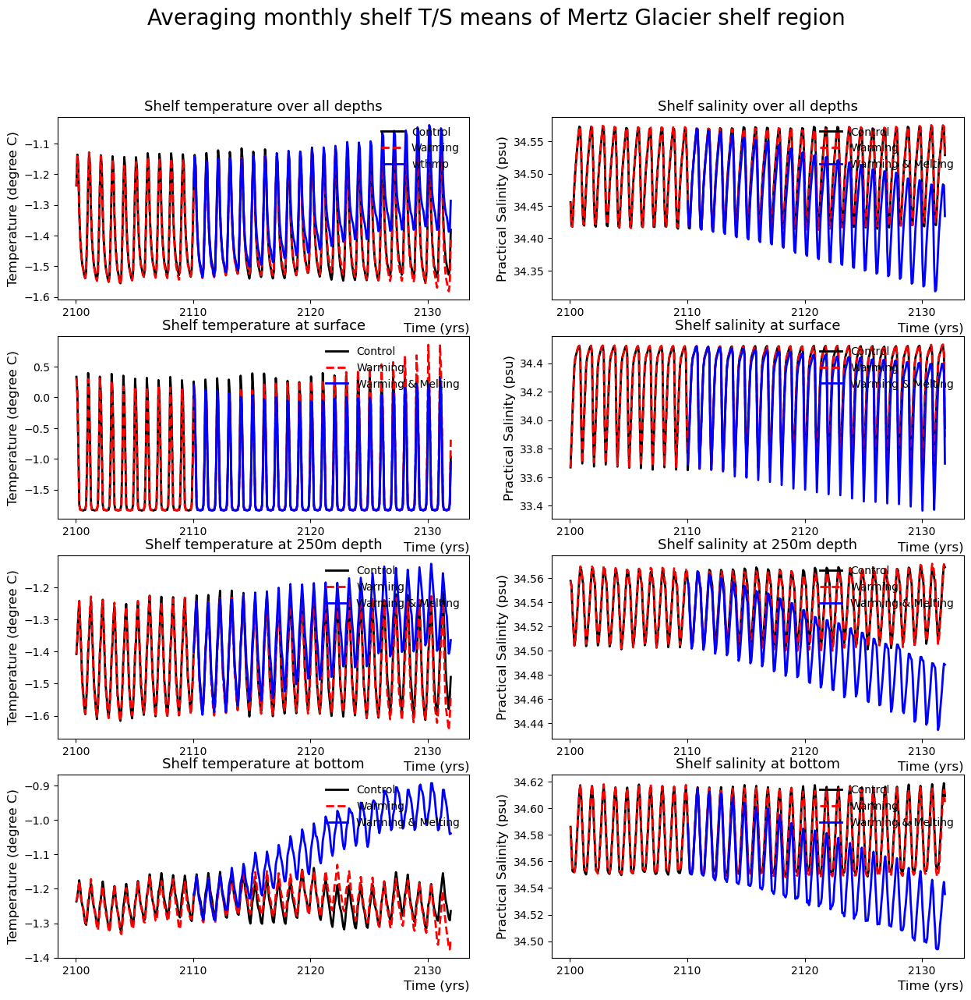

In [18]:
#Plotting time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S means of Mertz Glacier shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Mertz_monthly_mean,temp_st_shelf_wthp_Mertz_monthly_mean,
            temp_st_shelf_wthmp_Mertz_monthly_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Mertz_monthly_mean,salt_st_shelf_wthp_Mertz_monthly_mean,
            salt_st_shelf_wthmp_Mertz_monthly_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Mertz_monthly_mean,temp_surface_shelf_wthp_Mertz_monthly_mean,
            temp_surface_shelf_wthmp_Mertz_monthly_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Mertz_monthly_mean,salt_surface_shelf_wthp_Mertz_monthly_mean,
            salt_surface_shelf_wthmp_Mertz_monthly_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Mertz_monthly_mean,temp_250m_shelf_wthp_Mertz_monthly_mean,
            temp_250m_shelf_wthmp_Mertz_monthly_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Mertz_monthly_mean,salt_250m_shelf_wthp_Mertz_monthly_mean,
            salt_250m_shelf_wthmp_Mertz_monthly_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Mertz_monthly_mean,temp_bottom_shelf_wthp_Mertz_monthly_mean,
            temp_bottom_shelf_wthmp_Mertz_monthly_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Mertz_monthly_mean,salt_bottom_shelf_wthp_Mertz_monthly_mean,
            salt_bottom_shelf_wthmp_Mertz_monthly_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

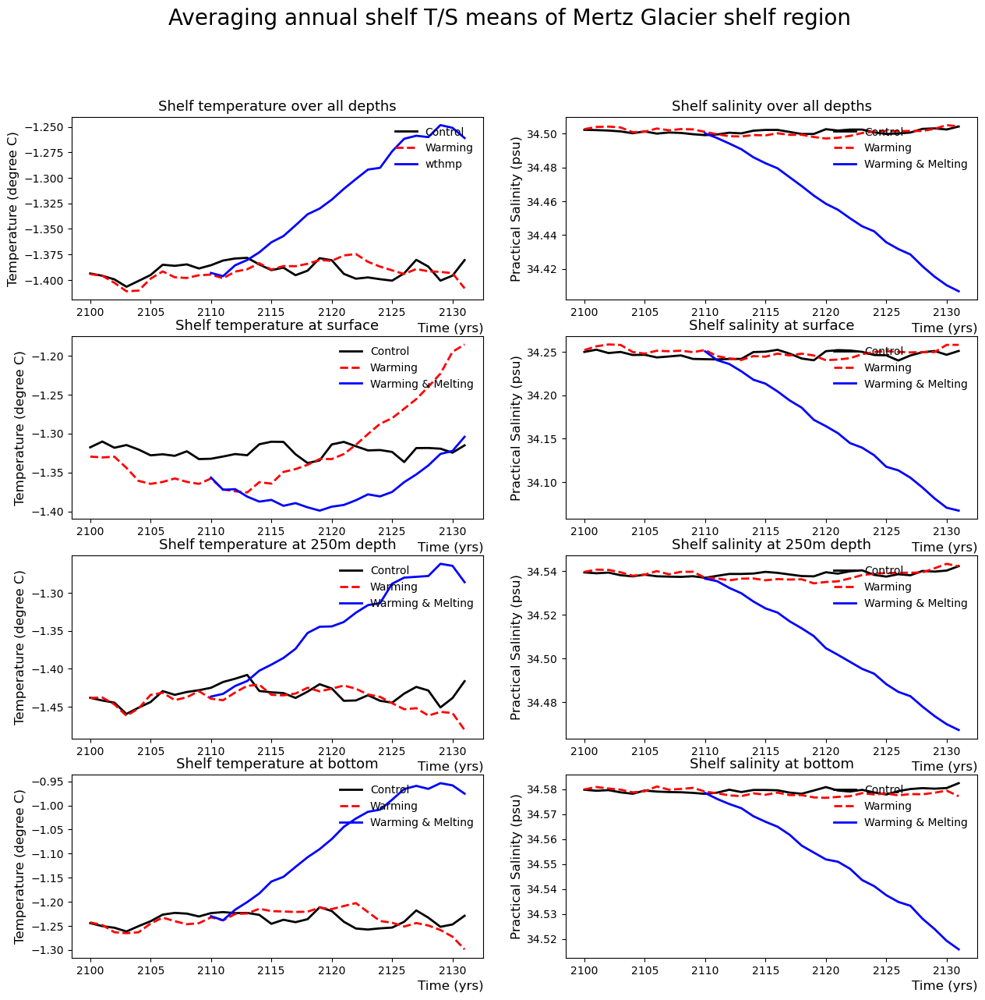

In [19]:
#Plotting annually averaged time series for different regions (30 yrs)
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging annual shelf T/S means of Mertz Glacier shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Mertz_annual_mean,temp_st_shelf_wthp_Mertz_annual_mean,
            temp_st_shelf_wthmp_Mertz_annual_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Mertz_annual_mean,salt_st_shelf_wthp_Mertz_annual_mean,
            salt_st_shelf_wthmp_Mertz_annual_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Mertz_annual_mean,temp_surface_shelf_wthp_Mertz_annual_mean,
            temp_surface_shelf_wthmp_Mertz_annual_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Mertz_annual_mean,salt_surface_shelf_wthp_Mertz_annual_mean,
            salt_surface_shelf_wthmp_Mertz_annual_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Mertz_annual_mean,temp_250m_shelf_wthp_Mertz_annual_mean,
            temp_250m_shelf_wthmp_Mertz_annual_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Mertz_annual_mean,salt_250m_shelf_wthp_Mertz_annual_mean,
            salt_250m_shelf_wthmp_Mertz_annual_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Mertz_annual_mean,temp_bottom_shelf_wthp_Mertz_annual_mean,
            temp_bottom_shelf_wthmp_Mertz_annual_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Mertz_annual_mean,salt_bottom_shelf_wthp_Mertz_annual_mean,
            salt_bottom_shelf_wthmp_Mertz_annual_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

For Mertz region

T:
Wind, thermal and humidity perturbation experiment compared to the control ryf experiment shows little flucations except for surface temperature, which experienced cooling then consistent warming responses.

Wind, thermal, humidity and meltwater perturbation experiment compared to the wind, thermal and humidity perturbation experiment shows stronger warming trend except for surface T, which did not following the warming trend when it begins to warm in wthp experiment but experience cooling then warming trend.

S:
Wind, thermal and humidity perturbation experiment compared to the control ryf experiment shows no shifts.

Wind, thermal, humidity and meltwater perturbation experiment compared to the wind, thermal and humidity perturbation experiment shows consistant strong freshing trend.

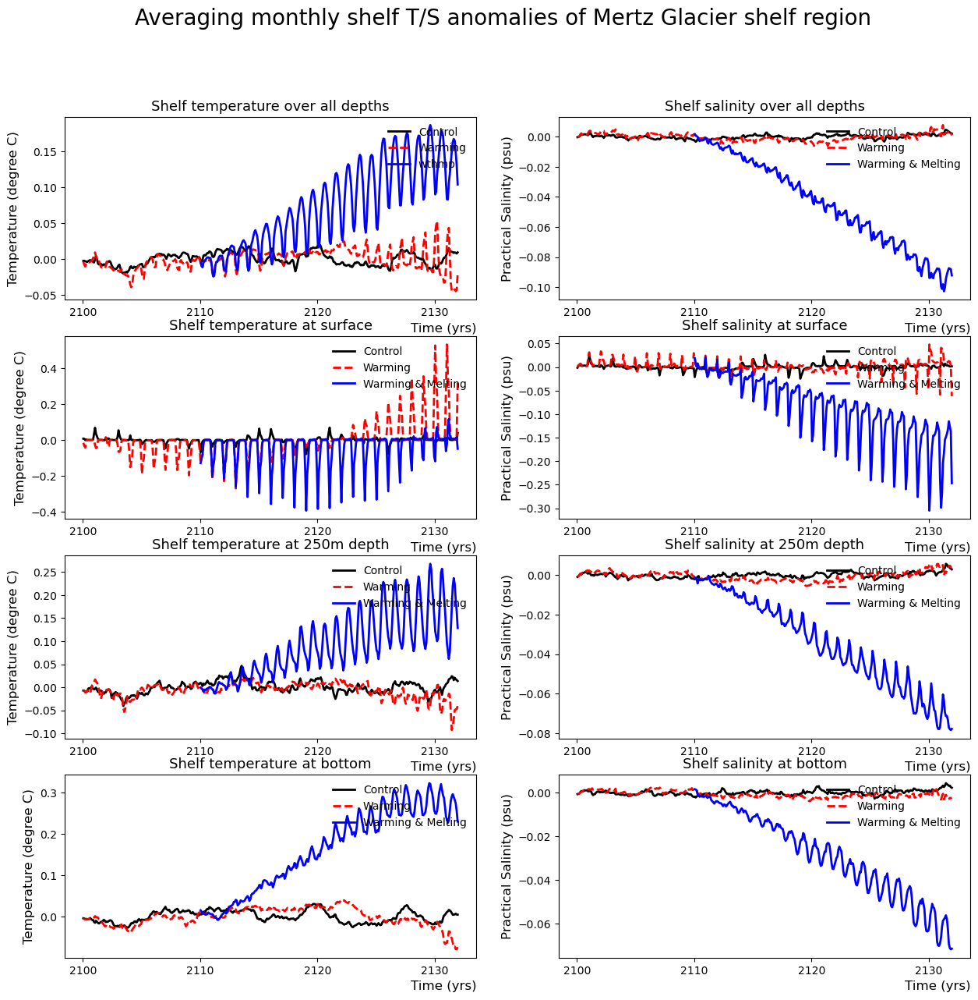

In [25]:
#Plotting anomaly time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S anomalies of Mertz Glacier shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Mertz_monthly_anom,temp_st_shelf_wthp_Mertz_monthly_anom,
            temp_st_shelf_wthmp_Mertz_monthly_anom,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Mertz_monthly_anom,salt_st_shelf_wthp_Mertz_monthly_anom,
            salt_st_shelf_wthmp_Mertz_monthly_anom,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Mertz_monthly_anom,temp_surface_shelf_wthp_Mertz_monthly_anom,
            temp_surface_shelf_wthmp_Mertz_monthly_anom,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Mertz_monthly_anom,salt_surface_shelf_wthp_Mertz_monthly_anom,
            salt_surface_shelf_wthmp_Mertz_monthly_anom,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Mertz_monthly_anom,temp_250m_shelf_wthp_Mertz_monthly_anom,
            temp_250m_shelf_wthmp_Mertz_monthly_anom,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Mertz_monthly_anom,salt_250m_shelf_wthp_Mertz_monthly_anom,
            salt_250m_shelf_wthmp_Mertz_monthly_anom,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Mertz_monthly_anom,temp_bottom_shelf_wthp_Mertz_monthly_anom,
            temp_bottom_shelf_wthmp_Mertz_monthly_anom,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Mertz_monthly_anom,salt_bottom_shelf_wthp_Mertz_monthly_anom,
            salt_bottom_shelf_wthmp_Mertz_monthly_anom,'Shelf salinity at bottom','Practical Salinity (psu)')

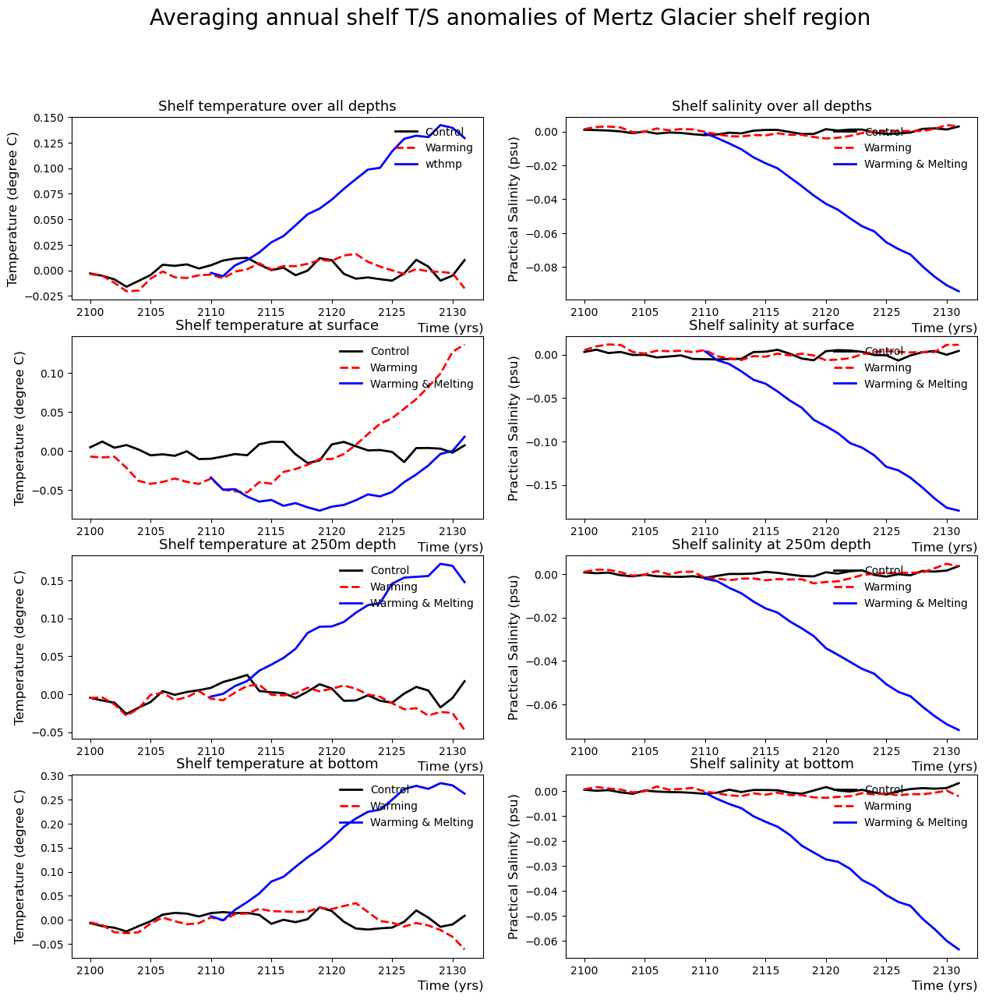

In [28]:
#Plotting annually averaged time series for different regions (30 yrs)
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging annual shelf T/S anomalies of Mertz Glacier shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Mertz_annual_anom,temp_st_shelf_wthp_Mertz_annual_anom,
            temp_st_shelf_wthmp_Mertz_annual_anom,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Mertz_annual_anom,salt_st_shelf_wthp_Mertz_annual_anom,
            salt_st_shelf_wthmp_Mertz_annual_anom,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Mertz_annual_anom,temp_surface_shelf_wthp_Mertz_annual_anom,
            temp_surface_shelf_wthmp_Mertz_annual_anom,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Mertz_annual_anom,salt_surface_shelf_wthp_Mertz_annual_anom,
            salt_surface_shelf_wthmp_Mertz_annual_anom,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Mertz_annual_anom,temp_250m_shelf_wthp_Mertz_annual_anom,
            temp_250m_shelf_wthmp_Mertz_annual_anom,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Mertz_annual_anom,salt_250m_shelf_wthp_Mertz_annual_anom,
            salt_250m_shelf_wthmp_Mertz_annual_anom,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Mertz_annual_anom,temp_bottom_shelf_wthp_Mertz_annual_anom,
            temp_bottom_shelf_wthmp_Mertz_annual_anom,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Mertz_annual_anom,salt_bottom_shelf_wthp_Mertz_annual_anom,
            salt_bottom_shelf_wthmp_Mertz_annual_anom,'Shelf salinity at bottom','Practical Salinity (psu)')

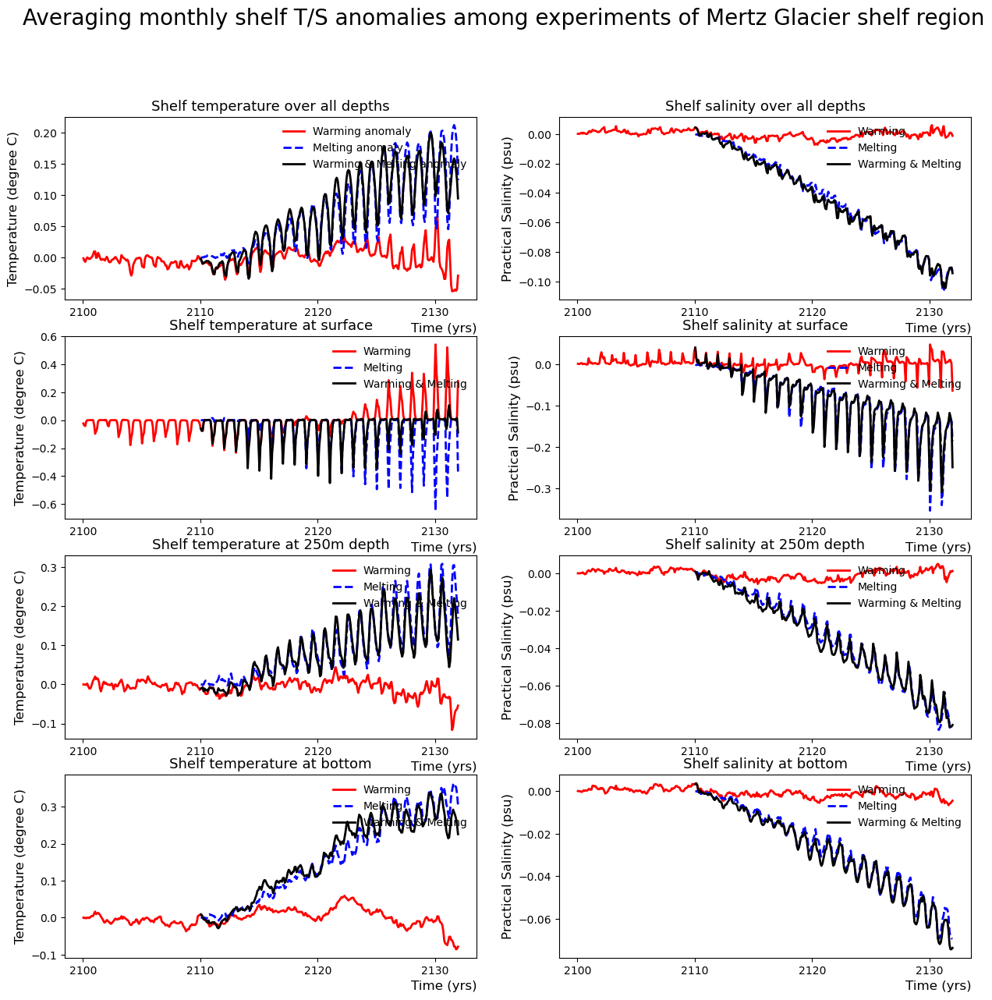

In [30]:
#Plotting among-experiments anomaly time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S anomalies among experiments of Mertz Glacier shelf region', fontsize=20)

subplotting_anomaly(temp_st_shelf_ryf_Mertz_monthly_mean,temp_st_shelf_wthp_Mertz_monthly_mean,
            temp_st_shelf_wthmp_Mertz_monthly_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Mertz_monthly_mean,salt_st_shelf_wthp_Mertz_monthly_mean,
            salt_st_shelf_wthmp_Mertz_monthly_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Mertz_monthly_mean,temp_surface_shelf_wthp_Mertz_monthly_mean,
            temp_surface_shelf_wthmp_Mertz_monthly_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Mertz_monthly_mean,salt_surface_shelf_wthp_Mertz_monthly_mean,
            salt_surface_shelf_wthmp_Mertz_monthly_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Mertz_monthly_mean,temp_250m_shelf_wthp_Mertz_monthly_mean,
            temp_250m_shelf_wthmp_Mertz_monthly_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Mertz_monthly_mean,salt_250m_shelf_wthp_Mertz_monthly_mean,
            salt_250m_shelf_wthmp_Mertz_monthly_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Mertz_monthly_mean,temp_bottom_shelf_wthp_Mertz_monthly_mean,
            temp_bottom_shelf_wthmp_Mertz_monthly_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Mertz_monthly_mean,salt_bottom_shelf_wthp_Mertz_monthly_mean,
            salt_bottom_shelf_wthmp_Mertz_monthly_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

## Ross Sea coastal polynya shelf region

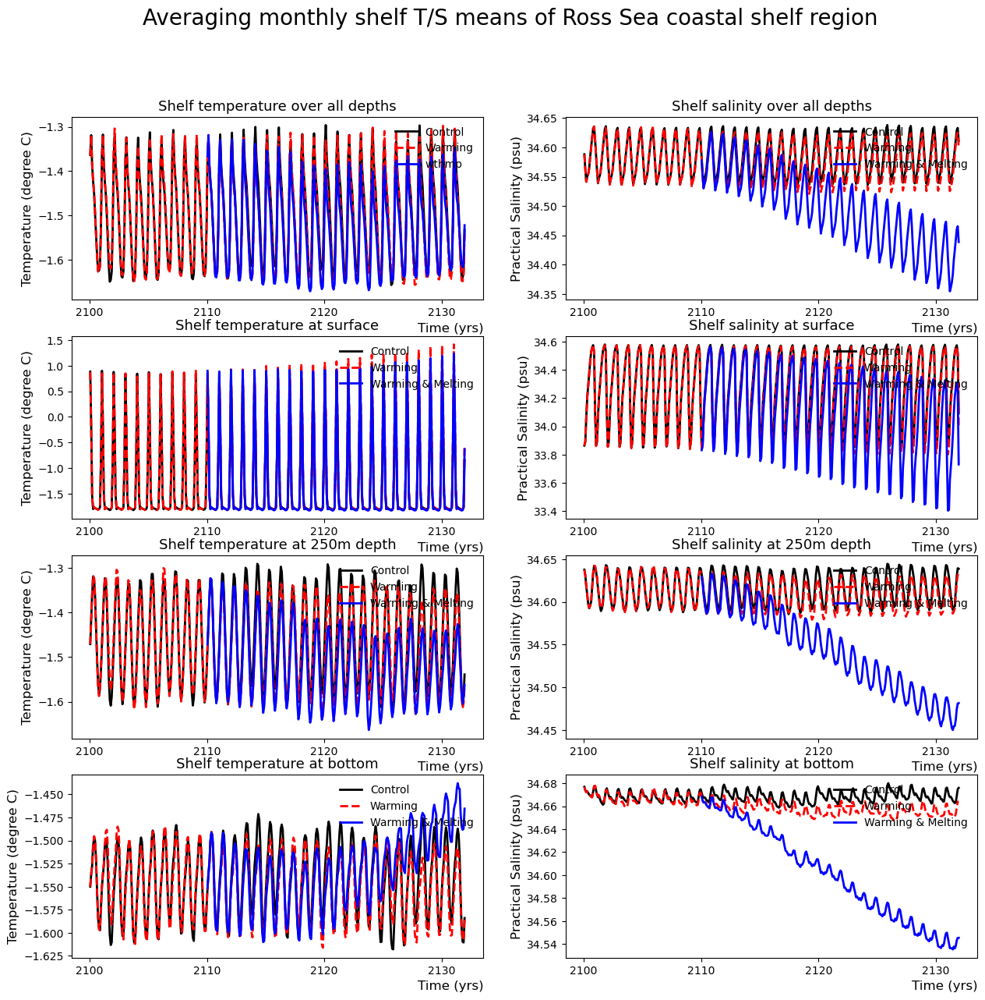

In [31]:
#Plotting time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S means of Ross Sea coastal shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Ross_monthly_mean,temp_st_shelf_wthp_Ross_monthly_mean,
            temp_st_shelf_wthmp_Ross_monthly_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Ross_monthly_mean,salt_st_shelf_wthp_Ross_monthly_mean,
            salt_st_shelf_wthmp_Ross_monthly_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Ross_monthly_mean,temp_surface_shelf_wthp_Ross_monthly_mean,
            temp_surface_shelf_wthmp_Ross_monthly_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Ross_monthly_mean,salt_surface_shelf_wthp_Ross_monthly_mean,
            salt_surface_shelf_wthmp_Ross_monthly_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Ross_monthly_mean,temp_250m_shelf_wthp_Ross_monthly_mean,
            temp_250m_shelf_wthmp_Ross_monthly_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Ross_monthly_mean,salt_250m_shelf_wthp_Ross_monthly_mean,
            salt_250m_shelf_wthmp_Ross_monthly_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Ross_monthly_mean,temp_bottom_shelf_wthp_Ross_monthly_mean,
            temp_bottom_shelf_wthmp_Ross_monthly_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Ross_monthly_mean,salt_bottom_shelf_wthp_Ross_monthly_mean,
            salt_bottom_shelf_wthmp_Ross_monthly_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

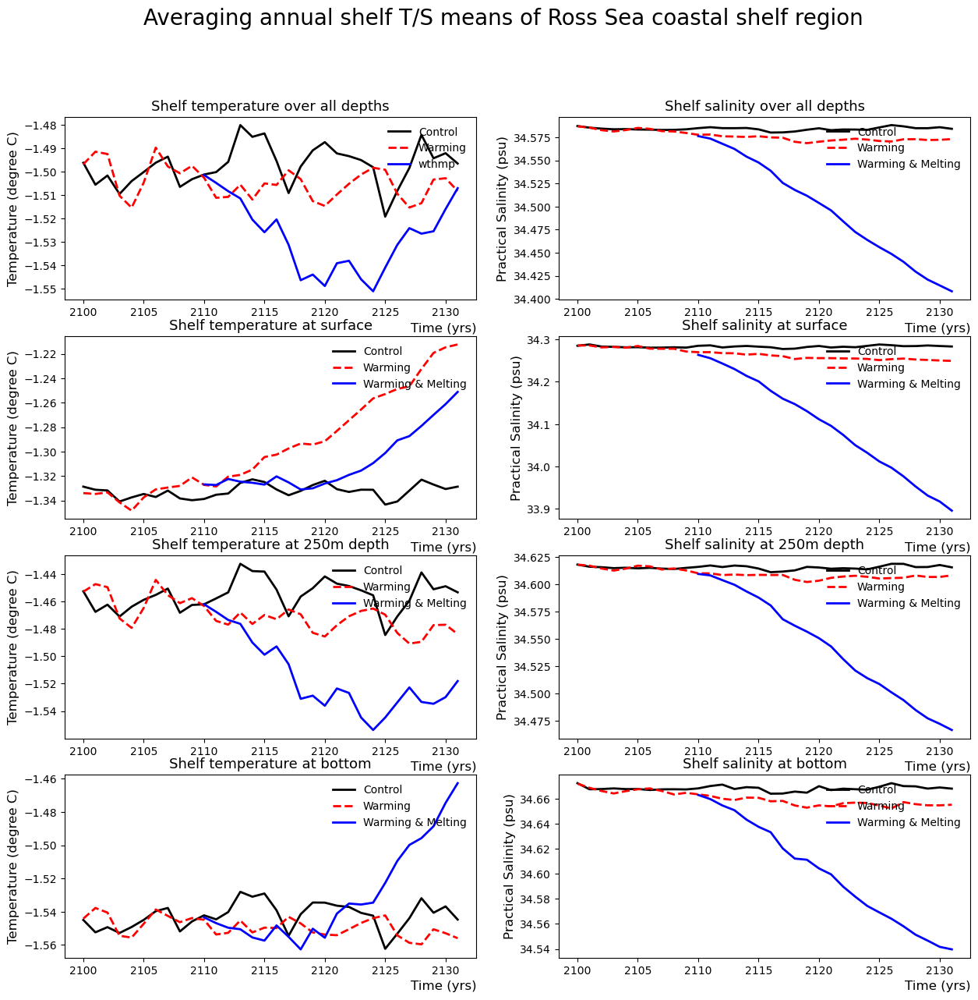

In [32]:
#Plotting annually averaged anomaly time series for different regions (30 yrs)
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging annual shelf T/S means of Ross Sea coastal shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Ross_annual_mean,temp_st_shelf_wthp_Ross_annual_mean,
            temp_st_shelf_wthmp_Ross_annual_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Ross_annual_mean,salt_st_shelf_wthp_Ross_annual_mean,
            salt_st_shelf_wthmp_Ross_annual_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Ross_annual_mean,temp_surface_shelf_wthp_Ross_annual_mean,
            temp_surface_shelf_wthmp_Ross_annual_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Ross_annual_mean,salt_surface_shelf_wthp_Ross_annual_mean,
            salt_surface_shelf_wthmp_Ross_annual_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Ross_annual_mean,temp_250m_shelf_wthp_Ross_annual_mean,
            temp_250m_shelf_wthmp_Ross_annual_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Ross_annual_mean,salt_250m_shelf_wthp_Ross_annual_mean,
            salt_250m_shelf_wthmp_Ross_annual_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Ross_annual_mean,temp_bottom_shelf_wthp_Ross_annual_mean,
            temp_bottom_shelf_wthmp_Ross_annual_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Ross_annual_mean,salt_bottom_shelf_wthp_Ross_annual_mean,
            salt_bottom_shelf_wthmp_Ross_annual_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

For Ross Sea region

T:
Wind, thermal and humidity perturbation experiment compared to the control ryf experiment shows a consistant cooling trend for surface temperature and little cooling changes over all depth, at 250m depth and bottom.

Wind, thermal, humidity and meltwater perturbation experiment compared to the wind, thermal and humidity perturbation experiment shows warmer waters averaging over all depth and surface and at 250m depth. T at bottom does not experience much change at the beginning but shows a consistant warming at the last 10 yrs.

S:
Wind, thermal and humidity perturbation experiment compared to the control ryf experiment shows a slightly consistant freshing trend.

Wind, thermal, humidity and meltwater perturbation experiment compared to the wind, thermal and humidity perturbation experiment shows consistant strong freshing trend.

KeyboardInterrupt: 

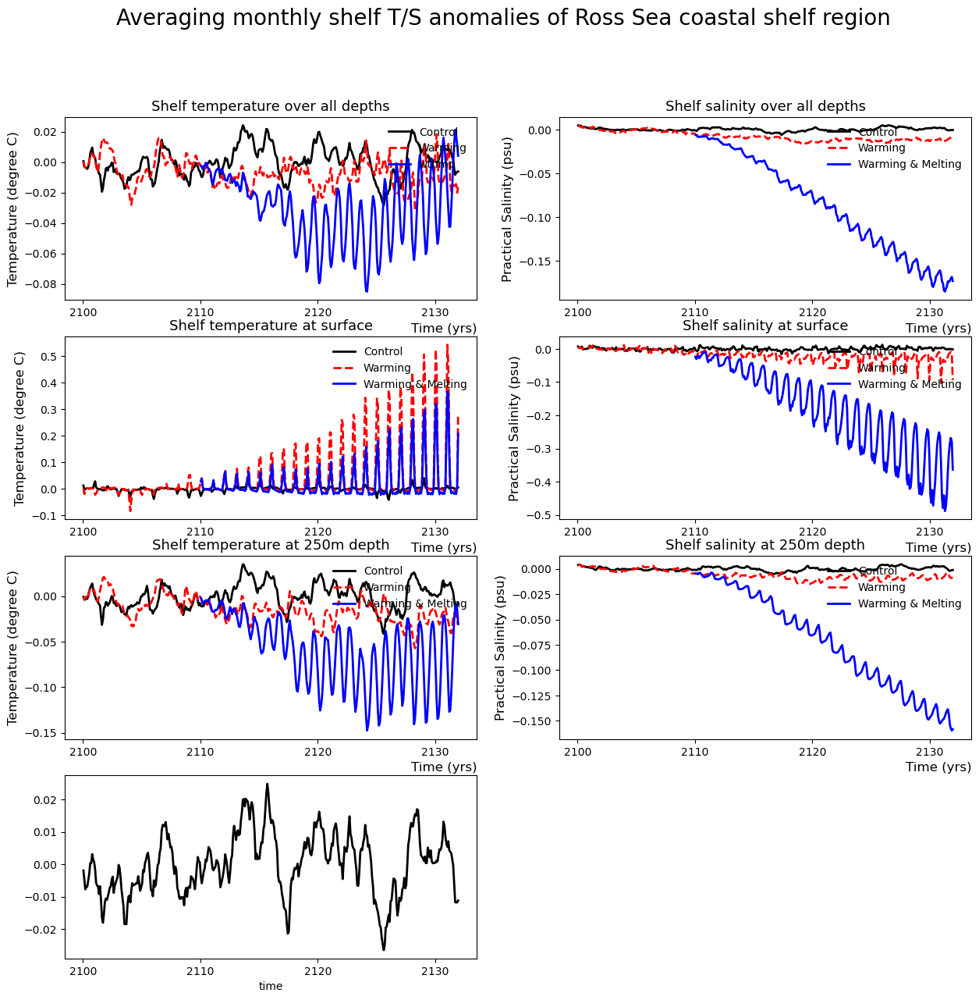

In [69]:
#Plotting anomaly time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S anomalies of Ross Sea coastal shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Ross_monthly_anom,temp_st_shelf_wthp_Ross_monthly_anom,
            temp_st_shelf_wthmp_Ross_monthly_anom,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Ross_monthly_anom,salt_st_shelf_wthp_Ross_monthly_anom,
            salt_st_shelf_wthmp_Ross_monthly_anom,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Ross_monthly_anom,temp_surface_shelf_wthp_Ross_monthly_anom,
            temp_surface_shelf_wthmp_Ross_monthly_anom,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Ross_monthly_anom,salt_surface_shelf_wthp_Ross_monthly_anom,
            salt_surface_shelf_wthmp_Ross_monthly_anom,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Ross_monthly_anom,temp_250m_shelf_wthp_Ross_monthly_anom,
            temp_250m_shelf_wthmp_Ross_monthly_anom,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Ross_monthly_anom,salt_250m_shelf_wthp_Ross_monthly_anom,
            salt_250m_shelf_wthmp_Ross_monthly_anom,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Ross_monthly_anom,temp_bottom_shelf_wthp_Ross_monthly_anom,
            temp_bottom_shelf_wthmp_Ross_monthly_anom,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Ross_monthly_anom,salt_bottom_shelf_wthp_Ross_monthly_anom,
            salt_bottom_shelf_wthmp_Ross_monthly_anom,'Shelf salinity at bottom','Practical Salinity (psu)')

In [ ]:
#Plotting annually averaged time series for different regions (30 yrs)
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging annual shelf T/S anomalies of Ross Sea coastal shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Ross_annual_anom,temp_st_shelf_wthp_Ross_annual_anom,
            temp_st_shelf_wthmp_Ross_annual_anom,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Ross_annual_anom,salt_st_shelf_wthp_Ross_annual_anom,
            salt_st_shelf_wthmp_Ross_annual_anom,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Ross_annual_anom,temp_surface_shelf_wthp_Ross_annual_anom,
            temp_surface_shelf_wthmp_Ross_annual_anom,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Ross_annual_anom,salt_surface_shelf_wthp_Ross_annual_anom,
            salt_surface_shelf_wthmp_Ross_annual_anom,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Ross_annual_anom,temp_250m_shelf_wthp_Ross_annual_anom,
            temp_250m_shelf_wthmp_Ross_annual_anom,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Ross_annual_anom,salt_250m_shelf_wthp_Ross_annual_anom,
            salt_250m_shelf_wthmp_Ross_annual_anom,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Ross_annual_anom,temp_bottom_shelf_wthp_Ross_annual_anom,
            temp_bottom_shelf_wthmp_Ross_annual_anom,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Ross_annual_anom,salt_bottom_shelf_wthp_Ross_annual_anom,
            salt_bottom_shelf_wthmp_Ross_annual_anom,'Shelf salinity at bottom','Practical Salinity (psu)')

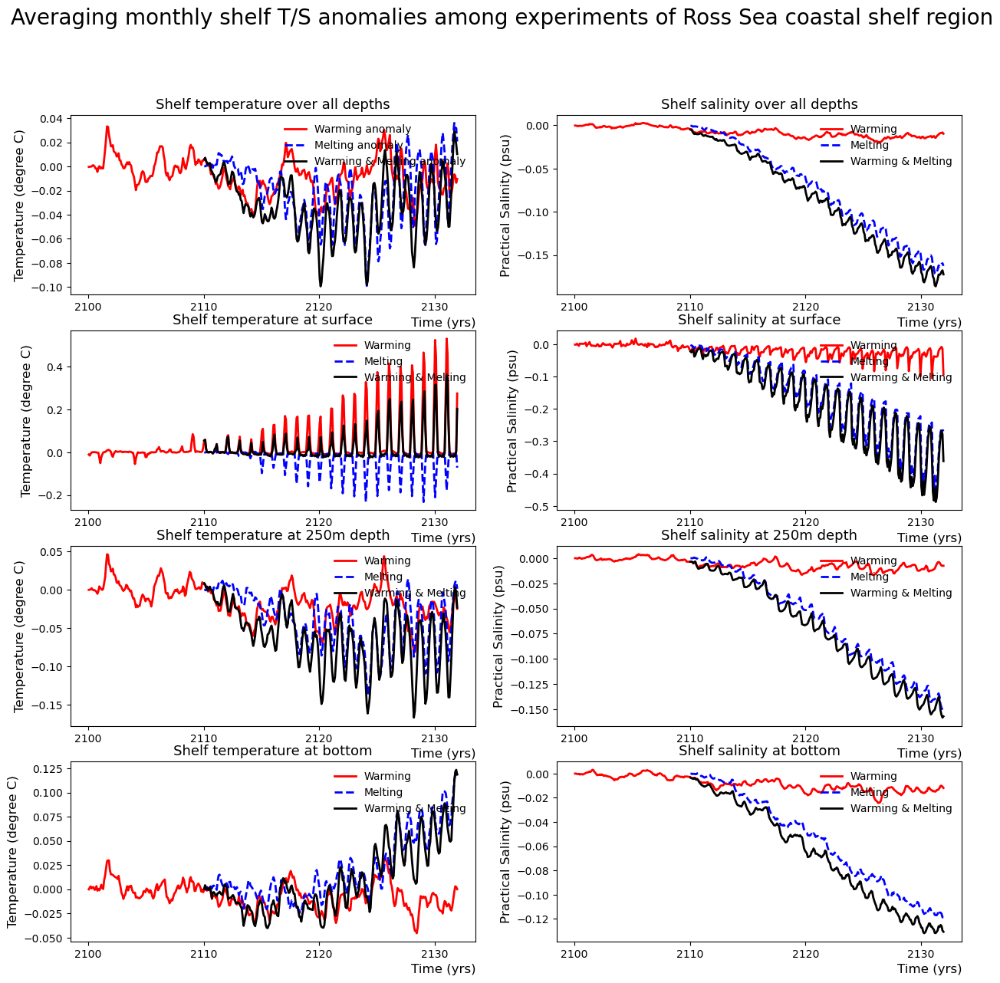

In [103]:
#Plotting among-experiments anomaly time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S anomalies among experiments of Ross Sea coastal shelf region', fontsize=20)

subplotting_anomaly(temp_st_shelf_ryf_Ross_monthly_mean,temp_st_shelf_wthp_Ross_monthly_mean,
            temp_st_shelf_wthmp_Ross_monthly_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Ross_monthly_mean,salt_st_shelf_wthp_Ross_monthly_mean,
            salt_st_shelf_wthmp_Ross_monthly_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Ross_monthly_mean,temp_surface_shelf_wthp_Ross_monthly_mean,
            temp_surface_shelf_wthmp_Ross_monthly_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Ross_monthly_mean,salt_surface_shelf_wthp_Ross_monthly_mean,
            salt_surface_shelf_wthmp_Ross_monthly_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Ross_monthly_mean,temp_250m_shelf_wthp_Ross_monthly_mean,
            temp_250m_shelf_wthmp_Ross_monthly_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Ross_monthly_mean,salt_250m_shelf_wthp_Ross_monthly_mean,
            salt_250m_shelf_wthmp_Ross_monthly_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Ross_monthly_mean,temp_bottom_shelf_wthp_Ross_monthly_mean,
            temp_bottom_shelf_wthmp_Ross_monthly_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Ross_monthly_mean,salt_bottom_shelf_wthp_Ross_monthly_mean,
            salt_bottom_shelf_wthmp_Ross_monthly_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

## Amundsen-Bellingshausen Seas shelf region

In [ ]:
#Plotting time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S means of Amundsen-Bellingshausen Seas shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_AB_monthly_mean,temp_st_shelf_wthp_AB_monthly_mean,
            temp_st_shelf_wthmp_AB_monthly_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_AB_monthly_mean,salt_st_shelf_wthp_AB_monthly_mean,
            salt_st_shelf_wthmp_AB_monthly_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_AB_monthly_mean,temp_surface_shelf_wthp_AB_monthly_mean,
            temp_surface_shelf_wthmp_AB_monthly_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_AB_monthly_mean,salt_surface_shelf_wthp_AB_monthly_mean,
            salt_surface_shelf_wthmp_AB_monthly_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_AB_monthly_mean,temp_250m_shelf_wthp_AB_monthly_mean,
            temp_250m_shelf_wthmp_AB_monthly_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_AB_monthly_mean,salt_250m_shelf_wthp_AB_monthly_mean,
            salt_250m_shelf_wthmp_AB_monthly_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_AB_monthly_mean,temp_bottom_shelf_wthp_AB_monthly_mean,
            temp_bottom_shelf_wthmp_AB_monthly_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_AB_monthly_mean,salt_bottom_shelf_wthp_AB_monthly_mean,
            salt_bottom_shelf_wthmp_AB_monthly_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

In [ ]:
#Plotting annually averaged anomaly time series for different regions (30 yrs)
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging annual shelf T/S means of Amundsen-Bellingshausen Seas shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_AB_annual_mean,temp_st_shelf_wthp_AB_annual_mean,
            temp_st_shelf_wthmp_AB_annual_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_AB_annual_mean,salt_st_shelf_wthp_AB_annual_mean,
            salt_st_shelf_wthmp_AB_annual_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_AB_annual_mean,temp_surface_shelf_wthp_AB_annual_mean,
            temp_surface_shelf_wthmp_AB_annual_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_AB_annual_mean,salt_surface_shelf_wthp_AB_annual_mean,
            salt_surface_shelf_wthmp_AB_annual_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_AB_annual_mean,temp_250m_shelf_wthp_AB_annual_mean,
            temp_250m_shelf_wthmp_AB_annual_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_AB_annual_mean,salt_250m_shelf_wthp_AB_annual_mean,
            salt_250m_shelf_wthmp_AB_annual_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_AB_annual_mean,temp_bottom_shelf_wthp_AB_annual_mean,
            temp_bottom_shelf_wthmp_AB_annual_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_AB_annual_mean,salt_bottom_shelf_wthp_AB_annual_mean,
            salt_bottom_shelf_wthmp_AB_annual_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

In [ ]:
#Plotting anomaly time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S anomalies of Amundsen-Bellingshausen Seas shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_AB_monthly_anom,temp_st_shelf_wthp_AB_monthly_anom,
            temp_st_shelf_wthmp_AB_monthly_anom,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_AB_monthly_anom,salt_st_shelf_wthp_AB_monthly_anom,
            salt_st_shelf_wthmp_AB_monthly_anom,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_AB_monthly_anom,temp_surface_shelf_wthp_AB_monthly_anom,
            temp_surface_shelf_wthmp_AB_monthly_anom,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_AB_monthly_anom,salt_surface_shelf_wthp_AB_monthly_anom,
            salt_surface_shelf_wthmp_AB_monthly_anom,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_AB_monthly_anom,temp_250m_shelf_wthp_AB_monthly_anom,
            temp_250m_shelf_wthmp_AB_monthly_anom,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_AB_monthly_anom,salt_250m_shelf_wthp_AB_monthly_anom,
            salt_250m_shelf_wthmp_AB_monthly_anom,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_AB_monthly_anom,temp_bottom_shelf_wthp_AB_monthly_anom,
            temp_bottom_shelf_wthmp_AB_monthly_anom,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_AB_monthly_anom,salt_bottom_shelf_wthp_AB_monthly_anom,
            salt_bottom_shelf_wthmp_AB_monthly_anom,'Shelf salinity at bottom','Practical Salinity (psu)')

In [ ]:
#Plotting annually averaged time series for different regions (30 yrs)
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging annual shelf T/S anomalies of Amundsen-Bellingshausen Seas shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_AB_annual_anom,temp_st_shelf_wthp_AB_annual_anom,
            temp_st_shelf_wthmp_AB_annual_anom,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_AB_annual_anom,salt_st_shelf_wthp_AB_annual_anom,
            salt_st_shelf_wthmp_AB_annual_anom,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_AB_annual_anom,temp_surface_shelf_wthp_AB_annual_anom,
            temp_surface_shelf_wthmp_AB_annual_anom,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_AB_annual_anom,salt_surface_shelf_wthp_AB_annual_anom,
            salt_surface_shelf_wthmp_AB_annual_anom,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_AB_annual_anom,temp_250m_shelf_wthp_AB_annual_anom,
            temp_250m_shelf_wthmp_AB_annual_anom,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_AB_annual_anom,salt_250m_shelf_wthp_AB_annual_anom,
            salt_250m_shelf_wthmp_AB_annual_anom,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_AB_annual_anom,temp_bottom_shelf_wthp_AB_annual_anom,
            temp_bottom_shelf_wthmp_AB_annual_anom,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_AB_annual_anom,salt_bottom_shelf_wthp_AB_annual_anom,
            salt_bottom_shelf_wthmp_AB_annual_anom,'Shelf salinity at bottom','Practical Salinity (psu)')

In [ ]:
#Plotting among-experiments anomaly time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S anomalies among experiments of Amundsen-Bellingshausen Seas shelf region', fontsize=20)

subplotting_anomaly(temp_st_shelf_ryf_AB_monthly_mean,temp_st_shelf_wthp_AB_monthly_mean,
            temp_st_shelf_wthmp_AB_monthly_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_AB_monthly_mean,salt_st_shelf_wthp_AB_monthly_mean,
            salt_st_shelf_wthmp_AB_monthly_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_AB_monthly_mean,temp_surface_shelf_wthp_AB_monthly_mean,
            temp_surface_shelf_wthmp_AB_monthly_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_AB_monthly_mean,salt_surface_shelf_wthp_AB_monthly_mean,
            salt_surface_shelf_wthmp_AB_monthly_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_AB_monthly_mean,temp_250m_shelf_wthp_AB_monthly_mean,
            temp_250m_shelf_wthmp_AB_monthly_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_AB_monthly_mean,salt_250m_shelf_wthp_AB_monthly_mean,
            salt_250m_shelf_wthmp_AB_monthly_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_AB_monthly_mean,temp_bottom_shelf_wthp_AB_monthly_mean,
            temp_bottom_shelf_wthmp_AB_monthly_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_AB_monthly_mean,salt_bottom_shelf_wthp_AB_monthly_mean,
            salt_bottom_shelf_wthmp_AB_monthly_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

## West Antarctic Peninsula shelf region

In [ ]:
#Plotting time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S means of West Antarctic Peninsula shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_WAP_monthly_mean,temp_st_shelf_wthp_WAP_monthly_mean,
            temp_st_shelf_wthmp_WAP_monthly_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_WAP_monthly_mean,salt_st_shelf_wthp_WAP_monthly_mean,
            salt_st_shelf_wthmp_WAP_monthly_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_WAP_monthly_mean,temp_surface_shelf_wthp_WAP_monthly_mean,
            temp_surface_shelf_wthmp_WAP_monthly_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_WAP_monthly_mean,salt_surface_shelf_wthp_WAP_monthly_mean,
            salt_surface_shelf_wthmp_WAP_monthly_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_WAP_monthly_mean,temp_250m_shelf_wthp_WAP_monthly_mean,
            temp_250m_shelf_wthmp_WAP_monthly_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_WAP_monthly_mean,salt_250m_shelf_wthp_WAP_monthly_mean,
            salt_250m_shelf_wthmp_WAP_monthly_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_WAP_monthly_mean,temp_bottom_shelf_wthp_WAP_monthly_mean,
            temp_bottom_shelf_wthmp_WAP_monthly_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_WAP_monthly_mean,salt_bottom_shelf_wthp_WAP_monthly_mean,
            salt_bottom_shelf_wthmp_WAP_monthly_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

In [ ]:
#Plotting annually averaged anomaly time series for different regions (30 yrs)
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging annual shelf T/S means of West Antarctic Peninsula shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_WAP_annual_mean,temp_st_shelf_wthp_WAP_annual_mean,
            temp_st_shelf_wthmp_WAP_annual_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_WAP_annual_mean,salt_st_shelf_wthp_WAP_annual_mean,
            salt_st_shelf_wthmp_WAP_annual_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_WAP_annual_mean,temp_surface_shelf_wthp_WAP_annual_mean,
            temp_surface_shelf_wthmp_WAP_annual_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_WAP_annual_mean,salt_surface_shelf_wthp_WAP_annual_mean,
            salt_surface_shelf_wthmp_WAP_annual_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_WAP_annual_mean,temp_250m_shelf_wthp_WAP_annual_mean,
            temp_250m_shelf_wthmp_WAP_annual_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_WAP_annual_mean,salt_250m_shelf_wthp_WAP_annual_mean,
            salt_250m_shelf_wthmp_WAP_annual_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_WAP_annual_mean,temp_bottom_shelf_wthp_WAP_annual_mean,
            temp_bottom_shelf_wthmp_WAP_annual_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_WAP_annual_mean,salt_bottom_shelf_wthp_WAP_annual_mean,
            salt_bottom_shelf_wthmp_WAP_annual_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

In [ ]:
#Plotting anomaly time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S anomalies of West Antarctic Peninsula shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_WAP_monthly_anom,temp_st_shelf_wthp_WAP_monthly_anom,
            temp_st_shelf_wthmp_WAP_monthly_anom,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_WAP_monthly_anom,salt_st_shelf_wthp_WAP_monthly_anom,
            salt_st_shelf_wthmp_WAP_monthly_anom,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_WAP_monthly_anom,temp_surface_shelf_wthp_WAP_monthly_anom,
            temp_surface_shelf_wthmp_WAP_monthly_anom,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_WAP_monthly_anom,salt_surface_shelf_wthp_WAP_monthly_anom,
            salt_surface_shelf_wthmp_WAP_monthly_anom,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_WAP_monthly_anom,temp_250m_shelf_wthp_WAP_monthly_anom,
            temp_250m_shelf_wthmp_WAP_monthly_anom,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_WAP_monthly_anom,salt_250m_shelf_wthp_WAP_monthly_anom,
            salt_250m_shelf_wthmp_WAP_monthly_anom,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_WAP_monthly_anom,temp_bottom_shelf_wthp_WAP_monthly_anom,
            temp_bottom_shelf_wthmp_WAP_monthly_anom,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_WAP_monthly_anom,salt_bottom_shelf_wthp_WAP_monthly_anom,
            salt_bottom_shelf_wthmp_WAP_monthly_anom,'Shelf salinity at bottom','Practical Salinity (psu)')

In [ ]:
#Plotting annually averaged time series for different regions (30 yrs)
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging annual shelf T/S anomalies of West Antarctic Peninsula shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_WAP_annual_anom,temp_st_shelf_wthp_WAP_annual_anom,
            temp_st_shelf_wthmp_WAP_annual_anom,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_WAP_annual_anom,salt_st_shelf_wthp_WAP_annual_anom,
            salt_st_shelf_wthmp_WAP_annual_anom,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_WAP_annual_anom,temp_surface_shelf_wthp_WAP_annual_anom,
            temp_surface_shelf_wthmp_WAP_annual_anom,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_WAP_annual_anom,salt_surface_shelf_wthp_WAP_annual_anom,
            salt_surface_shelf_wthmp_WAP_annual_anom,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_WAP_annual_anom,temp_250m_shelf_wthp_WAP_annual_anom,
            temp_250m_shelf_wthmp_WAP_annual_anom,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_WAP_annual_anom,salt_250m_shelf_wthp_WAP_annual_anom,
            salt_250m_shelf_wthmp_WAP_annual_anom,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_WAP_annual_anom,temp_bottom_shelf_wthp_WAP_annual_anom,
            temp_bottom_shelf_wthmp_WAP_annual_anom,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_WAP_annual_anom,salt_bottom_shelf_wthp_WAP_annual_anom,
            salt_bottom_shelf_wthmp_WAP_annual_anom,'Shelf salinity at bottom','Practical Salinity (psu)')

In [ ]:
#Plotting among-experiments anomaly time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S anomalies among experiments of West Antarctic Peninsula shelf region', fontsize=20)

subplotting_anomaly(temp_st_shelf_ryf_WAP_monthly_mean,temp_st_shelf_wthp_WAP_monthly_mean,
            temp_st_shelf_wthmp_WAP_monthly_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_WAP_monthly_mean,salt_st_shelf_wthp_WAP_monthly_mean,
            salt_st_shelf_wthmp_WAP_monthly_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_WAP_monthly_mean,temp_surface_shelf_wthp_WAP_monthly_mean,
            temp_surface_shelf_wthmp_WAP_monthly_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_WAP_monthly_mean,salt_surface_shelf_wthp_WAP_monthly_mean,
            salt_surface_shelf_wthmp_WAP_monthly_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_WAP_monthly_mean,temp_250m_shelf_wthp_WAP_monthly_mean,
            temp_250m_shelf_wthmp_WAP_monthly_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_WAP_monthly_mean,salt_250m_shelf_wthp_WAP_monthly_mean,
            salt_250m_shelf_wthmp_WAP_monthly_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_WAP_monthly_mean,temp_bottom_shelf_wthp_WAP_monthly_mean,
            temp_bottom_shelf_wthmp_WAP_monthly_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_WAP_monthly_mean,salt_bottom_shelf_wthp_WAP_monthly_mean,
            salt_bottom_shelf_wthmp_WAP_monthly_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

## Larsen shelf region

In [ ]:
#Plotting time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S means of Larsen shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Larsen_monthly_mean,temp_st_shelf_wthp_Larsen_monthly_mean,
            temp_st_shelf_wthmp_Larsen_monthly_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Larsen_monthly_mean,salt_st_shelf_wthp_Larsen_monthly_mean,
            salt_st_shelf_wthmp_Larsen_monthly_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Larsen_monthly_mean,temp_surface_shelf_wthp_Larsen_monthly_mean,
            temp_surface_shelf_wthmp_Larsen_monthly_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Larsen_monthly_mean,salt_surface_shelf_wthp_Larsen_monthly_mean,
            salt_surface_shelf_wthmp_Larsen_monthly_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Larsen_monthly_mean,temp_250m_shelf_wthp_Larsen_monthly_mean,
            temp_250m_shelf_wthmp_Larsen_monthly_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Larsen_monthly_mean,salt_250m_shelf_wthp_Larsen_monthly_mean,
            salt_250m_shelf_wthmp_Larsen_monthly_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Larsen_monthly_mean,temp_bottom_shelf_wthp_Larsen_monthly_mean,
            temp_bottom_shelf_wthmp_Larsen_monthly_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Larsen_monthly_mean,salt_bottom_shelf_wthp_Larsen_monthly_mean,
            salt_bottom_shelf_wthmp_Larsen_monthly_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

In [ ]:
#Plotting annually averaged anomaly time series for different regions (30 yrs)
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging annual shelf T/S means of Larsen shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Larsen_annual_mean,temp_st_shelf_wthp_Larsen_annual_mean,
            temp_st_shelf_wthmp_Larsen_annual_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Larsen_annual_mean,salt_st_shelf_wthp_Larsen_annual_mean,
            salt_st_shelf_wthmp_Larsen_annual_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Larsen_annual_mean,temp_surface_shelf_wthp_Larsen_annual_mean,
            temp_surface_shelf_wthmp_Larsen_annual_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Larsen_annual_mean,salt_surface_shelf_wthp_Larsen_annual_mean,
            salt_surface_shelf_wthmp_Larsen_annual_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Larsen_annual_mean,temp_250m_shelf_wthp_Larsen_annual_mean,
            temp_250m_shelf_wthmp_Larsen_annual_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Larsen_annual_mean,salt_250m_shelf_wthp_Larsen_annual_mean,
            salt_250m_shelf_wthmp_Larsen_annual_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Larsen_annual_mean,temp_bottom_shelf_wthp_Larsen_annual_mean,
            temp_bottom_shelf_wthmp_Larsen_annual_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Larsen_annual_mean,salt_bottom_shelf_wthp_Larsen_annual_mean,
            salt_bottom_shelf_wthmp_Larsen_annual_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

In [ ]:
#Plotting anomaly time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S anomalies of Larsen shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Larsen_monthly_anom,temp_st_shelf_wthp_Larsen_monthly_anom,
            temp_st_shelf_wthmp_Larsen_monthly_anom,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Larsen_monthly_anom,salt_st_shelf_wthp_Larsen_monthly_anom,
            salt_st_shelf_wthmp_Larsen_monthly_anom,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Larsen_monthly_anom,temp_surface_shelf_wthp_Larsen_monthly_anom,
            temp_surface_shelf_wthmp_Larsen_monthly_anom,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Larsen_monthly_anom,salt_surface_shelf_wthp_Larsen_monthly_anom,
            salt_surface_shelf_wthmp_Larsen_monthly_anom,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Larsen_monthly_anom,temp_250m_shelf_wthp_Larsen_monthly_anom,
            temp_250m_shelf_wthmp_Larsen_monthly_anom,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Larsen_monthly_anom,salt_250m_shelf_wthp_Larsen_monthly_anom,
            salt_250m_shelf_wthmp_Larsen_monthly_anom,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Larsen_monthly_anom,temp_bottom_shelf_wthp_Larsen_monthly_anom,
            temp_bottom_shelf_wthmp_Larsen_monthly_anom,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Larsen_monthly_anom,salt_bottom_shelf_wthp_Larsen_monthly_anom,
            salt_bottom_shelf_wthmp_Larsen_monthly_anom,'Shelf salinity at bottom','Practical Salinity (psu)')

In [ ]:
#Plotting annually averaged time series for different regions (30 yrs)
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging annual shelf T/S anomalies of Larsen shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Larsen_annual_anom,temp_st_shelf_wthp_Larsen_annual_anom,
            temp_st_shelf_wthmp_Larsen_annual_anom,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Larsen_annual_anom,salt_st_shelf_wthp_Larsen_annual_anom,
            salt_st_shelf_wthmp_Larsen_annual_anom,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Larsen_annual_anom,temp_surface_shelf_wthp_Larsen_annual_anom,
            temp_surface_shelf_wthmp_Larsen_annual_anom,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Larsen_annual_anom,salt_surface_shelf_wthp_Larsen_annual_anom,
            salt_surface_shelf_wthmp_Larsen_annual_anom,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Larsen_annual_anom,temp_250m_shelf_wthp_Larsen_annual_anom,
            temp_250m_shelf_wthmp_Larsen_annual_anom,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Larsen_annual_anom,salt_250m_shelf_wthp_Larsen_annual_anom,
            salt_250m_shelf_wthmp_Larsen_annual_anom,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Larsen_annual_anom,temp_bottom_shelf_wthp_Larsen_annual_anom,
            temp_bottom_shelf_wthmp_Larsen_annual_anom,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Larsen_annual_anom,salt_bottom_shelf_wthp_Larsen_annual_anom,
            salt_bottom_shelf_wthmp_Larsen_annual_anom,'Shelf salinity at bottom','Practical Salinity (psu)')

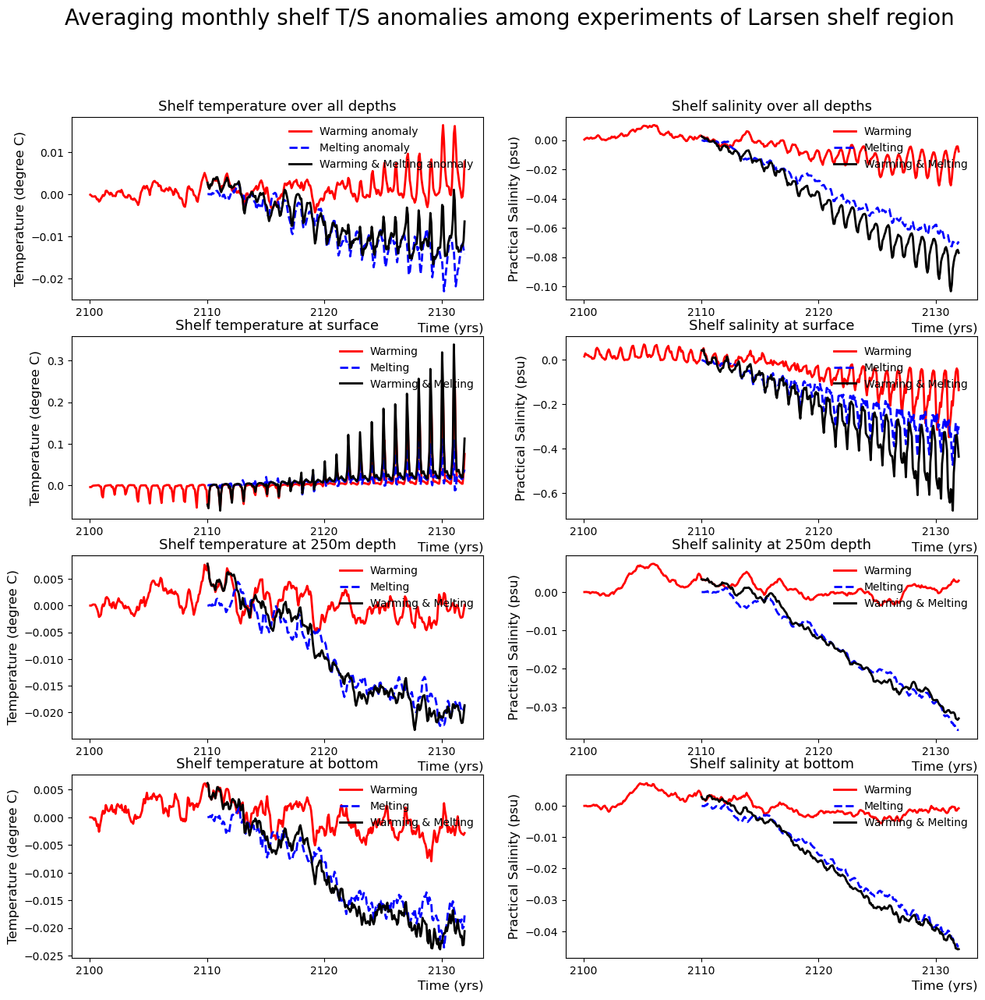

In [102]:
#Plotting among-experiments anomaly time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S anomalies among experiments of Larsen shelf region', fontsize=20)

subplotting_anomaly(temp_st_shelf_ryf_Larsen_monthly_mean,temp_st_shelf_wthp_Larsen_monthly_mean,
            temp_st_shelf_wthmp_Larsen_monthly_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Larsen_monthly_mean,salt_st_shelf_wthp_Larsen_monthly_mean,
            salt_st_shelf_wthmp_Larsen_monthly_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Larsen_monthly_mean,temp_surface_shelf_wthp_Larsen_monthly_mean,
            temp_surface_shelf_wthmp_Larsen_monthly_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Larsen_monthly_mean,salt_surface_shelf_wthp_Larsen_monthly_mean,
            salt_surface_shelf_wthmp_Larsen_monthly_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Larsen_monthly_mean,temp_250m_shelf_wthp_Larsen_monthly_mean,
            temp_250m_shelf_wthmp_Larsen_monthly_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Larsen_monthly_mean,salt_250m_shelf_wthp_Larsen_monthly_mean,
            salt_250m_shelf_wthmp_Larsen_monthly_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Larsen_monthly_mean,temp_bottom_shelf_wthp_Larsen_monthly_mean,
            temp_bottom_shelf_wthmp_Larsen_monthly_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Larsen_monthly_mean,salt_bottom_shelf_wthp_Larsen_monthly_mean,
            salt_bottom_shelf_wthmp_Larsen_monthly_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

## Weddell Sea coastal shelf region

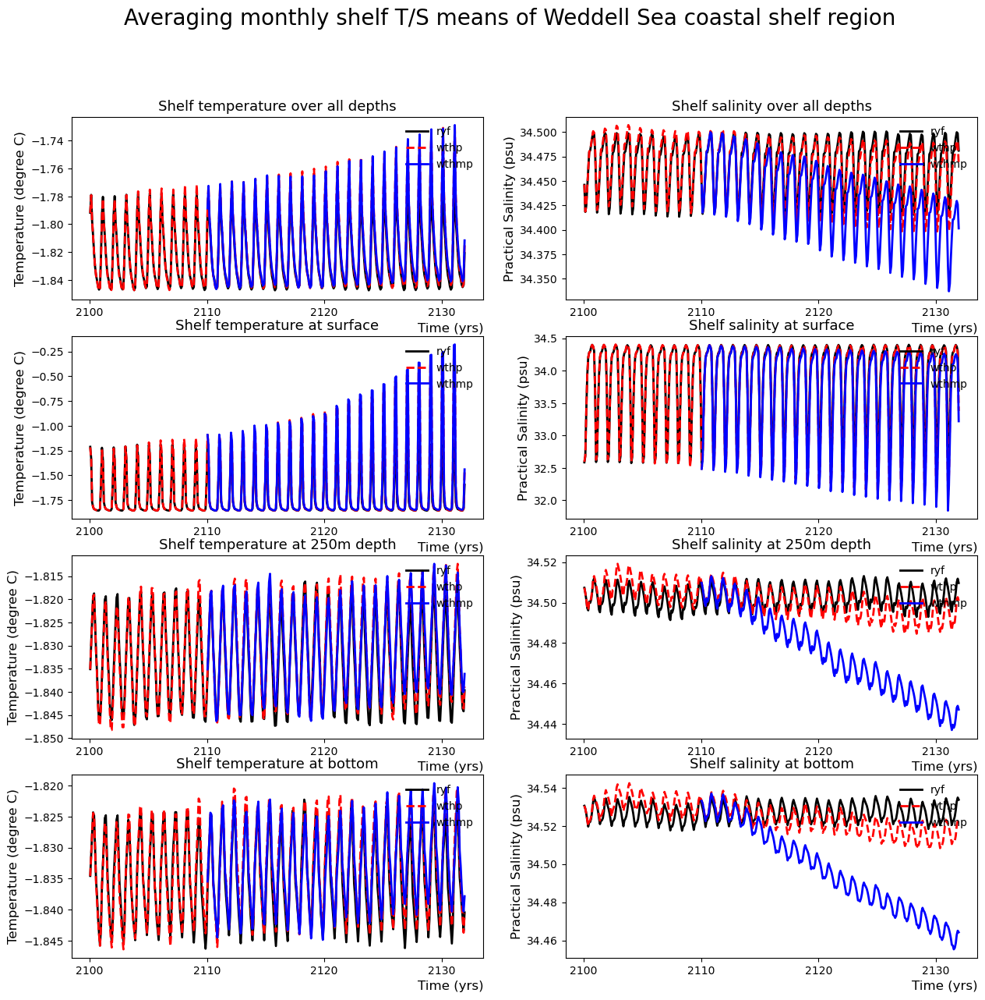

In [36]:
#Plotting time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S means of Weddell Sea coastal shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Weddell_monthly_mean,temp_st_shelf_wthp_Weddell_monthly_mean,
            temp_st_shelf_wthmp_Weddell_monthly_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Weddell_monthly_mean,salt_st_shelf_wthp_Weddell_monthly_mean,
            salt_st_shelf_wthmp_Weddell_monthly_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Weddell_monthly_mean,temp_surface_shelf_wthp_Weddell_monthly_mean,
            temp_surface_shelf_wthmp_Weddell_monthly_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Weddell_monthly_mean,salt_surface_shelf_wthp_Weddell_monthly_mean,
            salt_surface_shelf_wthmp_Weddell_monthly_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Weddell_monthly_mean,temp_250m_shelf_wthp_Weddell_monthly_mean,
            temp_250m_shelf_wthmp_Weddell_monthly_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Weddell_monthly_mean,salt_250m_shelf_wthp_Weddell_monthly_mean,
            salt_250m_shelf_wthmp_Weddell_monthly_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Weddell_monthly_mean,temp_bottom_shelf_wthp_Weddell_monthly_mean,
            temp_bottom_shelf_wthmp_Weddell_monthly_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Weddell_monthly_mean,salt_bottom_shelf_wthp_Weddell_monthly_mean,
            salt_bottom_shelf_wthmp_Weddell_monthly_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

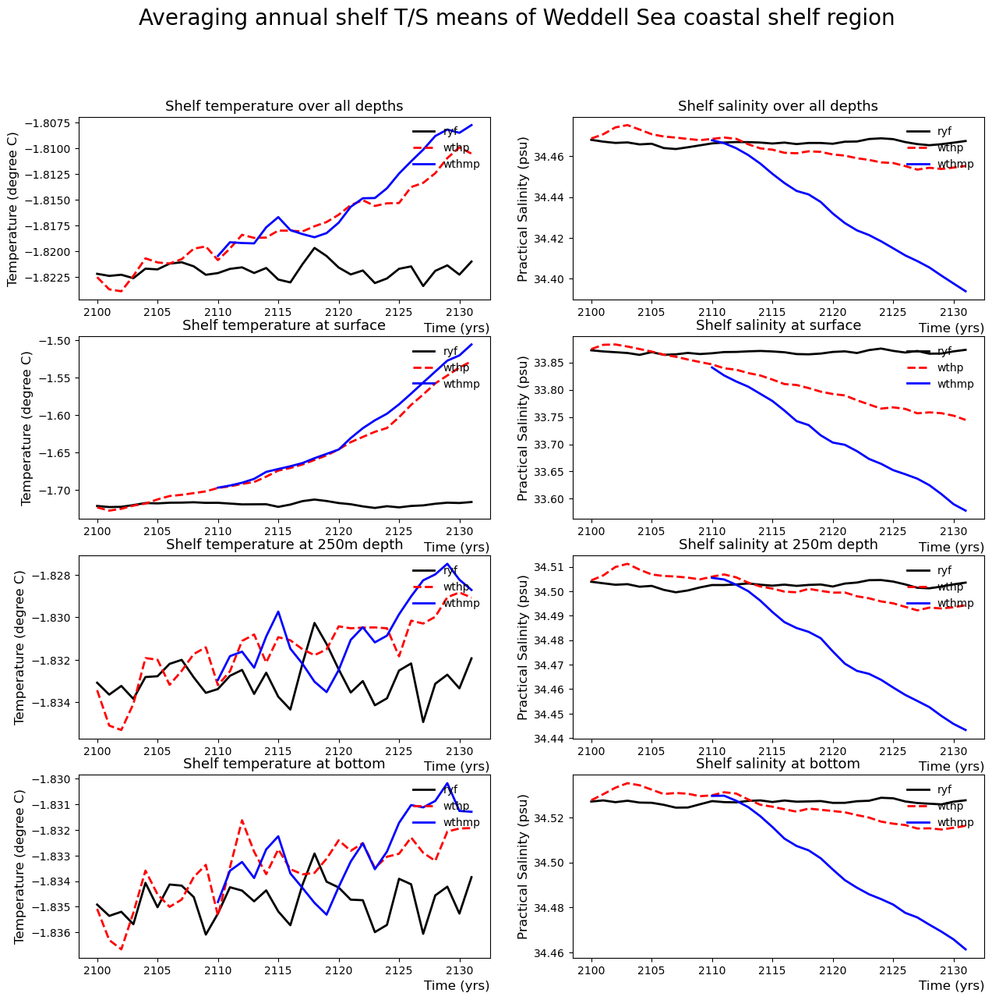

In [37]:
#Plotting annually averaged time series for different regions (30 yrs)
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging annual shelf T/S means of Weddell Sea coastal shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Weddell_annual_mean,temp_st_shelf_wthp_Weddell_annual_mean,
            temp_st_shelf_wthmp_Weddell_annual_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Weddell_annual_mean,salt_st_shelf_wthp_Weddell_annual_mean,
            salt_st_shelf_wthmp_Weddell_annual_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Weddell_annual_mean,temp_surface_shelf_wthp_Weddell_annual_mean,
            temp_surface_shelf_wthmp_Weddell_annual_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Weddell_annual_mean,salt_surface_shelf_wthp_Weddell_annual_mean,
            salt_surface_shelf_wthmp_Weddell_annual_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Weddell_annual_mean,temp_250m_shelf_wthp_Weddell_annual_mean,
            temp_250m_shelf_wthmp_Weddell_annual_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Weddell_annual_mean,salt_250m_shelf_wthp_Weddell_annual_mean,
            salt_250m_shelf_wthmp_Weddell_annual_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Weddell_annual_mean,temp_bottom_shelf_wthp_Weddell_annual_mean,
            temp_bottom_shelf_wthmp_Weddell_annual_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Weddell_annual_mean,salt_bottom_shelf_wthp_Weddell_annual_mean,
            salt_bottom_shelf_wthmp_Weddell_annual_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

For Weddell Sea region

T:
Wind, thermal and humidity perturbation experiment compared to the control ryf experiment shows a consistant warming trend averaging over all depth and surface temperature and a slightly warming at 250m depth and bottom with some fluctations.

Wind, thermal, humidity and meltwater perturbation experiment compared to the wind, thermal and humidity perturbation experiment shows little changes for averaging over all depth and surface temperature at the beginning but slightly cooling in the last 10 yrs. The temp at 250m depth and bottom shows large fluctations.

S:
Wind, thermal and humidity perturbation experiment compared to the control ryf experiment shows a densing signal at the beginning and consistant freshing trend later.

Wind, thermal, humidity and meltwater perturbation experiment compared to the wind, thermal and humidity perturbation experiment shows consistant freshing trend.

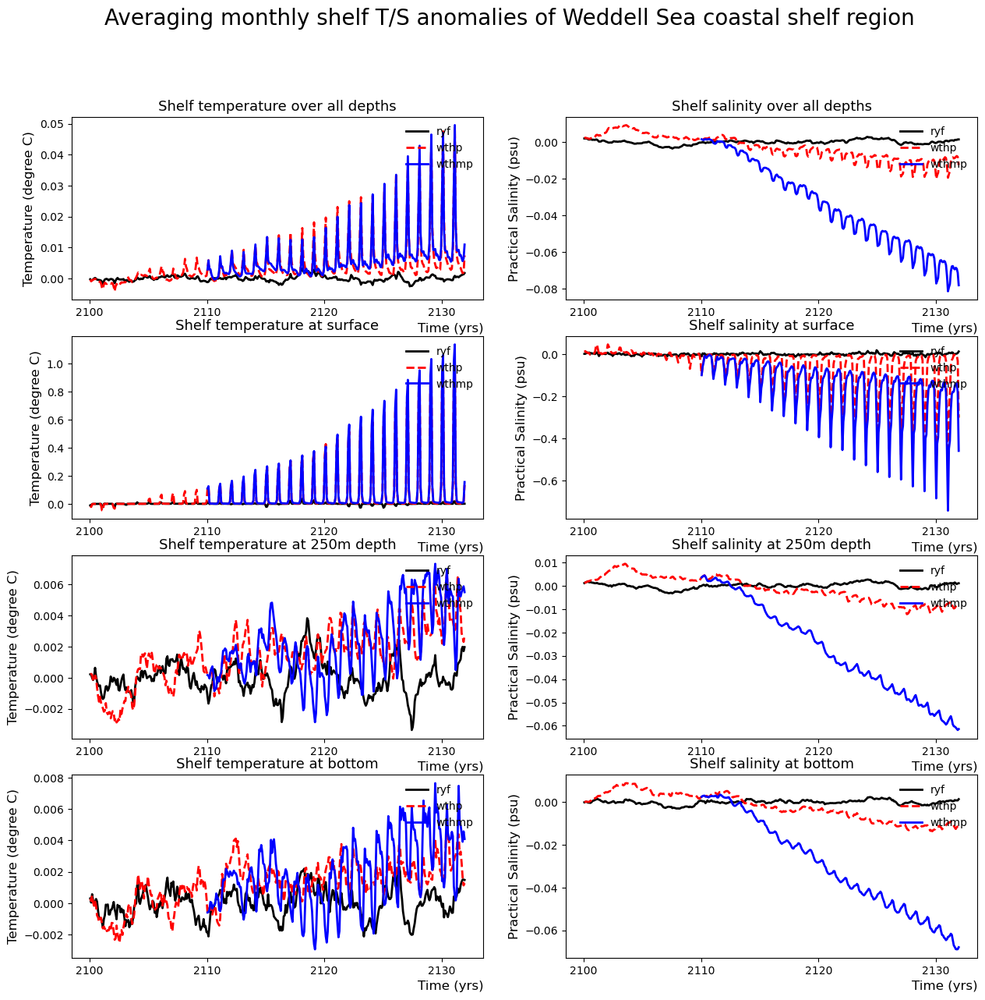

In [38]:
#Plotting anomaly time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S anomalies of Weddell Sea coastal shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Weddell_monthly_anom,temp_st_shelf_wthp_Weddell_monthly_anom,
            temp_st_shelf_wthmp_Weddell_monthly_anom,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Weddell_monthly_anom,salt_st_shelf_wthp_Weddell_monthly_anom,
            salt_st_shelf_wthmp_Weddell_monthly_anom,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Weddell_monthly_anom,temp_surface_shelf_wthp_Weddell_monthly_anom,
            temp_surface_shelf_wthmp_Weddell_monthly_anom,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Weddell_monthly_anom,salt_surface_shelf_wthp_Weddell_monthly_anom,
            salt_surface_shelf_wthmp_Weddell_monthly_anom,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Weddell_monthly_anom,temp_250m_shelf_wthp_Weddell_monthly_anom,
            temp_250m_shelf_wthmp_Weddell_monthly_anom,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Weddell_monthly_anom,salt_250m_shelf_wthp_Weddell_monthly_anom,
            salt_250m_shelf_wthmp_Weddell_monthly_anom,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Weddell_monthly_anom,temp_bottom_shelf_wthp_Weddell_monthly_anom,
            temp_bottom_shelf_wthmp_Weddell_monthly_anom,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Weddell_monthly_anom,salt_bottom_shelf_wthp_Weddell_monthly_anom,
            salt_bottom_shelf_wthmp_Weddell_monthly_anom,'Shelf salinity at bottom','Practical Salinity (psu)')

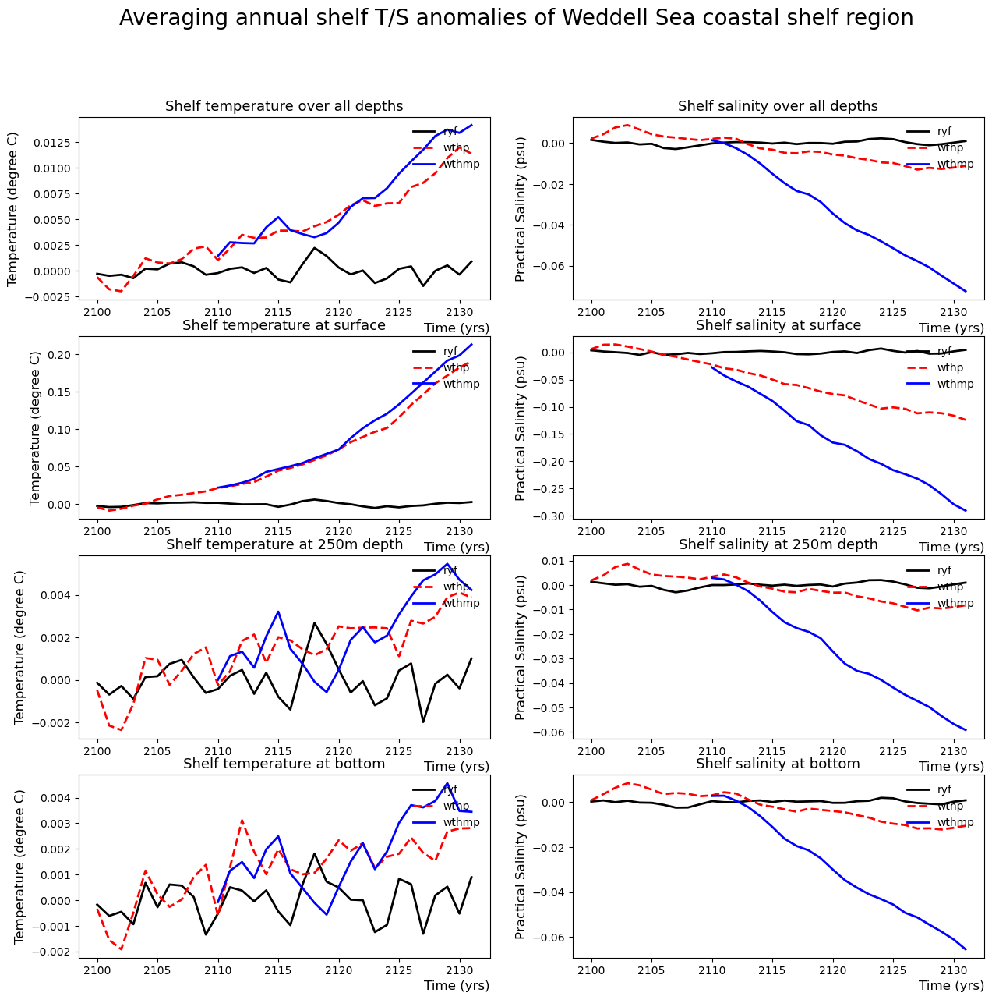

In [39]:
#Plotting annually averaged anomaly time series for different regions (30 yrs)
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging annual shelf T/S anomalies of Weddell Sea coastal shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_Weddell_annual_anom,temp_st_shelf_wthp_Weddell_annual_anom,
            temp_st_shelf_wthmp_Weddell_annual_anom,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Weddell_annual_anom,salt_st_shelf_wthp_Weddell_annual_anom,
            salt_st_shelf_wthmp_Weddell_annual_anom,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Weddell_annual_anom,temp_surface_shelf_wthp_Weddell_annual_anom,
            temp_surface_shelf_wthmp_Weddell_annual_anom,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Weddell_annual_anom,salt_surface_shelf_wthp_Weddell_annual_anom,
            salt_surface_shelf_wthmp_Weddell_annual_anom,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Weddell_annual_anom,temp_250m_shelf_wthp_Weddell_annual_anom,
            temp_250m_shelf_wthmp_Weddell_annual_anom,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Weddell_annual_anom,salt_250m_shelf_wthp_Weddell_annual_anom,
            salt_250m_shelf_wthmp_Weddell_annual_anom,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Weddell_annual_anom,temp_bottom_shelf_wthp_Weddell_annual_anom,
            temp_bottom_shelf_wthmp_Weddell_annual_anom,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Weddell_annual_anom,salt_bottom_shelf_wthp_Weddell_annual_anom,
            salt_bottom_shelf_wthmp_Weddell_annual_anom,'Shelf salinity at bottom','Practical Salinity (psu)')

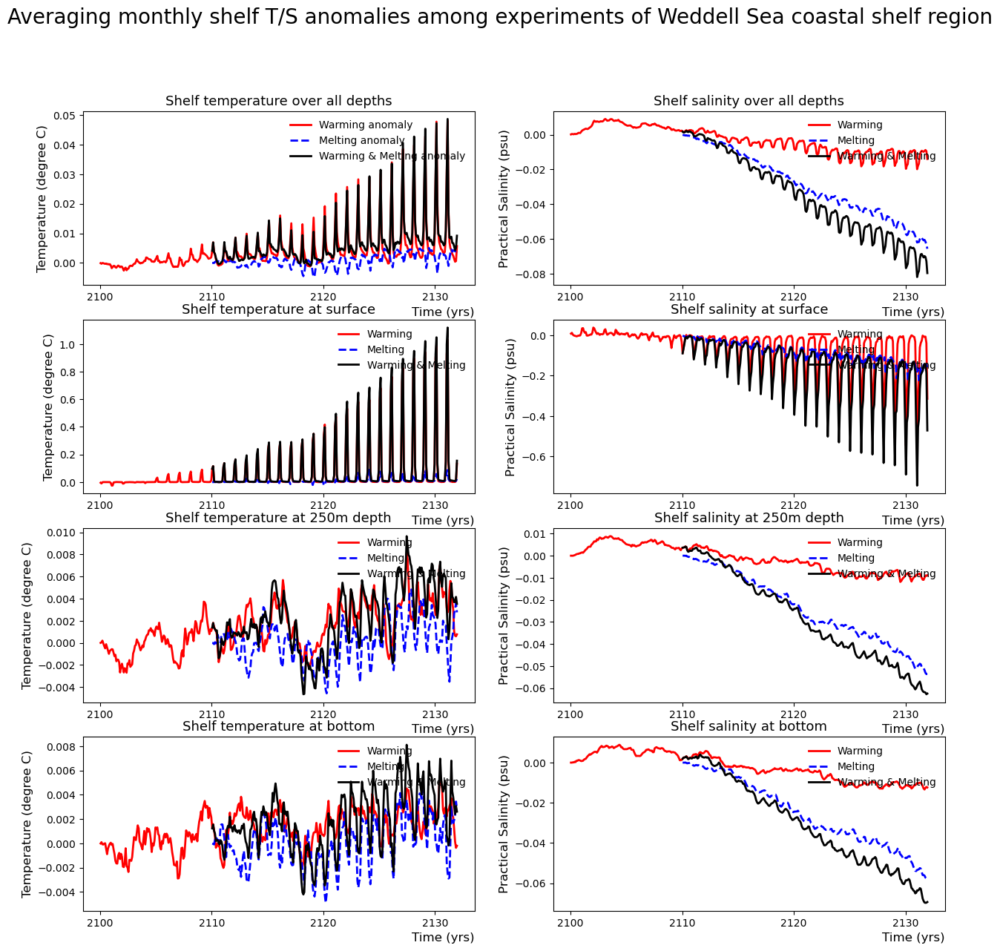

In [101]:
#Plotting among-experiments anomaly time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S anomalies among experiments of Weddell Sea coastal shelf region', fontsize=20)

subplotting_anomaly(temp_st_shelf_ryf_Weddell_monthly_mean,temp_st_shelf_wthp_Weddell_monthly_mean,
            temp_st_shelf_wthmp_Weddell_monthly_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_Weddell_monthly_mean,salt_st_shelf_wthp_Weddell_monthly_mean,
            salt_st_shelf_wthmp_Weddell_monthly_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_Weddell_monthly_mean,temp_surface_shelf_wthp_Weddell_monthly_mean,
            temp_surface_shelf_wthmp_Weddell_monthly_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_Weddell_monthly_mean,salt_surface_shelf_wthp_Weddell_monthly_mean,
            salt_surface_shelf_wthmp_Weddell_monthly_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_Weddell_monthly_mean,temp_250m_shelf_wthp_Weddell_monthly_mean,
            temp_250m_shelf_wthmp_Weddell_monthly_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_Weddell_monthly_mean,salt_250m_shelf_wthp_Weddell_monthly_mean,
            salt_250m_shelf_wthmp_Weddell_monthly_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_Weddell_monthly_mean,temp_bottom_shelf_wthp_Weddell_monthly_mean,
            temp_bottom_shelf_wthmp_Weddell_monthly_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_Weddell_monthly_mean,salt_bottom_shelf_wthp_Weddell_monthly_mean,
            salt_bottom_shelf_wthmp_Weddell_monthly_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

## Cape Darnley polynya shelf region

In [ ]:
#Plotting time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S means of Cape Darnley shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_CapeD_monthly_mean,temp_st_shelf_wthp_CapeD_monthly_mean,
            temp_st_shelf_wthmp_CapeD_monthly_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_CapeD_monthly_mean,salt_st_shelf_wthp_CapeD_monthly_mean,
            salt_st_shelf_wthmp_CapeD_monthly_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_CapeD_monthly_mean,temp_surface_shelf_wthp_CapeD_monthly_mean,
            temp_surface_shelf_wthmp_CapeD_monthly_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_CapeD_monthly_mean,salt_surface_shelf_wthp_CapeD_monthly_mean,
            salt_surface_shelf_wthmp_CapeD_monthly_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_CapeD_monthly_mean,temp_250m_shelf_wthp_CapeD_monthly_mean,
            temp_250m_shelf_wthmp_CapeD_monthly_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_CapeD_monthly_mean,salt_250m_shelf_wthp_CapeD_monthly_mean,
            salt_250m_shelf_wthmp_CapeD_monthly_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_CapeD_monthly_mean,temp_bottom_shelf_wthp_CapeD_monthly_mean,
            temp_bottom_shelf_wthmp_CapeD_monthly_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_CapeD_monthly_mean,salt_bottom_shelf_wthp_CapeD_monthly_mean,
            salt_bottom_shelf_wthmp_CapeD_monthly_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

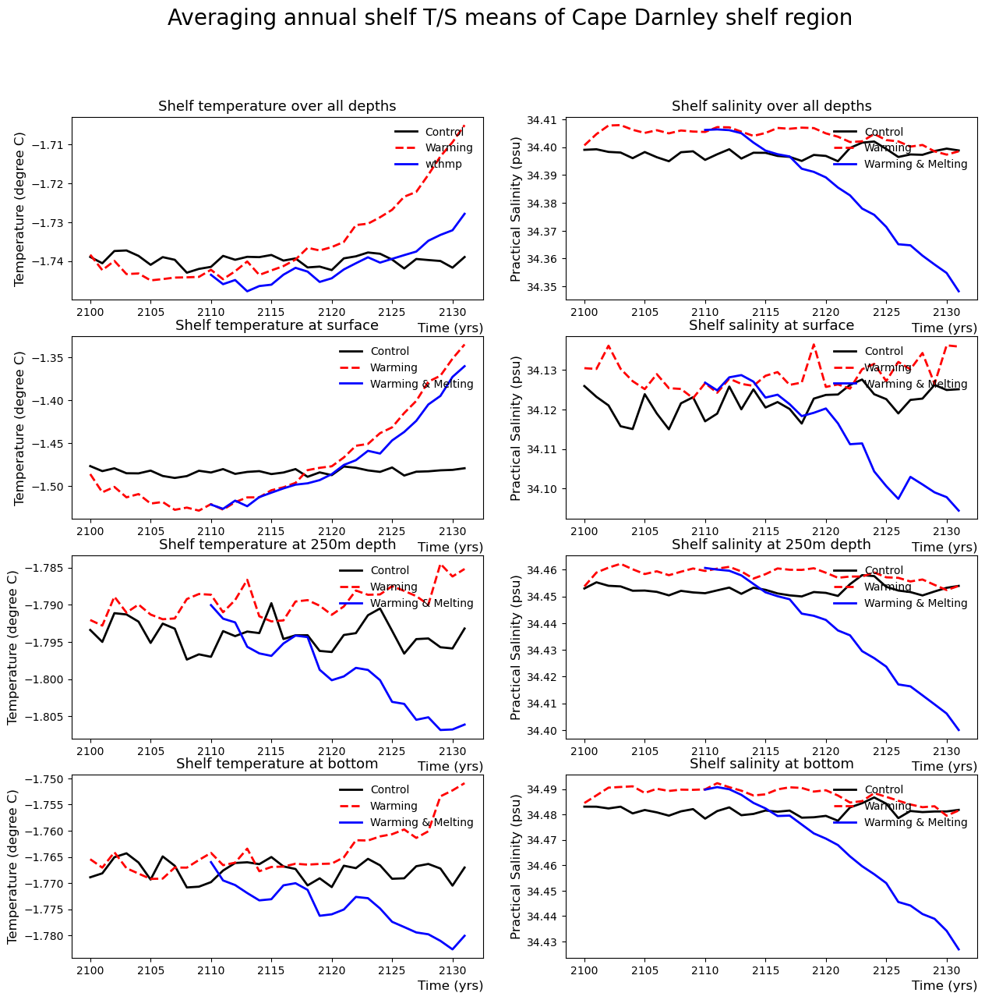

In [100]:
#Plotting annually averaged time series for different regions (30 yrs)
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging annual shelf T/S means of Cape Darnley shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_CapeD_annual_mean,temp_st_shelf_wthp_CapeD_annual_mean,
            temp_st_shelf_wthmp_CapeD_annual_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_CapeD_annual_mean,salt_st_shelf_wthp_CapeD_annual_mean,
            salt_st_shelf_wthmp_CapeD_annual_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_CapeD_annual_mean,temp_surface_shelf_wthp_CapeD_annual_mean,
            temp_surface_shelf_wthmp_CapeD_annual_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_CapeD_annual_mean,salt_surface_shelf_wthp_CapeD_annual_mean,
            salt_surface_shelf_wthmp_CapeD_annual_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_CapeD_annual_mean,temp_250m_shelf_wthp_CapeD_annual_mean,
            temp_250m_shelf_wthmp_CapeD_annual_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_CapeD_annual_mean,salt_250m_shelf_wthp_CapeD_annual_mean,
            salt_250m_shelf_wthmp_CapeD_annual_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_CapeD_annual_mean,temp_bottom_shelf_wthp_CapeD_annual_mean,
            temp_bottom_shelf_wthmp_CapeD_annual_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_CapeD_annual_mean,salt_bottom_shelf_wthp_CapeD_annual_mean,
            salt_bottom_shelf_wthmp_CapeD_annual_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

For Cape Darnley region

T:
Wind, thermal and humidity perturbation experiment compared to the control ryf experiment shows a cooling then consistant warming trend averaging over all depths and surface temperature and little warming shifts with fluctations at 250m depth and bottom, with a stronger shift at 250m depth.

Wind, thermal, humidity and meltwater perturbation experiment compared to the wind, thermal and humidity perturbation experiment shows less warming, with averaging over all depths being stronger. T at 250m depth and bottom instead experienced cooling response.

S:
Wind, thermal and humidity perturbation experiment compared to the control ryf experiment shows a slightly densing shifts.

Wind, thermal, humidity and meltwater perturbation experiment compared to the wind, thermal and humidity perturbation experiment shows consistant strong freshing trend.

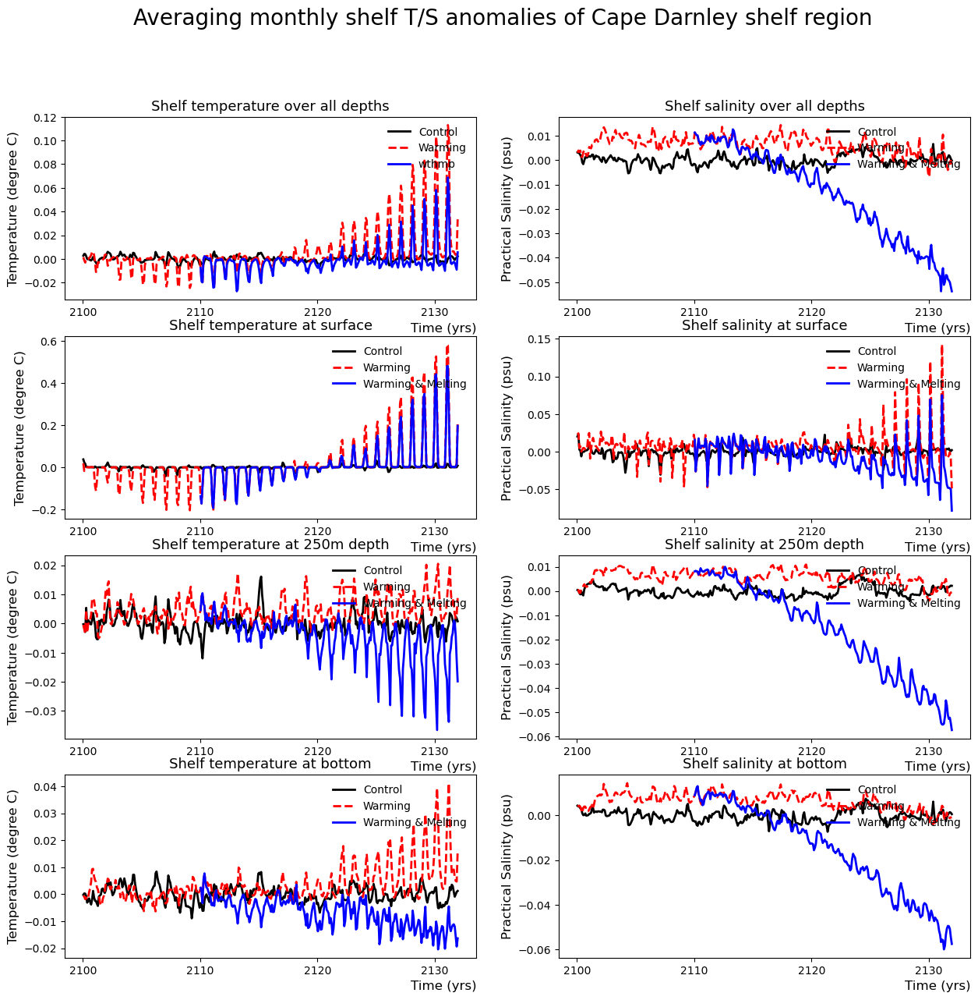

In [99]:
#Plotting anomaly time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S anomalies of Cape Darnley shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_CapeD_monthly_anom,temp_st_shelf_wthp_CapeD_monthly_anom,
            temp_st_shelf_wthmp_CapeD_monthly_anom,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_CapeD_monthly_anom,salt_st_shelf_wthp_CapeD_monthly_anom,
            salt_st_shelf_wthmp_CapeD_monthly_anom,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_CapeD_monthly_anom,temp_surface_shelf_wthp_CapeD_monthly_anom,
            temp_surface_shelf_wthmp_CapeD_monthly_anom,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_CapeD_monthly_anom,salt_surface_shelf_wthp_CapeD_monthly_anom,
            salt_surface_shelf_wthmp_CapeD_monthly_anom,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_CapeD_monthly_anom,temp_250m_shelf_wthp_CapeD_monthly_anom,
            temp_250m_shelf_wthmp_CapeD_monthly_anom,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_CapeD_monthly_anom,salt_250m_shelf_wthp_CapeD_monthly_anom,
            salt_250m_shelf_wthmp_CapeD_monthly_anom,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_CapeD_monthly_anom,temp_bottom_shelf_wthp_CapeD_monthly_anom,
            temp_bottom_shelf_wthmp_CapeD_monthly_anom,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_CapeD_monthly_anom,salt_bottom_shelf_wthp_CapeD_monthly_anom,
            salt_bottom_shelf_wthmp_CapeD_monthly_anom,'Shelf salinity at bottom','Practical Salinity (psu)')

In [ ]:
#Plotting annually averaged time series for different regions (30 yrs)
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging annual shelf T/S anomalies of Cape Darnley shelf region', fontsize=20)

subplotting(temp_st_shelf_ryf_CapeD_annual_anom,temp_st_shelf_wthp_CapeD_annual_anom,
            temp_st_shelf_wthmp_CapeD_annual_anom,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_CapeD_annual_anom,salt_st_shelf_wthp_CapeD_annual_anom,
            salt_st_shelf_wthmp_CapeD_annual_anom,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_CapeD_annual_anom,temp_surface_shelf_wthp_CapeD_annual_anom,
            temp_surface_shelf_wthmp_CapeD_annual_anom,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_CapeD_annual_anom,salt_surface_shelf_wthp_CapeD_annual_anom,
            salt_surface_shelf_wthmp_CapeD_annual_anom,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_CapeD_annual_anom,temp_250m_shelf_wthp_CapeD_annual_anom,
            temp_250m_shelf_wthmp_CapeD_annual_anom,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_CapeD_annual_anom,salt_250m_shelf_wthp_CapeD_annual_anom,
            salt_250m_shelf_wthmp_CapeD_annual_anom,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_CapeD_annual_anom,temp_bottom_shelf_wthp_CapeD_annual_anom,
            temp_bottom_shelf_wthmp_CapeD_annual_anom,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_CapeD_annual_anom,salt_bottom_shelf_wthp_CapeD_annual_anom,
            salt_bottom_shelf_wthmp_CapeD_annual_anom,'Shelf salinity at bottom','Practical Salinity (psu)')

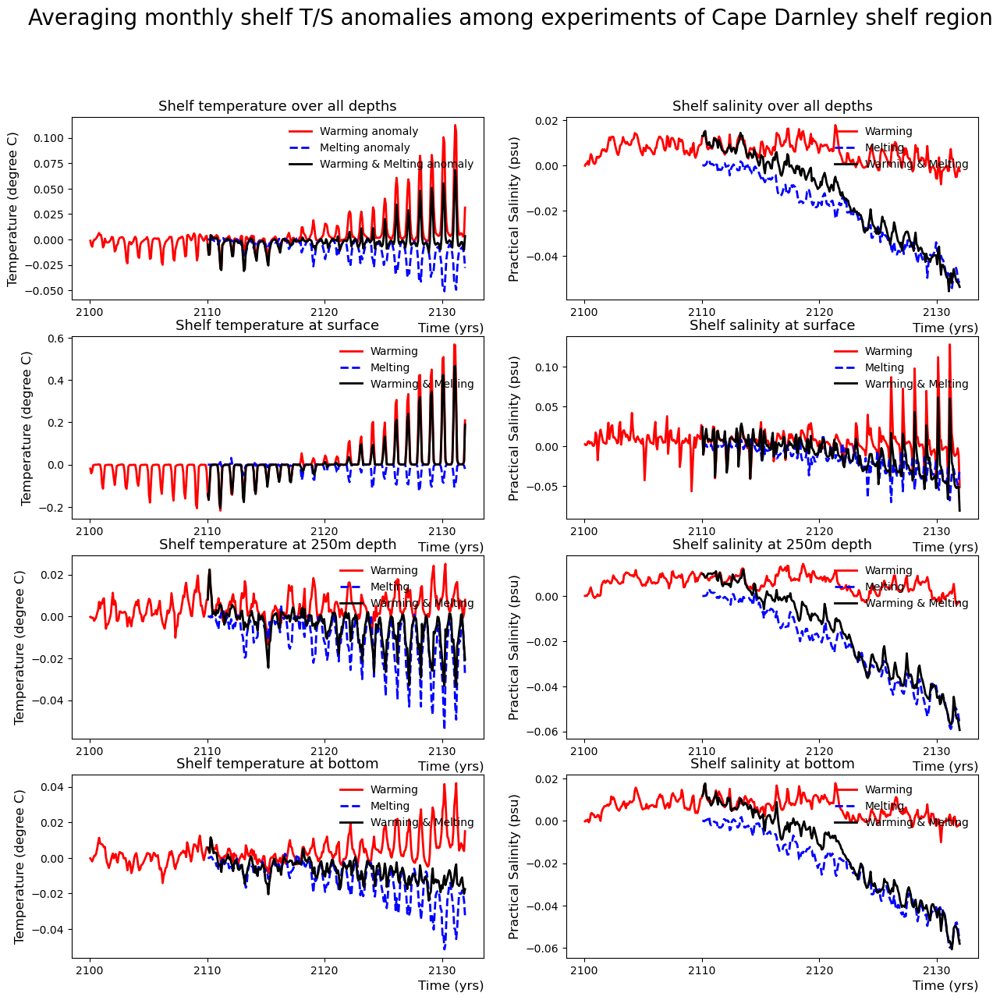

In [86]:
#Plotting among-experiments anomaly time series for different regions for 359 months
fig = plt.figure(figsize=(15, 14))
fig.suptitle('Averaging monthly shelf T/S anomalies among experiments of Cape Darnley shelf region', fontsize=20)

subplotting_anomaly(temp_st_shelf_ryf_CapeD_monthly_mean,temp_st_shelf_wthp_CapeD_monthly_mean,
            temp_st_shelf_wthmp_CapeD_monthly_mean,'Shelf temperature over all depths','Temperature (degree C)',
            salt_st_shelf_ryf_CapeD_monthly_mean,salt_st_shelf_wthp_CapeD_monthly_mean,
            salt_st_shelf_wthmp_CapeD_monthly_mean,'Shelf salinity over all depths','Practical Salinity (psu)',
            temp_surface_shelf_ryf_CapeD_monthly_mean,temp_surface_shelf_wthp_CapeD_monthly_mean,
            temp_surface_shelf_wthmp_CapeD_monthly_mean,'Shelf temperature at surface','Temperature (degree C)',
            salt_surface_shelf_ryf_CapeD_monthly_mean,salt_surface_shelf_wthp_CapeD_monthly_mean,
            salt_surface_shelf_wthmp_CapeD_monthly_mean,'Shelf salinity at surface','Practical Salinity (psu)',
            temp_250m_shelf_ryf_CapeD_monthly_mean,temp_250m_shelf_wthp_CapeD_monthly_mean,
            temp_250m_shelf_wthmp_CapeD_monthly_mean,'Shelf temperature at 250m depth','Temperature (degree C)',
            salt_250m_shelf_ryf_CapeD_monthly_mean,salt_250m_shelf_wthp_CapeD_monthly_mean,
            salt_250m_shelf_wthmp_CapeD_monthly_mean,'Shelf salinity at 250m depth','Practical Salinity (psu)',
            temp_bottom_shelf_ryf_CapeD_monthly_mean,temp_bottom_shelf_wthp_CapeD_monthly_mean,
            temp_bottom_shelf_wthmp_CapeD_monthly_mean,'Shelf temperature at bottom','Temperature (degree C)',
            salt_bottom_shelf_ryf_CapeD_monthly_mean,salt_bottom_shelf_wthp_CapeD_monthly_mean,
            salt_bottom_shelf_wthmp_CapeD_monthly_mean,'Shelf salinity at bottom','Practical Salinity (psu)')

# Circumpolar annual experimental anomaly shelf region map

In [50]:
# Function for making circumpolar map:
def circumpolar_map():
    # Map the plot boundaries to a circle
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    # Add land features and gridlines
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='black',
                                                facecolor='lightgray'), zorder = 2)
    ax.gridlines(color='grey', linestyle='--')
    
# Remember to define the levels for the contourf first
# Example: lvls = np.arange(-3, 2, 0.1)

def annual_circumpolar_plotting(var_depth_shelf):
    var_depth_shelf = var_depth_shelf.sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
    var_depth_shelf_annual_mean = var_depth_shelf.groupby('time.year').mean(dim='time')

    ax = fig.add_subplot(331, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf1 = ax.contourf(var_depth_shelf_annual_mean.isel(year = 0)['xt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 0)['yt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 0), levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2110', fontsize=16)
    
    ax = fig.add_subplot(332, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf2 = ax.contourf(var_depth_shelf_annual_mean.isel(year = 3)['xt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 3)['yt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 3), levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2113', fontsize=16)

    ax = fig.add_subplot(333, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf3 = ax.contourf(var_depth_shelf_annual_mean.isel(year = 6)['xt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 6)['yt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 6), levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2116', fontsize=16)
    
    ax = fig.add_subplot(334, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf4 = ax.contourf(var_depth_shelf_annual_mean.isel(year = 9)['xt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 9)['yt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 9), levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2119', fontsize=16)
    
    ax = fig.add_subplot(335, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf5 = ax.contourf(var_depth_shelf_annual_mean.isel(year = 12)['xt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 12)['yt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 12), levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2122', fontsize=16)
    
    ax = fig.add_subplot(336, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf6 = ax.contourf(var_depth_shelf_annual_mean.isel(year = 15)['xt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 15)['yt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 15), levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2125', fontsize=16)
    
    ax = fig.add_subplot(337, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf7 = ax.contourf(var_depth_shelf_annual_mean.isel(year = 18)['xt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 18)['yt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 18), levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2128', fontsize=16)
    
    ax = fig.add_subplot(338, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf8 = ax.contourf(var_depth_shelf_annual_mean.isel(year = 21)['xt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 21)['yt_ocean'], 
                     var_depth_shelf_annual_mean.isel(year = 21), levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2131', fontsize=16)
    
    fig.colorbar(cf1, ax=axes[:, :], shrink=0.8)

In [67]:
def annual_shelf_plotting(var_depth_shelf):
    var_depth_shelf = var_depth_shelf.sel(time=slice('2110-01-01 00:00:00','2131-12-31 00:00:00'))
    var_depth_shelf_annual_mean = var_depth_shelf.groupby('time.year').mean(dim='time')
    
    ax = plt.subplot(3,3,1)
    var_depth_shelf_annual_mean.isel(year = 0).plot() 
    plt.title('2110', fontsize=16)
    plt.xlabel('Longitude (degrees E)', fontsize=12)
    plt.ylabel('Latitude (degrees N)', fontsize=12)
    
    ax = plt.subplot(3,3,2)
    var_depth_shelf_annual_mean.isel(year = 3).plot() 
    plt.title('2113', fontsize=16)
    plt.xlabel('Longitude (degrees E)', fontsize=12)
    plt.ylabel('Latitude (degrees N)', fontsize=12)

    ax = plt.subplot(3,3,3)
    var_depth_shelf_annual_mean.isel(year = 6).plot() 
    plt.title('2116', fontsize=16)
    plt.xlabel('Longitude (degrees E)', fontsize=12)
    plt.ylabel('Latitude (degrees N)', fontsize=12)
    
    ax = plt.subplot(3,3,4)
    var_depth_shelf_annual_mean.isel(year = 9).plot() 
    plt.title('2119', fontsize=16)
    plt.xlabel('Longitude (degrees E)', fontsize=12)
    plt.ylabel('Latitude (degrees N)', fontsize=12)
    
    ax = plt.subplot(3,3,5)
    var_depth_shelf_annual_mean.isel(year = 12).plot() 
    plt.title('2122', fontsize=16)
    plt.xlabel('Longitude (degrees E)', fontsize=12)
    plt.ylabel('Latitude (degrees N)', fontsize=12)
    
    ax = plt.subplot(3,3,6)
    var_depth_shelf_annual_mean.isel(year = 15).plot() 
    plt.title('2125', fontsize=16)
    plt.xlabel('Longitude (degrees E)', fontsize=12)
    plt.ylabel('Latitude (degrees N)', fontsize=12)
    
    ax = plt.subplot(3,3,7)
    var_depth_shelf_annual_mean.isel(year = 18).plot() 
    plt.title('2128', fontsize=16)
    plt.xlabel('Longitude (degrees E)', fontsize=12)
    plt.ylabel('Latitude (degrees N)', fontsize=12)
    
    ax = plt.subplot(3,3,8)
    var_depth_shelf_annual_mean.isel(year = 21).plot() 
    plt.title('2131', fontsize=16)
    plt.xlabel('Longitude (degrees E)', fontsize=12)
    plt.ylabel('Latitude (degrees N)', fontsize=12)

In [21]:
temp_surface_shelf_1 = temp_surface_shelf_ryf.sel(time=slice('2110-01-01 00:00:00','2112-12-31 00:00:00'))
temp_surface_season_1 = temp_surface_shelf_1.groupby('time.season').mean(dim='time')
temp_surface_season_1

<xarray.DataArray (season: 4, yt_ocean: 490, xt_ocean: 3600)>
dask.array<stack, shape=(4, 490, 3600), dtype=float64, chunksize=(1, 300, 400), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 -81.11 -81.07 -81.02 ... -60.15 -60.1 -60.05
    st_ocean  float64 0.5413
    geolon_t  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(490, 900), meta=np.ndarray>
    geolat_t  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(490, 900), meta=np.ndarray>
  * season    (season) object 'DJF' 'JJA' 'MAM' 'SON'

In [23]:
temp_surface_summer_1 = temp_surface_season_1.sel(temp_surface_season_1.season == 'DJF')

ValueError: the first argument to .sel must be a dictionary

In [88]:
# Function for making circumpolar map in summer (DJF):
def summer_circumpolar_plotting(var_depth_shelf):
    var_depth_shelf_1 = var_depth_shelf.sel(time=slice('2110-01-01 00:00:00','2112-12-31 00:00:00'))
    var_depth_shelf_2 = var_depth_shelf.sel(time=slice('2113-01-01 00:00:00','2115-12-31 00:00:00'))
    var_depth_shelf_3 = var_depth_shelf.sel(time=slice('2116-01-01 00:00:00','2118-12-31 00:00:00'))
    var_depth_shelf_4 = var_depth_shelf.sel(time=slice('2119-01-01 00:00:00','2121-12-31 00:00:00'))
    var_depth_shelf_5 = var_depth_shelf.sel(time=slice('2122-01-01 00:00:00','2124-12-31 00:00:00'))
    var_depth_shelf_6 = var_depth_shelf.sel(time=slice('2125-01-01 00:00:00','2127-12-31 00:00:00'))
    var_depth_shelf_7 = var_depth_shelf.sel(time=slice('2128-01-01 00:00:00','2130-12-31 00:00:00'))
    var_depth_shelf_8 = var_depth_shelf.sel(time=slice('2131-01-01 00:00:00','2133-12-31 00:00:00'))
    var_depth_shelf_season_1 = var_depth_shelf_1.groupby('time.season').mean(dim='time')
    var_depth_shelf_season_2 = var_depth_shelf_2.groupby('time.season').mean(dim='time')
    var_depth_shelf_season_3 = var_depth_shelf_3.groupby('time.season').mean(dim='time')
    var_depth_shelf_season_4 = var_depth_shelf_4.groupby('time.season').mean(dim='time')
    var_depth_shelf_season_5 = var_depth_shelf_5.groupby('time.season').mean(dim='time')
    var_depth_shelf_season_6 = var_depth_shelf_6.groupby('time.season').mean(dim='time')
    var_depth_shelf_season_7 = var_depth_shelf_7.groupby('time.season').mean(dim='time')
    var_depth_shelf_season_8 = var_depth_shelf_8.groupby('time.season').mean(dim='time')
    var_depth_shelf_summer_1 = var_depth_shelf_season_1.isel(season = 'DJF')
    var_depth_shelf_summer_2 = var_depth_shelf_season_2.isel(season = 'DJF')
    var_depth_shelf_summer_3 = var_depth_shelf_season_3.isel(season = 'DJF')
    var_depth_shelf_summer_4 = var_depth_shelf_season_4.isel(season = 'DJF')
    var_depth_shelf_summer_5 = var_depth_shelf_season_5.isel(season = 'DJF')
    var_depth_shelf_summer_6 = var_depth_shelf_season_6.isel(season = 'DJF')
    var_depth_shelf_summer_7 = var_depth_shelf_season_7.isel(season = 'DJF')
    var_depth_shelf_summer_8 = var_depth_shelf_season_8.isel(season = 'DJF')

    ax = fig.add_subplot(331, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf1 = ax.contourf(var_depth_shelf_season_1['xt_ocean'], 
                     var_depth_shelf_season_1['yt_ocean'], 
                     var_depth_shelf_season_1, levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2110-2112', fontsize=16)
    
    ax = fig.add_subplot(332, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf2 = ax.contourf(var_depth_shelf_season_2['xt_ocean'], 
                     var_depth_shelf_season_2['yt_ocean'], 
                     var_depth_shelf_season_2, levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2113-2115', fontsize=16)

    ax = fig.add_subplot(333, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf3 = ax.contourf(var_depth_shelf_season_3['xt_ocean'], 
                     var_depth_shelf_season_3['yt_ocean'], 
                     var_depth_shelf_season_3, levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2116-2118', fontsize=16)
    
    ax = fig.add_subplot(334, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf4 = ax.contourf(var_depth_shelf_season_4['xt_ocean'], 
                     var_depth_shelf_season_4['yt_ocean'], 
                     var_depth_shelf_season_4, levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2119-2121', fontsize=16)
    
    ax = fig.add_subplot(335, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf5 = ax.contourf(var_depth_shelf_season_5.isel(year = 12)['xt_ocean'], 
                     var_depth_shelf_season_5.isel(year = 12)['yt_ocean'], 
                     var_depth_shelf_season_5.isel(year = 12), levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2122-2124', fontsize=16)
    
    ax = fig.add_subplot(336, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf6 = ax.contourf(var_depth_shelf_season_6.isel(year = 15)['xt_ocean'], 
                     var_depth_shelf_season_6.isel(year = 15)['yt_ocean'], 
                     var_depth_shelf_season_6.isel(year = 15), levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2125-2127', fontsize=16)
    
    ax = fig.add_subplot(337, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf7 = ax.contourf(var_depth_shelf_season_7.isel(year = 18)['xt_ocean'], 
                     var_depth_shelf_season_7.isel(year = 18)['yt_ocean'], 
                     var_depth_shelf_season_7.isel(year = 18), levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2128-2130', fontsize=16)
    
    ax = fig.add_subplot(338, projection = ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -80, -60], crs=ccrs.PlateCarree())
    circumpolar_map()
    # Plot the shelf region
    cf8 = ax.contourf(var_depth_shelf_season_8.isel(year = 21)['xt_ocean'], 
                     var_depth_shelf_season_8.isel(year = 21)['yt_ocean'], 
                     var_depth_shelf_season_8.isel(year = 21), levels = lvls, cmap = cm.cm.thermal, 
                     extend = 'both', transform = ccrs.PlateCarree())
    plt.title('2131-2133', fontsize=16)
    
    fig.colorbar(cf1, ax=axes[:, :], shrink=0.8)

## RYF control experiment

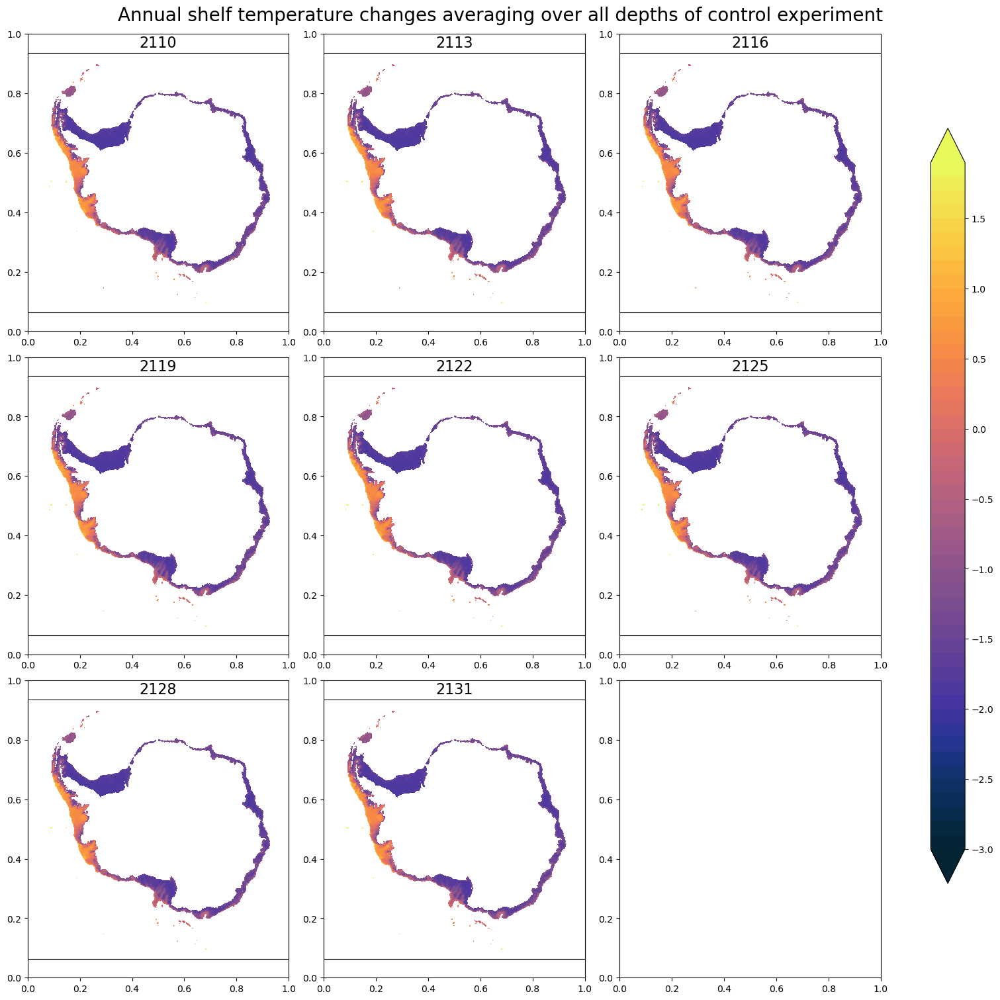

In [55]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Annual shelf temperature changes averaging over all depths of control experiment', fontsize=20)
lvls = np.arange(-3, 2, 0.1)
annual_circumpolar_plotting(temp_st_shelf_ryf)

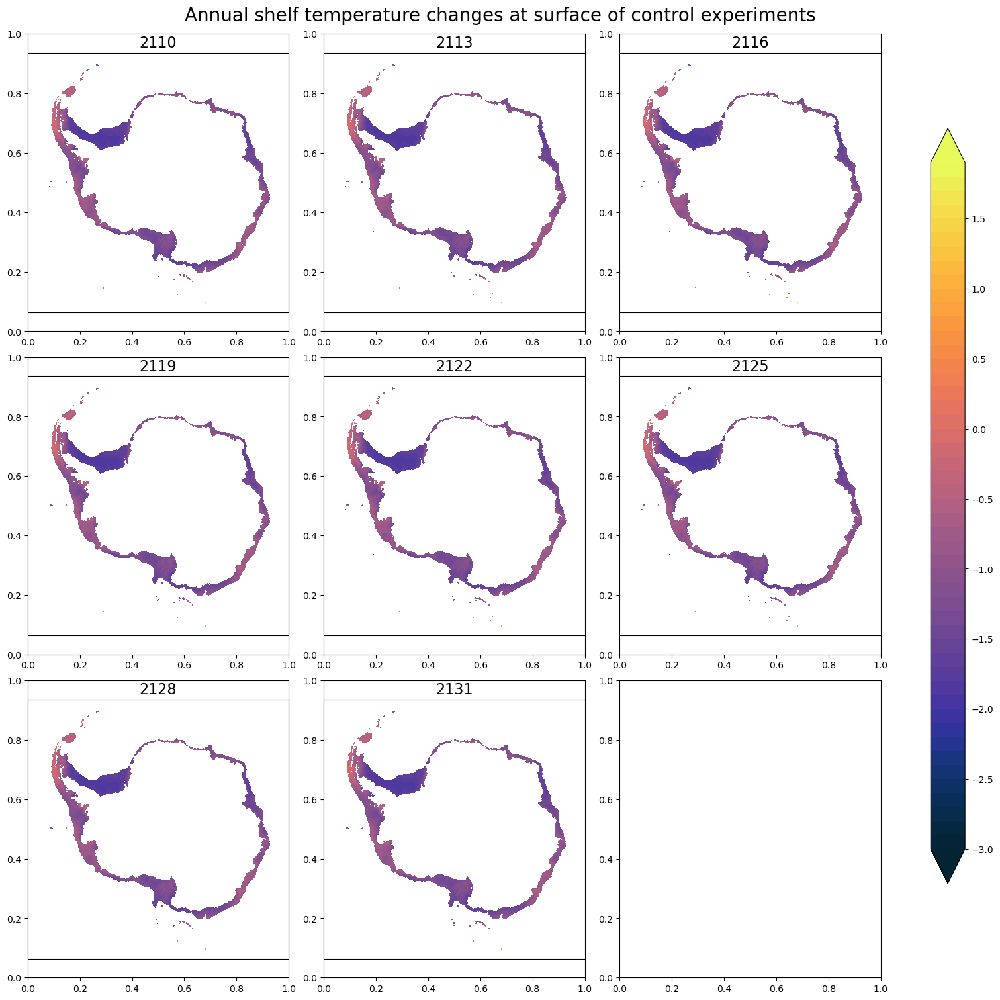

In [56]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Annual shelf temperature changes at surface of control experiments', fontsize=20)
lvls = np.arange(-3, 2, 0.1)
annual_circumpolar_plotting(temp_surface_shelf_ryf)

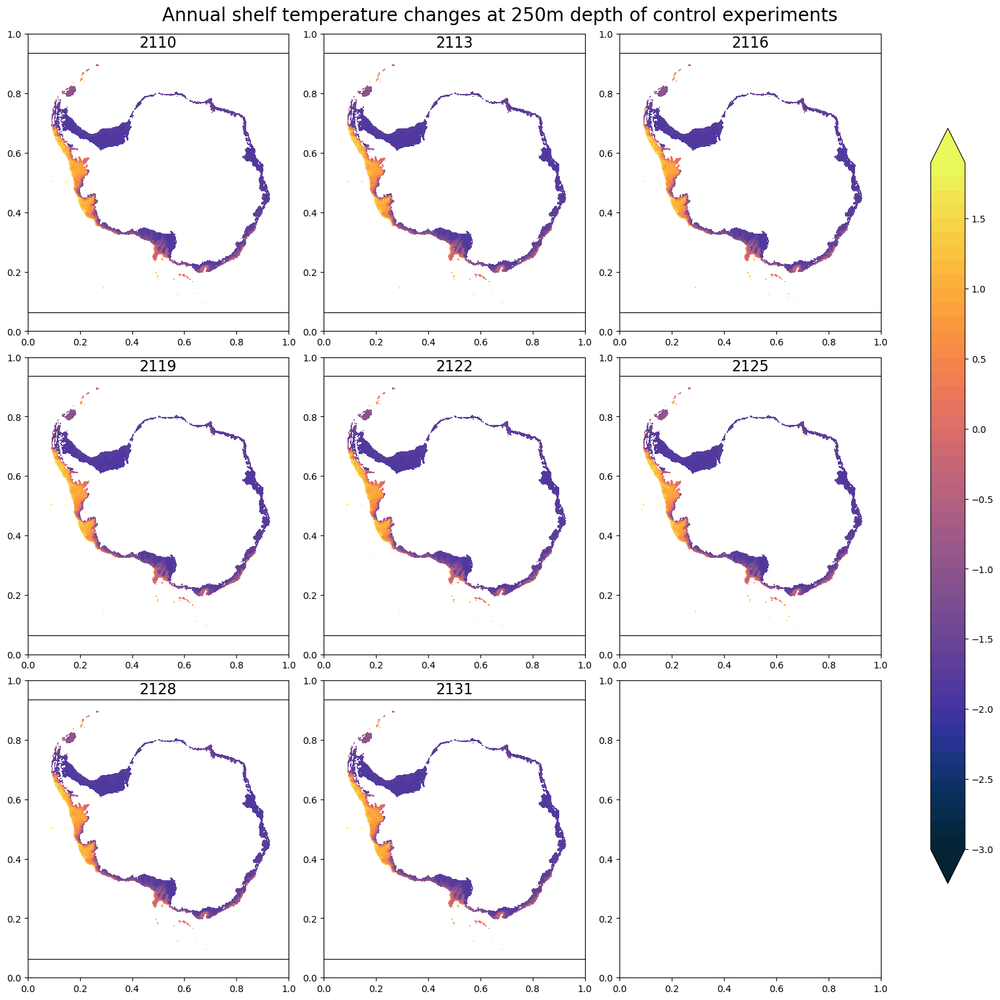

In [57]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Annual shelf temperature changes at 250m depth of control experiments', fontsize=20)
lvls = np.arange(-3, 2, 0.1)
annual_circumpolar_plotting(temp_250m_shelf_ryf)

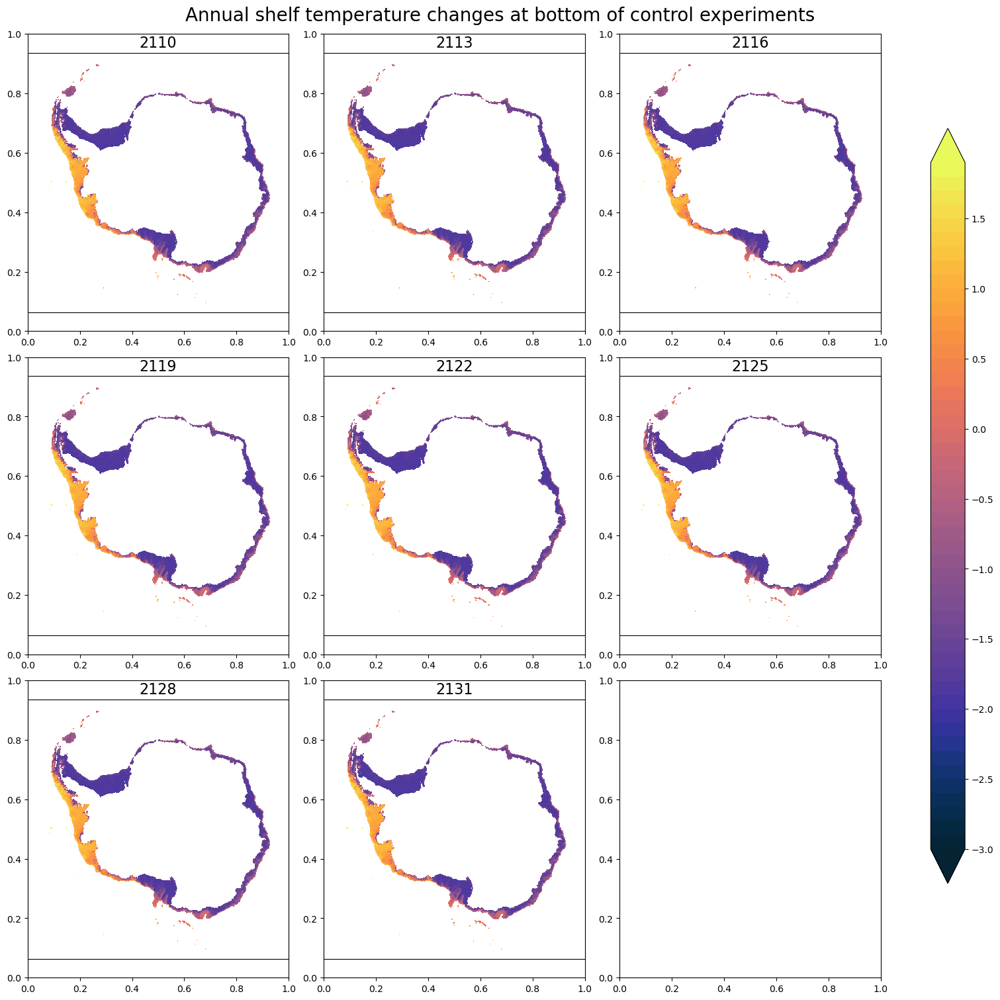

In [58]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Annual shelf temperature changes at bottom of control experiments', fontsize=20)
lvls = np.arange(-3, 2, 0.1)
annual_circumpolar_plotting(temp_bottom_shelf_ryf)

# Add a colorbar
cbar = fig.colorbar(cf, ax = ax, orientation = 'vertical', shrink = 0.5)
cbar.set_label('Temperature [C]')

## Temperature changes under only warming

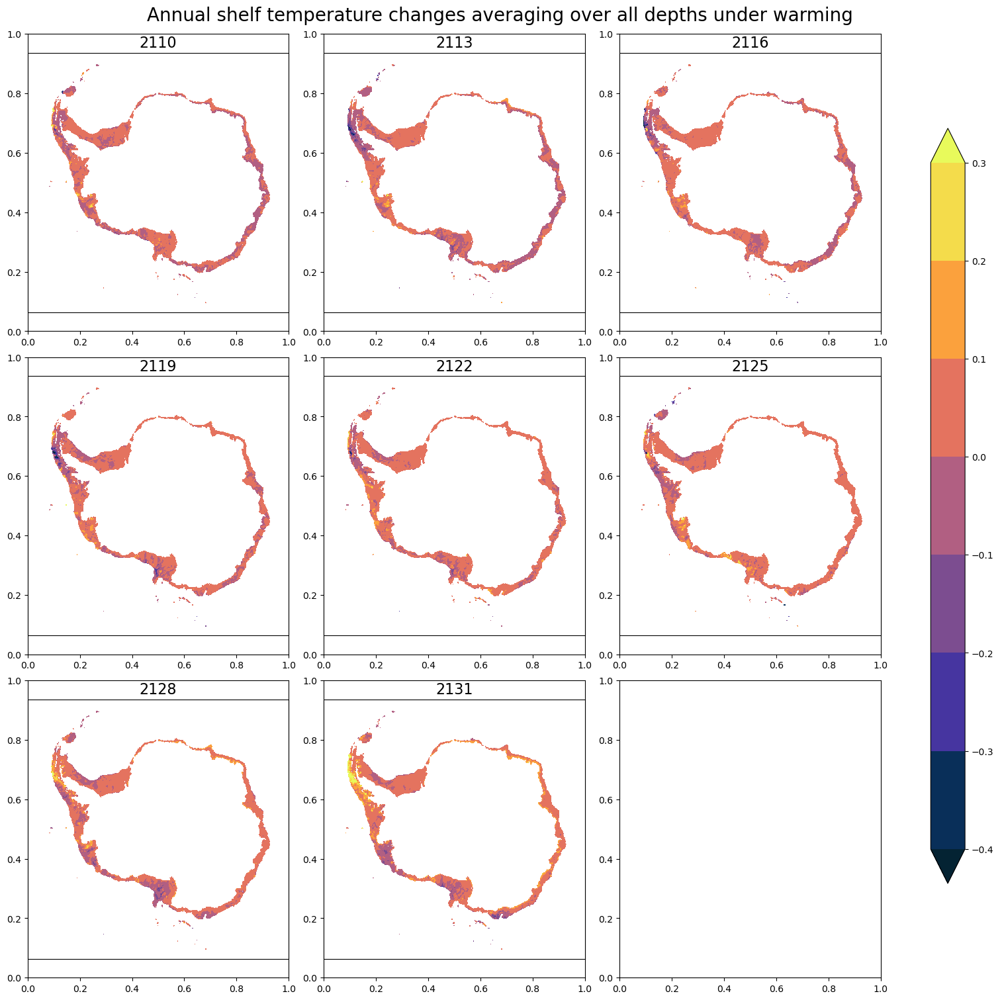

In [59]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Annual shelf temperature changes averaging over all depths under warming', fontsize=20)
lvls = np.arange(-0.4, 0.4, 0.1)
annual_circumpolar_plotting(temp_st_shelf_warmanom)

TypeError: invalid indexer array, does not have integer dtype: array('DJF', dtype='<U3')

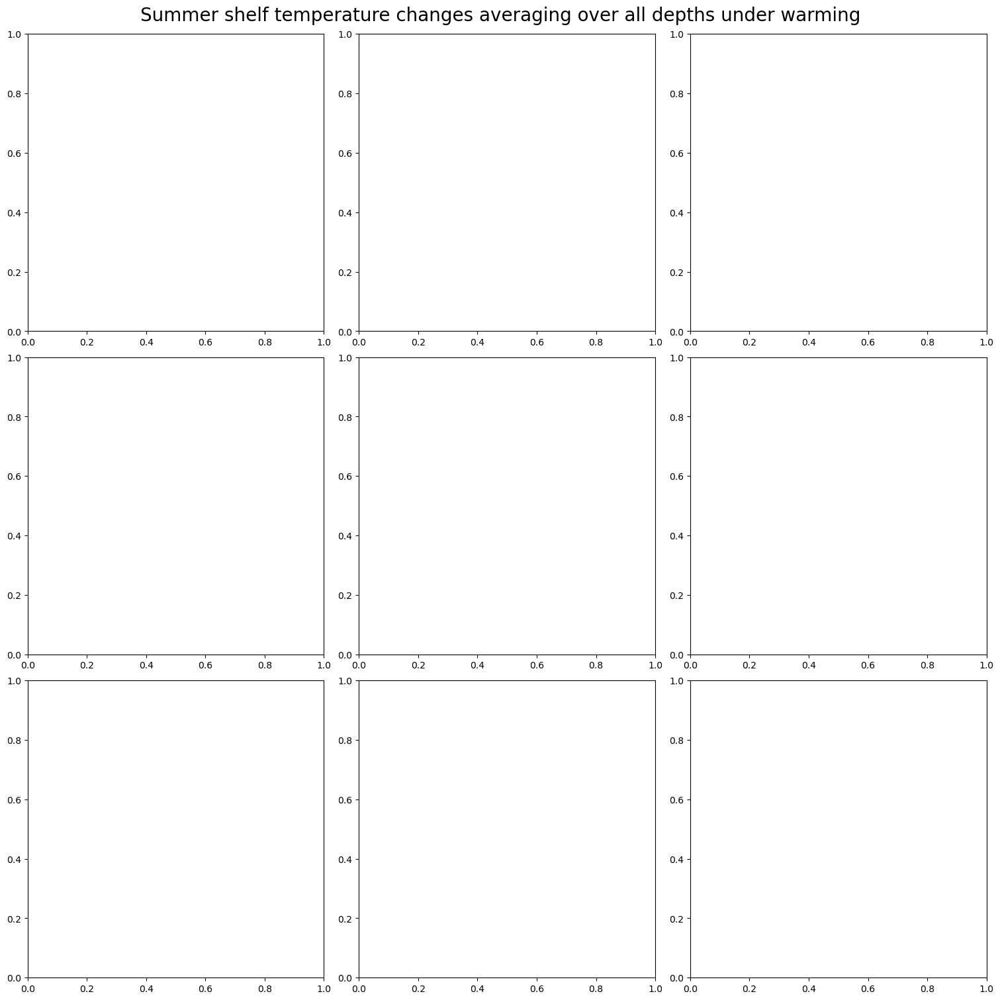

In [90]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Summer shelf temperature changes averaging over all depths under warming', fontsize=20)
lvls = np.arange(-0.4, 0.4, 0.1)
summer_circumpolar_plotting(temp_st_shelf_warmanom)

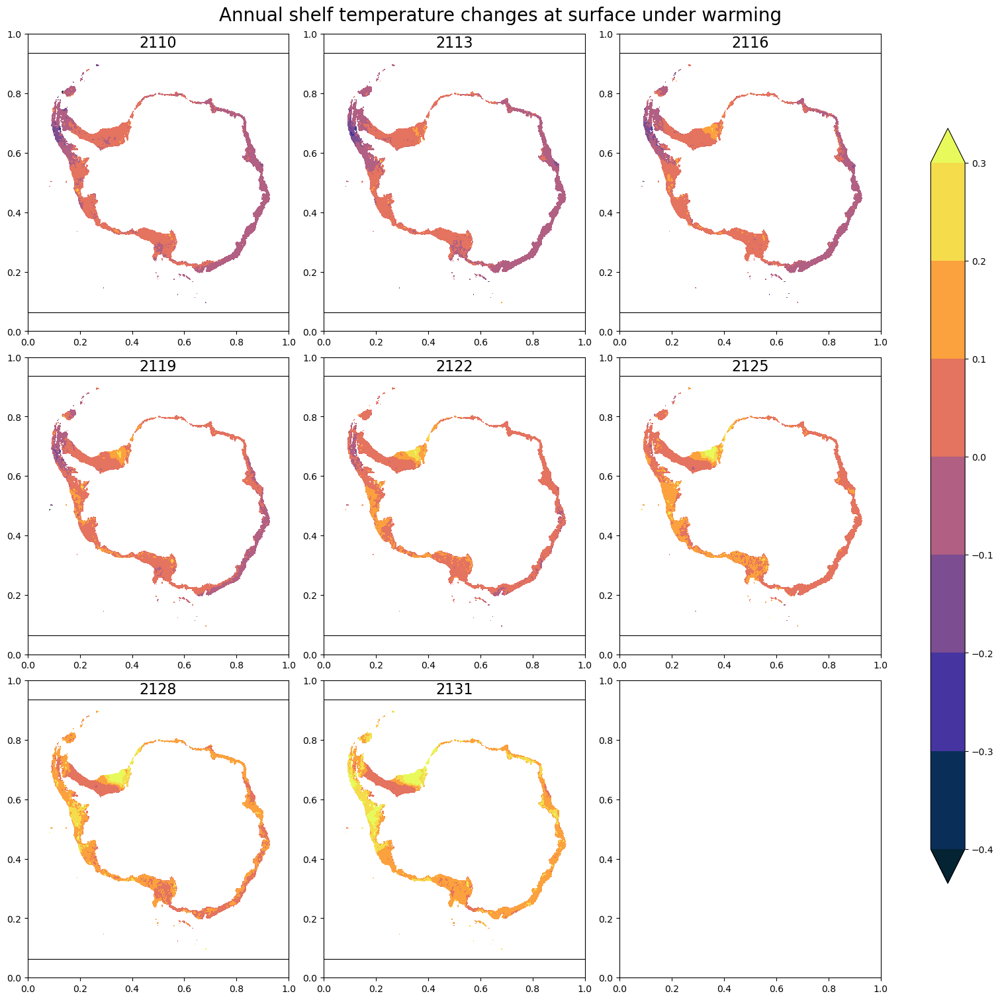

In [60]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Annual shelf temperature changes at surface under warming', fontsize=20)
lvls = np.arange(-0.4, 0.4, 0.1)
annual_circumpolar_plotting(temp_surface_shelf_warmanom)

In [ ]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Summer shelf temperature changes at surface under warming', fontsize=20)
lvls = np.arange(-0.4, 0.4, 0.1)
summer_circumpolar_plotting(temp_surface_shelf_warmanom)

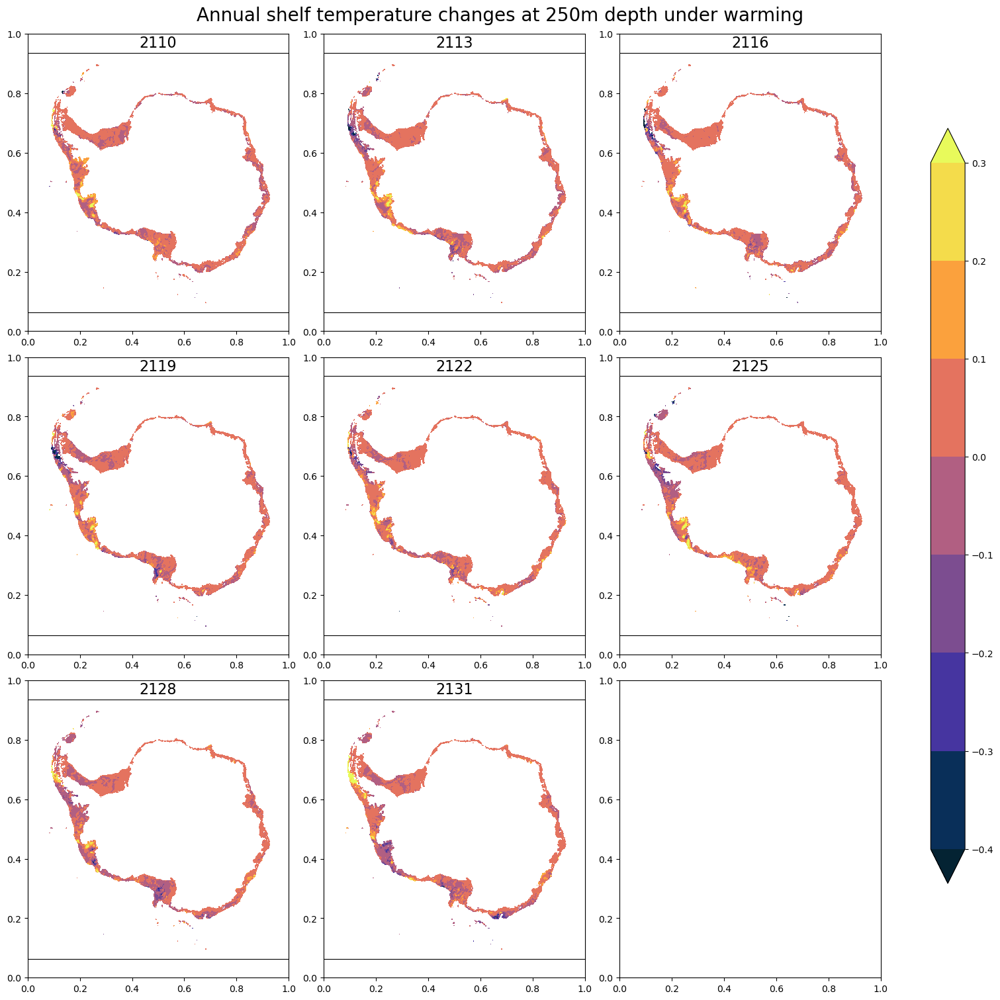

In [61]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Annual shelf temperature changes at 250m depth under warming', fontsize=20)
lvls = np.arange(-0.4, 0.4, 0.1)
annual_circumpolar_plotting(temp_250m_shelf_warmanom)

In [ ]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Summer shelf temperature changes at 250m depth under warming', fontsize=20)
lvls = np.arange(-0.4, 0.4, 0.1)
summer_circumpolar_plotting(temp_250m_shelf_warmanom)

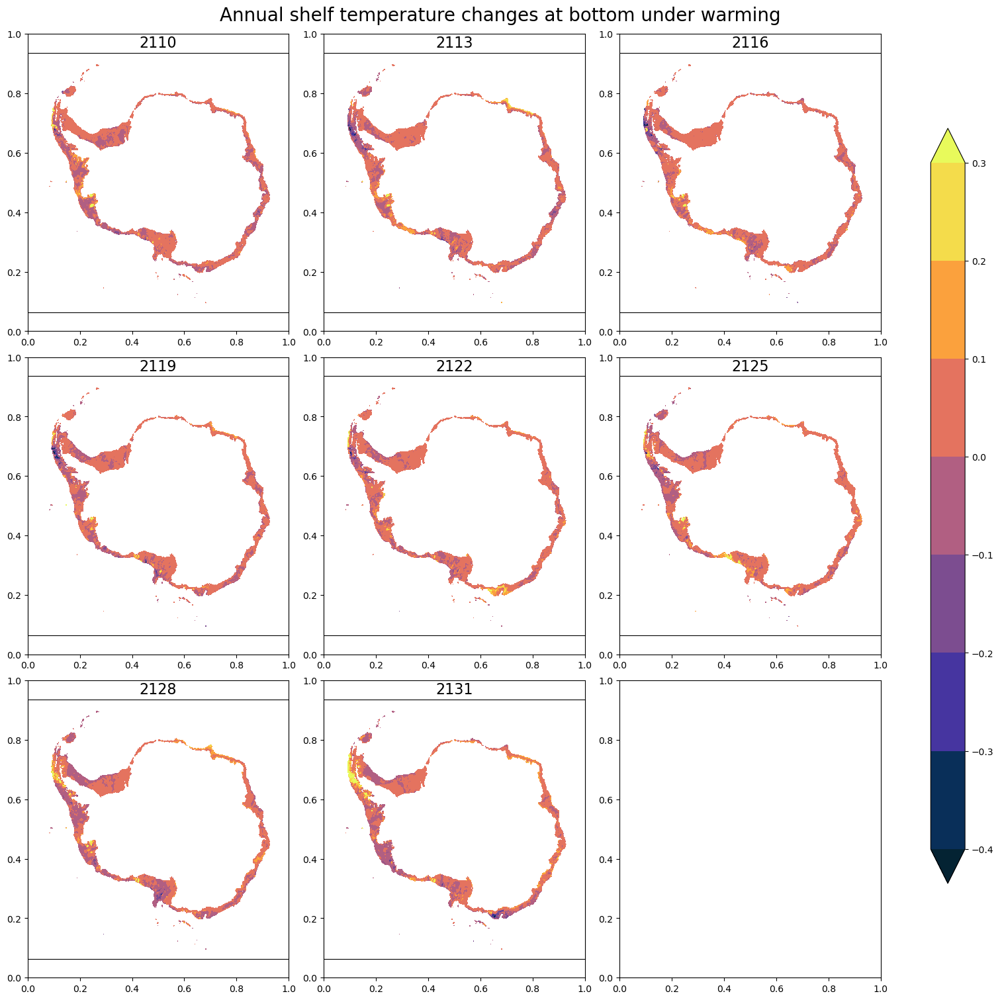

In [62]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Annual shelf temperature changes at bottom under warming', fontsize=20)
lvls = np.arange(-0.4, 0.4, 0.1)
annual_circumpolar_plotting(temp_bottom_shelf_warmanom)

In [ ]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Summer shelf temperature changes at bottom under warming', fontsize=20)
lvls = np.arange(-0.4, 0.4, 0.1)
summer_circumpolar_plotting(temp_bottom_shelf_warmanom)

## Temperature changes under only melting

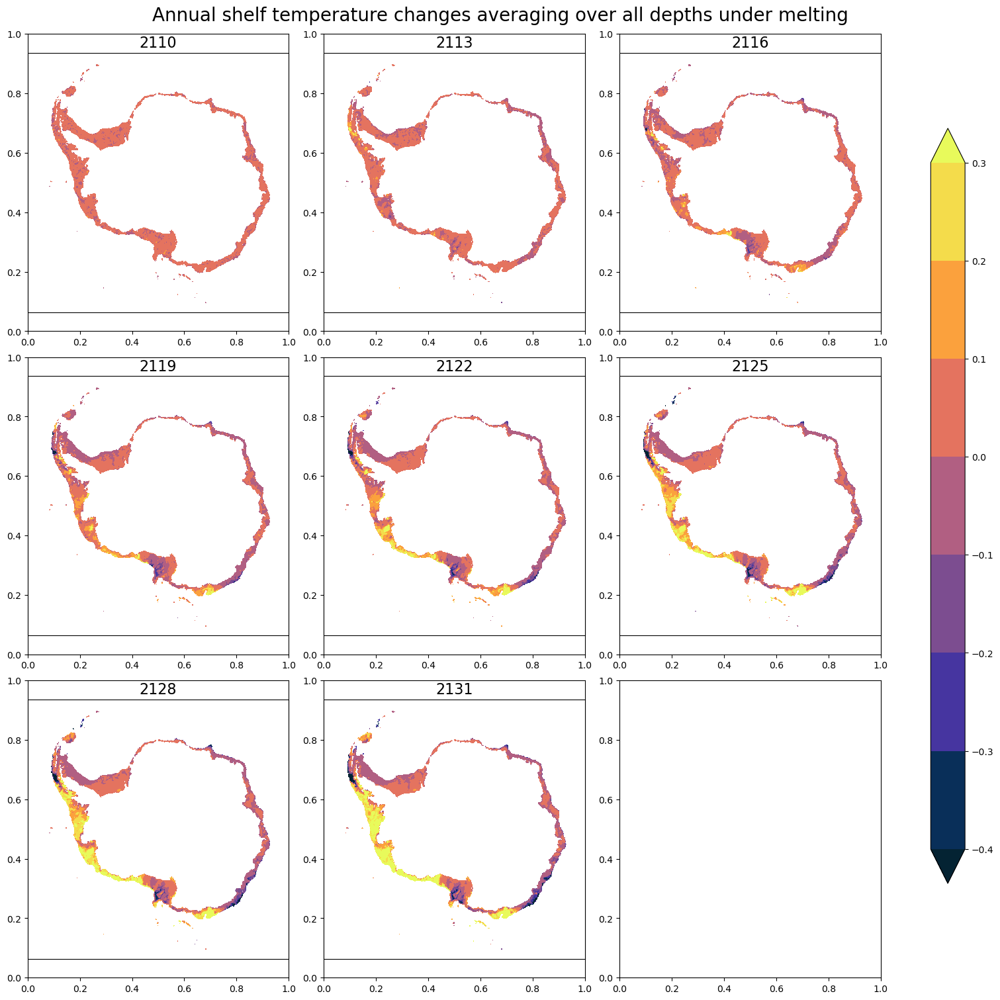

In [63]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Annual shelf temperature changes averaging over all depths under melting', fontsize=20)
lvls = np.arange(-0.4, 0.4, 0.1)
annual_circumpolar_plotting(temp_st_shelf_meltanom)

In [ ]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Summer shelf temperature changes averaging over all depths under melting', fontsize=20)
lvls = np.arange(-0.4, 0.4, 0.1)
summer_circumpolar_plotting(temp_st_shelf_meltanom)

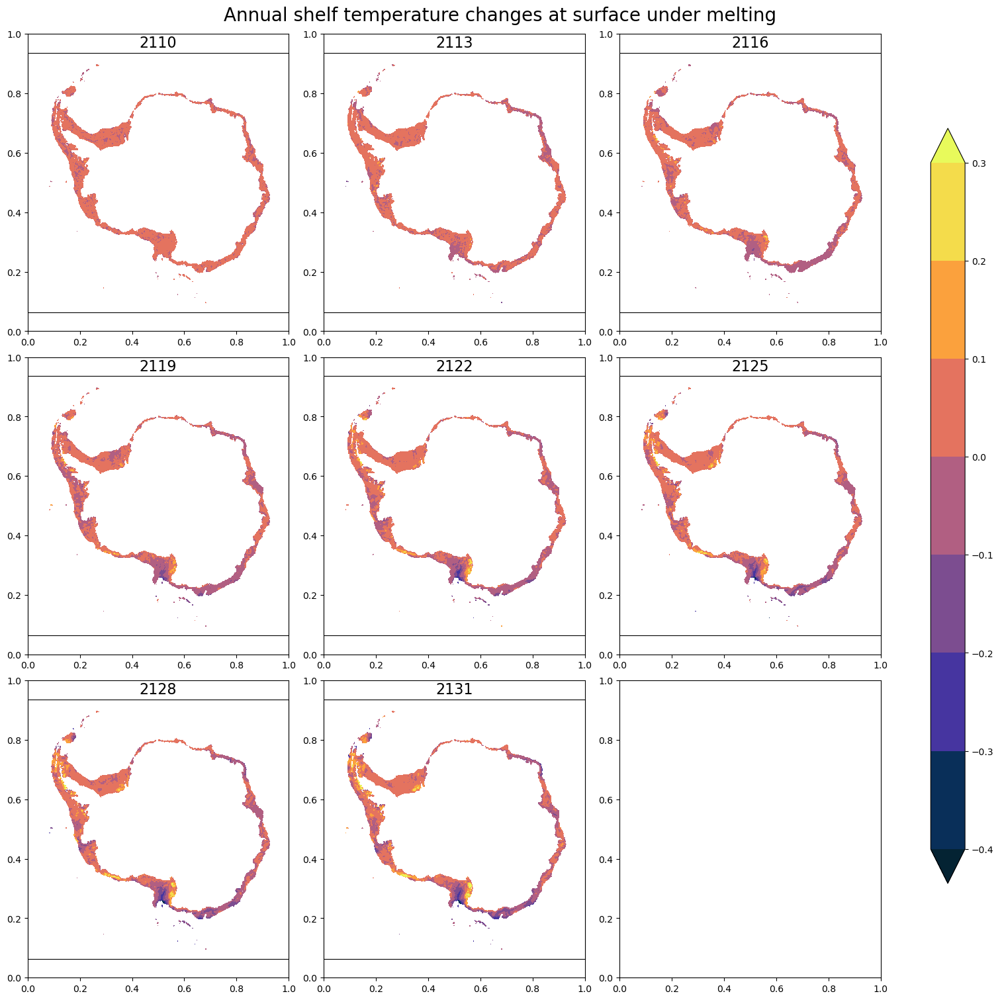

In [64]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Annual shelf temperature changes at surface under melting', fontsize=20)
lvls = np.arange(-0.4, 0.4, 0.1)
annual_circumpolar_plotting(temp_surface_shelf_meltanom)

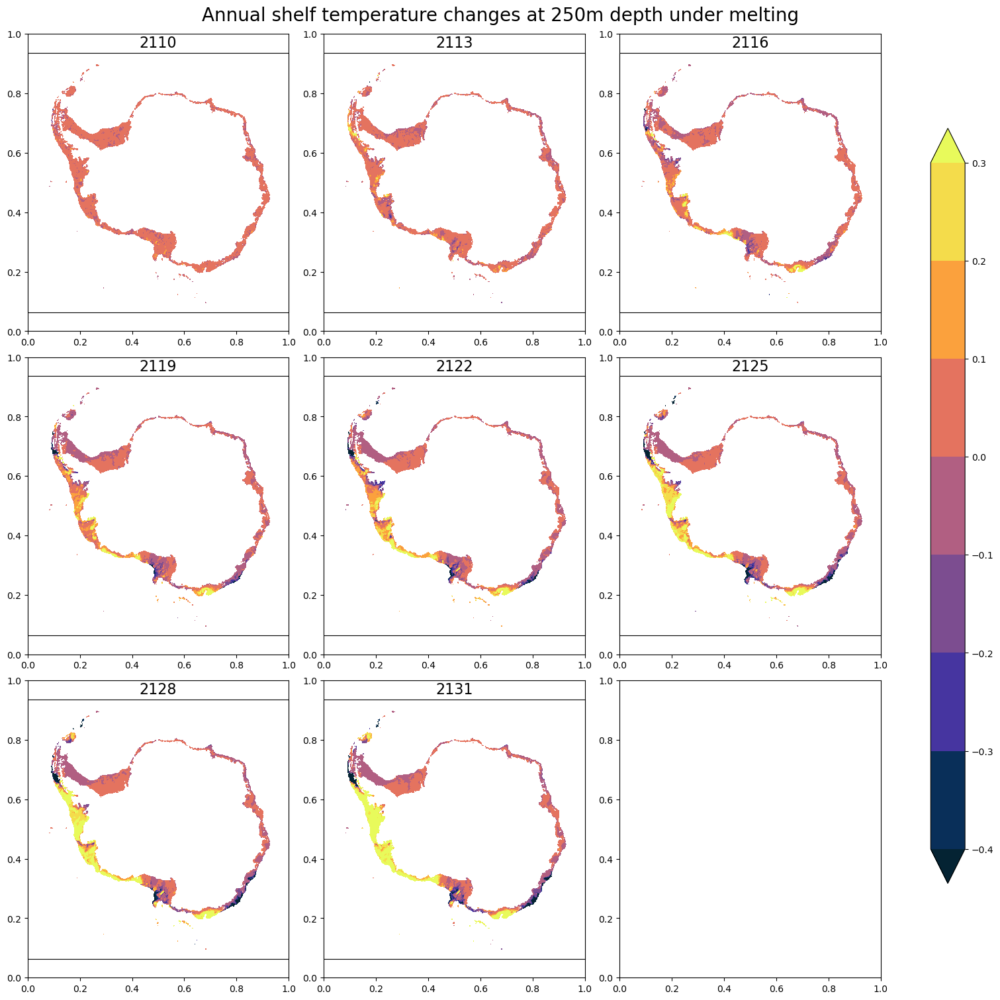

In [65]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Annual shelf temperature changes at 250m depth under melting', fontsize=20)
lvls = np.arange(-0.4, 0.4, 0.1)
annual_circumpolar_plotting(temp_250m_shelf_meltanom)

TypeError: invalid indexer array, does not have integer dtype: array('DJF', dtype='<U3')

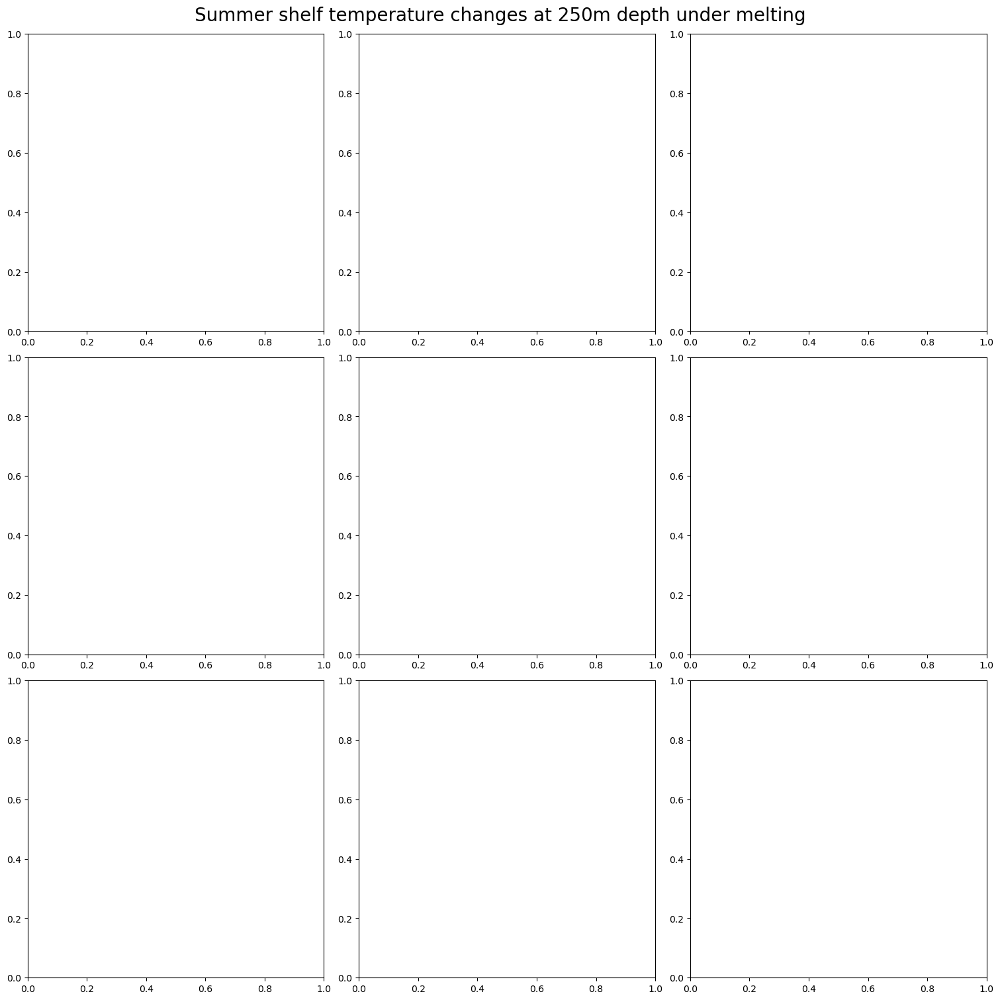

In [91]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Summer shelf temperature changes at 250m depth under melting', fontsize=20)
lvls = np.arange(-0.4, 0.4, 0.1)
summer_circumpolar_plotting(temp_250m_shelf_meltanom)

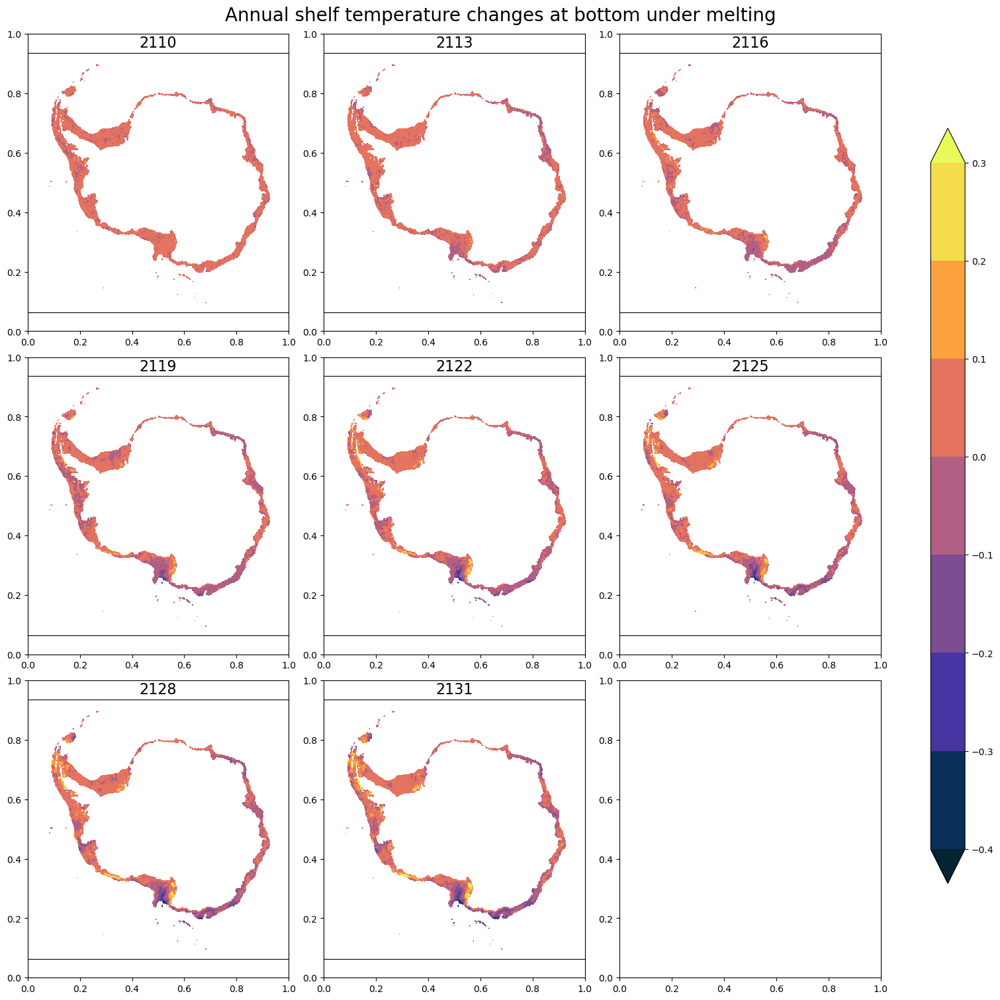

In [66]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Annual shelf temperature changes at bottom under melting', fontsize=20)
lvls = np.arange(-0.4, 0.4, 0.1)
annual_circumpolar_plotting(temp_surface_shelf_meltanom)

In [ ]:
fig, axes = plt.subplots(3,3, figsize=(15,15), constrained_layout=True)
fig.suptitle('Summer shelf temperature changes at bottom under melting', fontsize=20)
lvls = np.arange(-0.4, 0.4, 0.1)
summer_circumpolar_plotting(temp_surface_shelf_meltanom)

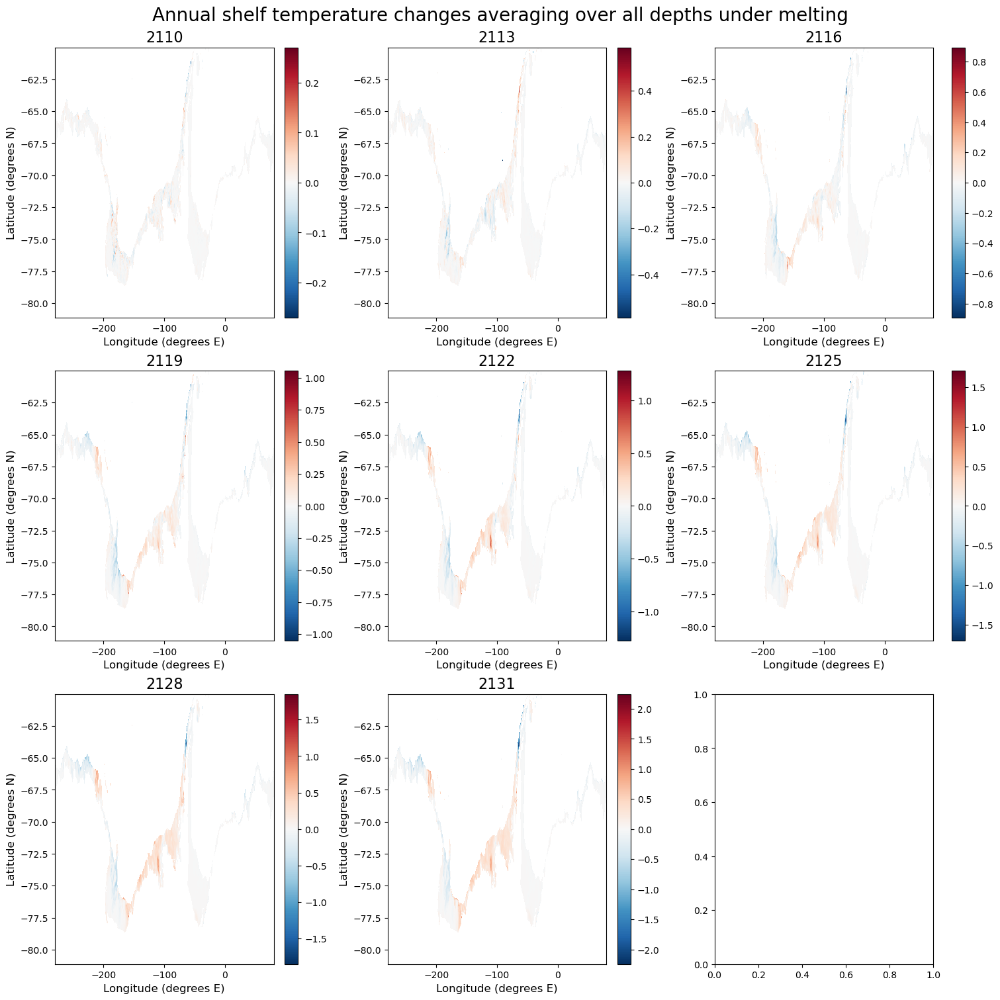

In [68]:
fig, axes = plt.subplots(3,3, figsize=(15,8), constrained_layout=True)
fig.suptitle('Annual shelf temperature changes averaging over all depths under melting', fontsize=20)
annual_shelf_plotting(temp_st_shelf_meltanom)